In [221]:
import hssm
import hssm.plotting
import numpy as np
import pandas as pd
import arviz as az
import seaborn as sns
from matplotlib import pyplot as plt
import bambi as bmb
import statsmodels.api as sm
from pymer4.models import Lmer
from scipy import stats
from scipy.stats import pearsonr
from matplotlib.patches import Patch
from matplotlib.colors import to_rgb
from scipy.interpolate import UnivariateSpline
import matplotlib.patheffects as pe
from statsmodels.stats.outliers_influence import variance_inflation_factor
from numpy.polynomial.legendre import legvander
import statsmodels.formula.api as smf
from scipy.stats import norm
from gensim.models import KeyedVectors
import os
from scipy.stats import ttest_ind
from numpy.polynomial.polynomial import polyvander


In [222]:
# NOTE
# requirements.txt provides the environment information you need for running this script
# run_models.ipynb generates the model outputs that will be used in multiple analyses in this script. 

# For all our regression analysis, as a general rule, we started with maximal mixed-effects models for 
# all our regressions and when models failed to convergeor produced singular fits, we simplified the random 
# effects structure in a stepwise manner

# In Study 1, for all regressions involving the depression predictor, 'More Depressed' was the baseline by 
# default. Since we are interested in the effect of depression i.e. we want HC as the baseline, we multiply the 
# estimated coefficients by -1 when reporting in the manuscript. 

In [223]:
pair_df_study1 = pd.read_csv('../task_data/study_1/pairings.csv')
pair_df_study2 = pd.read_csv('../task_data/study_2/pairings.csv')

In [224]:
pair_df_study1['rt'] = pair_df_study1['rt']/1000
pair_df_study2['rt'] = pair_df_study2['rt']/1000


In [225]:
# define conditions
conditions = [
    (pair_df_study1["valence_left"].eq("positive") & pair_df_study1["valence_right"].eq("negative")),  # left pos, right neg
    (pair_df_study1["valence_left"].eq("negative") & pair_df_study1["valence_right"].eq("positive"))   # left neg, right pos
]

# define choices
choices = [-1, 1]

# assign values
pair_df_study1["delta_valence"] = np.select(conditions, choices, default=0)

In [226]:
# define conditions
conditions = [
    (pair_df_study2["valence_left"].eq("positive") & pair_df_study2["valence_right"].eq("negative")),  # left pos, right neg
    (pair_df_study2["valence_left"].eq("negative") & pair_df_study2["valence_right"].eq("positive"))   # left neg, right pos
]

# define choices
choices = [-1, 1]

# assign values
pair_df_study2["delta_valence"] = np.select(conditions, choices, default=0)

In [227]:
from scipy.stats import kendalltau

def kendall_tb(df, x="delta_valence", y="r_diff_norm"):
    sub = df[[x, y]].dropna()
    tau, p = kendalltau(sub[x], sub[y])  # tau-b by default; handles ties correctly
    return tau, p

tau1, p1 = kendall_tb(pair_df_study1)
print(f"{tau1:.3f} {p1:.3f}")

tau2, p2 = kendall_tb(pair_df_study2)
print(f"{tau2:.3f} {p2:.3f}")

0.297 0.000
0.156 0.000


In [228]:
choice_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/choice_regressor_model.nc')
choice_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/choice_regressor_model.nc')

In [229]:
rt_study1_sb = az.InferenceData.from_netcdf('../../model_output/study_1/rt_regressor_model.nc')
rt_study2_sb = az.InferenceData.from_netcdf('../../model_output/study_2/rt_regressor_model.nc')

In [230]:
rt_study1_valence = az.InferenceData.from_netcdf('../../model_output/study_1/rt_valence_regressor_model.nc')
rt_study2_valence = az.InferenceData.from_netcdf('../../model_output/study_2/rt_valence_regressor_model.nc')

In [231]:
def draw_posterior_clean(
    idata, var, ax, color, alpha,
    mean_y_frac=0.45,
    hdi_y_frac=0.12,
    hdi_prob=0.95,
    linestyle="-",            # ← NEW
    kde_linewidth=3,
    mean_fontsize=22,
    hdi_fontsize=22,
    hdi_round=1,
    bar_lw=4,
    ref_val=0,
    vline_at_zero=True,
    vline_color="black",            # ← change from red to black
    vline_kwargs=None,
    hdi_text_gap_frac=0.05,
    hdi_text_va="top",
    hdi_text_pad_px=0,
):

    s = idata.posterior[var].values.reshape(-1)

    if vline_at_zero:
        kw = dict(color=vline_color, linewidth=2.5, alpha=0.9, zorder=0)
        if vline_kwargs:
            kw.update(vline_kwargs)
        ax.axvline(0, **kw)

    az.plot_kde(
        s,
        ax=ax,
        plot_kwargs=dict(
            color=color,
            alpha=alpha,
            linewidth=kde_linewidth,
            linestyle=linestyle,   # ← NEW
            zorder=2
        )
    )

    mean_val = float(np.mean(s))
    hdi_lo, hdi_hi = az.hdi(s, hdi_prob=hdi_prob)

    y0, y1 = ax.get_ylim()
    yr = y1 - y0
    y_mean = y0 + mean_y_frac * yr
    y_hdi  = y0 + hdi_y_frac  * yr

    ax.text(
        mean_val, y_mean,
        f"mean={mean_val:.2f}",
        color=color, alpha=alpha,
        ha="center", va="bottom",
        fontsize=mean_fontsize, zorder=3,
        path_effects=[pe.withStroke(linewidth=2, foreground="white", alpha=0.7)]
    )

    ax.hlines(
        y_hdi, hdi_lo, hdi_hi,
        color=color, alpha=alpha,  linestyle=linestyle,
        linewidth=bar_lw, zorder=3
    )

    gap = hdi_text_gap_frac * yr
    y_text = y_hdi - gap if hdi_text_va.lower() == "top" else y_hdi + gap
    va = "top" if hdi_text_va.lower() == "top" else "bottom"

    for xval, txt in [(hdi_lo, f"{hdi_lo:.{hdi_round}f}"),
                      (hdi_hi, f"{hdi_hi:.{hdi_round}f}")]:
        ax.text(
            xval, y_text, txt,
            color=color, alpha=alpha,
            ha="center", va=va,
            fontsize=hdi_fontsize, zorder=4,
            path_effects=[pe.withStroke(linewidth=2, foreground="white", alpha=0.6)]
        )


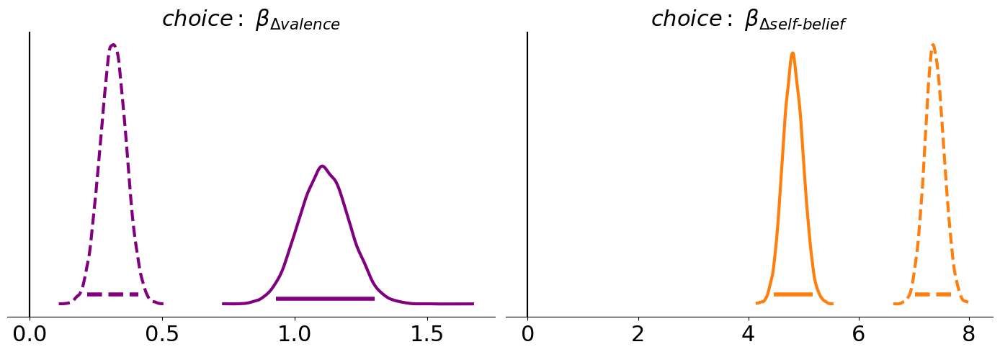

In [232]:
# GENERATING FIGURE 2a (Choice Regressor Coefficients)

label_map = {
    "delta_valence": r'$choice:\ \beta_{\Delta valence}$',
    "r_diff_norm": r'$choice:\ \beta_{\Delta self\text{-}belief}$'
}

color_map = {
    "delta_valence": "purple",
    "r_diff_norm": "#FF7F0E"
}

vars_of_interest = list(label_map.keys())

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes = axes.flatten()

for i, var in enumerate(vars_of_interest):

    ax = axes[i]
    color = color_map[var]

    # ---------------------------
    # Study 1 → SOLID
    # ---------------------------
    draw_posterior_clean(
        idata=choice_study1,
        var=var,
        ax=ax,
        color=color,
        alpha=1.0,
        linestyle="-",          # solid
        hdi_y_frac=0.08         # lower bar
    )

    # ---------------------------
    # Study 2 → DASHED
    # ---------------------------
    draw_posterior_clean(
        idata=choice_study2,
        var=var,
        ax=ax,
        color=color,
        alpha=1.0,
        linestyle="--",         # dashed
        hdi_y_frac=0.08         # slightly above study 1
    )

    # Styling
    ax.set_title(label_map[var], fontsize=22)
    ax.set_ylabel("")
    ax.tick_params(axis='x', labelsize=22)
    ax.tick_params(axis='y', left=False, labelleft=False)

    for side in ['left', 'right', 'top']:
        ax.spines[side].set_visible(False)

    # Remove all ArviZ text annotations
    for txt in axes[i].texts:
        txt.set_visible(False)

    # Force vertical reference line at 0 to black
    for line in axes[i].lines:
        x = line.get_xdata()
        if len(x) == 2 and np.allclose(x, [0, 0]):
            line.set_color("black")
            line.set_linewidth(1.5)

plt.tight_layout()
plt.savefig(
    "../plots/choice_regression_coefficients",
    dpi=300,
    bbox_inches="tight"
)
plt.show()


In [233]:
# Supplementary Table 1 - Choice Regressor Summary  

print(az.summary(choice_study1,hdi_prob=0.95).head())

print(az.summary(choice_study2,hdi_prob=0.95).head())

                              mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
Intercept                   -0.125  0.026    -0.177     -0.074      0.000   
delta_valence                1.112  0.095     0.931      1.301      0.001   
r_diff_norm                  4.810  0.183     4.455      5.166      0.002   
1|subject_sigma              0.308  0.032     0.245      0.371      0.000   
delta_valence|subject_sigma  1.339  0.096     1.157      1.529      0.001   

                             mcse_sd  ess_bulk  ess_tail  r_hat  
Intercept                      0.000   20368.0   15381.0    1.0  
delta_valence                  0.001    9005.0   12164.0    1.0  
r_diff_norm                    0.001   12726.0   14699.0    1.0  
1|subject_sigma                0.000    8157.0   12413.0    1.0  
delta_valence|subject_sigma    0.001    7792.0   12838.0    1.0  
                              mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
Intercept                   -0.099  0.017    -0.132     -0.065  

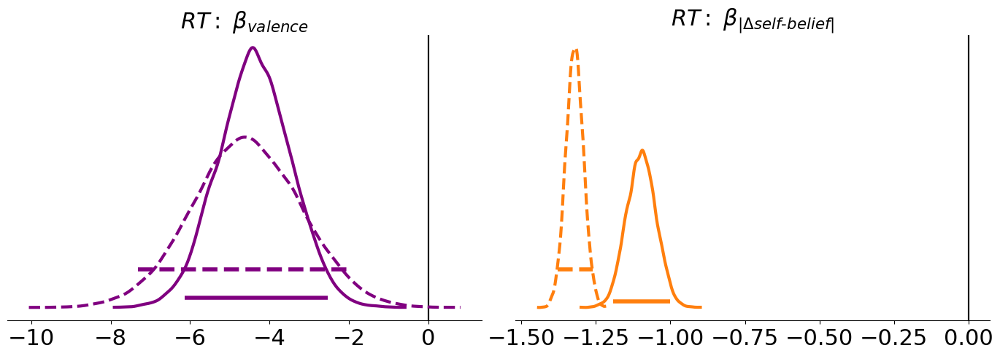

In [234]:
# GENERATING FIGURE 2b (RT Regressor Coefficients)

label_map = {
    "pos_neg_lin": r'$RT:\ \beta_{valence}$',
    "r_diff_norm_abs": r'$RT:\ \beta_{|\Delta self\text{-}belief|}$'
}

color_map = {
    "pos_neg_lin": "purple",
    "r_diff_norm_abs": "#FF7F0E"
}

vars_of_interest = list(label_map.keys())

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes = axes.flatten()

for i, var in enumerate(vars_of_interest):

    ax = axes[i]
    color = color_map[var]

    # =========================
    # LEFT PANEL: beta_valence
    # =========================
    if var == "pos_neg_lin":

        # Study 1 → SOLID
        draw_posterior_clean(
            idata=rt_study1_valence,
            var=var,
            ax=ax,
            color=color,
            alpha=1.0,
            linestyle="-",
            hdi_y_frac=0.08
        )

        # Study 2 → DASHED
        draw_posterior_clean(
            idata=rt_study2_valence,
            var=var,
            ax=ax,
            color=color,
            alpha=1.0,
            linestyle="--",
            hdi_y_frac=0.18
        )

    # =========================
    # RIGHT PANEL: beta_|delta_self-belief|
    # =========================
    if var == "r_diff_norm_abs":

        # Study 1 → SOLID
        draw_posterior_clean(
            idata=rt_study1_sb,
            var=var,
            ax=ax,
            color=color,
            alpha=1.0,
            linestyle="-",
            hdi_y_frac=0.08
        )

        # Study 2 → DASHED
        draw_posterior_clean(
            idata=rt_study2_sb,
            var=var,
            ax=ax,
            color=color,
            alpha=1.0,
            linestyle="--",
            hdi_y_frac=0.18
        )

    # =========================
    # Formatting
    # =========================
    ax.set_title(label_map[var], fontsize=22)
    ax.set_ylabel("")
    ax.tick_params(axis='x', labelsize=22)
    ax.tick_params(axis='y', left=False, labelleft=False)

    for side in ['left', 'right', 'top']:
        ax.spines[side].set_visible(False)

    # Remove ArviZ annotations
    for txt in axes[i].texts:
        txt.set_visible(False)

    # Force vertical reference line at 0 to black
    for line in axes[i].lines:
        x = line.get_xdata()
        if len(x) == 2 and np.allclose(x, [0, 0]):
            line.set_color("black")
            line.set_linewidth(1.5)

plt.tight_layout()
plt.savefig(
    "../plots/rt_regression_coefficients",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

In [235]:
# Supplementary Table 2 - RT Self-Belief Regressor Summary

print(az.summary(rt_study1_sb,hdi_prob=0.95).head())

print(az.summary(rt_study2_sb,hdi_prob=0.95).head())

# Val Left values were initially coded as Negative (+1) and Positive (-1)
# Val Left values reported in supplementary table are values multiplied with -1 to correspond to Postive (+1) and Negative (-1) 

                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
sigma            0.946  0.006     0.935      0.957        0.0      0.0   
Intercept        0.221  0.013     0.196      0.245        0.0      0.0   
val_left         0.074  0.010     0.053      0.094        0.0      0.0   
val_right       -0.077  0.011    -0.098     -0.057        0.0      0.0   
r_diff_norm_abs -1.098  0.050    -1.192     -1.000        0.0      0.0   

                 ess_bulk  ess_tail  r_hat  
sigma             38921.0   14236.0    1.0  
Intercept         43976.0   13907.0    1.0  
val_left          23835.0   17001.0    1.0  
val_right         21462.0   17164.0    1.0  
r_diff_norm_abs   44127.0   14346.0    1.0  
                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
sigma            0.961  0.003     0.955      0.968        0.0      0.0   
Intercept        0.322  0.009     0.306      0.339        0.0      0.0   
val_left         0.015  0.006     0.003      0.027        0.0  

In [236]:
# Supplementary Table 3 - RT Valence Regressor Summary

print(az.summary(rt_study1_valence,hdi_prob=0.95).head())

print(az.summary(rt_study2_valence,hdi_prob=0.95).head())


                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
sigma            0.877  0.010     0.858      0.896      0.000    0.000   
Intercept       -0.227  0.015    -0.255     -0.197      0.000    0.000   
pos_neg_lin     -4.371  0.922    -6.128     -2.534      0.006    0.007   
pos_neg_quad    -0.984  0.938    -2.860      0.809      0.006    0.007   
1|subject_sigma  0.149  0.021     0.106      0.190      0.000    0.000   

                 ess_bulk  ess_tail  r_hat  
sigma             11673.0   13501.0    1.0  
Intercept         18412.0   15996.0    1.0  
pos_neg_lin       27915.0   14739.0    1.0  
pos_neg_quad      25115.0   15650.0    1.0  
1|subject_sigma    5887.0    8098.0    1.0  
                   mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
sigma             0.929  0.006     0.917      0.940      0.000    0.000   
Intercept        -0.062  0.008    -0.079     -0.046      0.000    0.000   
pos_neg_lin      -4.584  1.362    -7.319     -1.984      0.0

In [237]:
# Loading the DDM models

drift_full_model_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/drift_full_model.nc')
drift_full_model_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/drift_full_model.nc')

drift_self_belief_model_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/drift_self_belief_model.nc')
drift_valence_model_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/drift_valence_model.nc')
drift_no_reg_model_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/drift_no_reg_model.nc')

drift_self_belief_model_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/drift_self_belief_model.nc')
drift_valence_model_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/drift_valence_model.nc')
drift_no_reg_model_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/drift_no_reg_model.nc')


In [238]:
# EXTRACTING DIC FOR GENERATING FIGURE 3a (Model Comparison)

# The code for generating the .csv files used here is in run_models.ipynb

dic_df_study1 = pd.read_csv('../../model_output/study_1/dic_models.csv')
dic_df_study2 = pd.read_csv('../../model_output/study_2/dic_models.csv')

baseline_dic_study1 = dic_df_study1.loc[dic_df_study1["Model Number"] == "no_reg", "DIC"].iloc[0]
baseline_dic_study2 = dic_df_study2.loc[dic_df_study2["Model Number"] == "no_reg", "DIC"].iloc[0]

dic_delta_study1 = (
    dic_df_study1[dic_df_study1["Model Number"] != "no_reg"]
      .assign(delta=lambda d: d["DIC"] - baseline_dic_study1)
)

dic_delta_study2 = (
    dic_df_study2[dic_df_study2["Model Number"] != "no_reg"]
      .assign(delta=lambda d: d["DIC"] - baseline_dic_study2)
)

delta_study2 = dic_delta_study2[['Model name','delta']].copy()
delta_study1= dic_delta_study1[['Model name','delta']].copy()

delta_study2['study'] = 'Study2'
delta_study1['study'] = 'Study1'

delta_study_combo = pd.concat([delta_study2,delta_study1],axis =0, ignore_index = True)


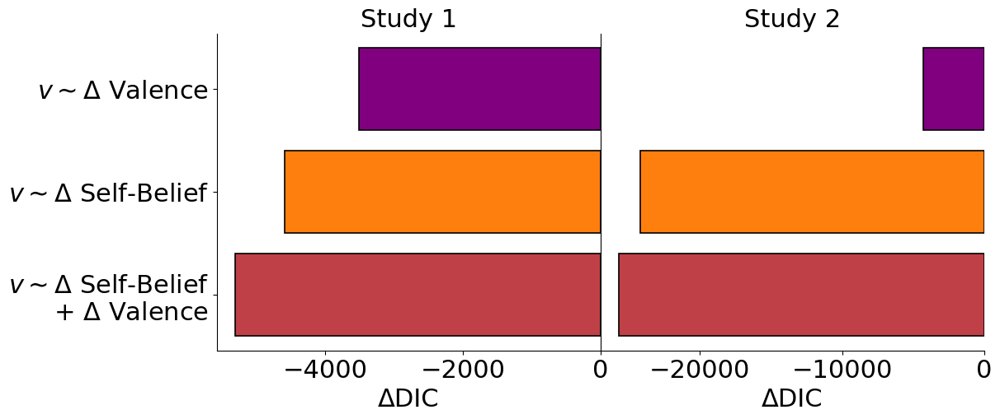

In [239]:
# GENERATING FIGURE 3a

# --- Mapping model names to nicer labels ---
label_map = {
    "v ~ 1 + delta_valence": r"$v \sim \Delta$ Valence",
    "v ~ 1 + r_diff_norm": r"$v \sim \Delta$ Self-Belief",
    "v ~ 1 + r_diff_norm + delta_valence": r"$v \sim \Delta$ Self-Belief" + "\n" + r"$+\ \Delta$ Valence"
}

# define base colors
purple = to_rgb("purple")
orange = to_rgb("#FF7F0E")   # stronger orange
# blend purple & orange
combo_color = tuple((np.array(purple) + np.array(orange)) / 2)

# --- Colors for bars ---
color_map = {
    r"$v \sim \Delta$ Valence": purple,
    r"$v \sim \Delta$ Self-Belief": orange,
    r"$v \sim \Delta$ Self-Belief" + "\n" + r"$+\ \Delta$ Valence": combo_color
}

# --- Add pretty labels ---
df = delta_study_combo.copy()
df["Regressor"] = df["Model name"].map(label_map)

# --- Ensure correct ordering ---
order = [r"$v \sim \Delta$ Valence",
         r"$v \sim \Delta$ Self-Belief",
         r"$v \sim \Delta$ Self-Belief" + "\n" + r"$+\ \Delta$ Valence"]

# --- Split into Study1 and Study2 ---
df1 = df[df["study"] == "Study1"].set_index("Regressor").loc[order].reset_index()
df2 = df[df["study"] == "Study2"].set_index("Regressor").loc[order].reset_index()

# --- Create figure ---
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharex=False)
fig.subplots_adjust(wspace=0)

# ---------------- Study 1 plot ----------------
axes[0].barh(
    df1["Regressor"], df1["delta"],
    color=[color_map[x] for x in df1["Regressor"]],
    edgecolor="black", linewidth=1.2
)
axes[0].set_title("Study 1", fontsize=22)
axes[0].set_xlabel("ΔDIC", fontsize=22)
axes[0].tick_params(axis='x', labelsize=22)
axes[0].tick_params(axis='y', labelsize=22)
axes[0].invert_yaxis()  # highest on top

# ---------------- Study 2 plot ----------------
axes[1].barh(
    df2["Regressor"], df2["delta"],
    color=[color_map[x] for x in df2["Regressor"]],
    edgecolor="black", linewidth=1.2
)
axes[1].set_title("Study 2", fontsize=22)
axes[1].set_xlabel("ΔDIC", fontsize=22)
axes[1].tick_params(axis='x', labelsize=22)
axes[1].tick_params(axis='y', labelsize=22)
axes[1].invert_yaxis()

# Remove y-axis labels and ticks on right plot
axes[1].set_yticklabels([])  
axes[1].set_yticks([])

# Clean aesthetics
for ax in axes:
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

fig.savefig(
    "../plots/model_comparison",
    dpi=300,
    bbox_inches="tight"
)
plt.show()


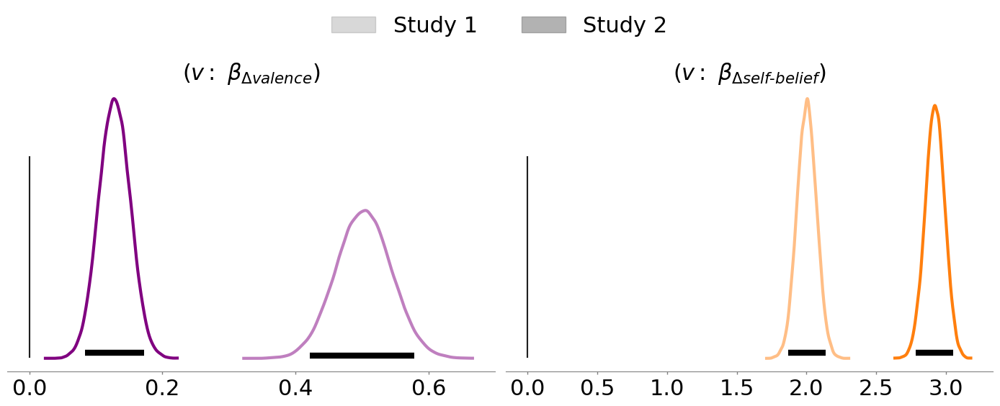

In [240]:
# GENERATING FIGURE 3b (Drift Regressor Coefficients)
 
# ============================================================
# Labels and colors
# ============================================================

label_map = {
    "v_delta_valence": r'$(v:\ \beta_{\Delta valence})$',
    "v_r_diff_norm": r'$(v:\ \beta_{\Delta self\text{-}belief})$'
}

color_map = {
    "v_delta_valence": "purple",
    "v_r_diff_norm": "#FF7F0E"
}

vars_of_interest = list(label_map.keys())

# ============================================================
# Figure setup
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes = axes.flatten()

# ============================================================
# Plotting loop
# ============================================================

for i, var in enumerate(vars_of_interest):

    color = color_map[var]

    # ---- Study 1 (lighter) ----
    az.plot_posterior(
        drift_full_model_study1,
        var_names=[var],
        ax=axes[i],
        kind="kde",
        color=color,
        alpha=0.5,
        ref_val=0,
        hdi_prob=None,
        linewidth=3
    )

    # ---- Study 2 (darker) ----
    az.plot_posterior(
        drift_full_model_study2,
        var_names=[var],
        ax=axes[i],
        kind="kde",
        color=color,
        alpha=1,
        ref_val=0,
        hdi_prob=None,
        linewidth=3
    )

    # Title
    axes[i].set_title(label_map[var], fontsize=22)

    # Keep x-axis ticks only
    axes[i].set_ylabel("")
    axes[i].tick_params(axis="x", labelsize=22)
    axes[i].tick_params(axis="y", left=False, labelleft=False)

    # Remove spines except bottom
    for side in ["left", "right", "top"]:
        axes[i].spines[side].set_visible(False)

    # Remove ALL ArviZ text (HDI, probabilities, etc.)
    for txt in axes[i].texts:
        txt.set_visible(False)

    # Force vertical reference line at 0 to black
    for line in axes[i].lines:
        x = line.get_xdata()
        if len(x) == 2 and np.allclose(x, [0, 0]):
            line.set_color("black")
            line.set_linewidth(1.5)

# ============================================================
# Legend
# ============================================================

legend_handles = [
    Patch(color="gray", alpha=0.3, label="Study 1"),
    Patch(color="gray", alpha=0.6, label="Study 2")
]

fig.legend(
    handles=legend_handles,
    fontsize=22,
    frameon=False,
    loc="upper center",
    ncol=2,
    bbox_to_anchor=(0.5, 1.15)
)

plt.tight_layout()
plt.savefig(
    "../plots/drift_regressors",
    dpi=300,
    bbox_inches="tight"
)
plt.show()


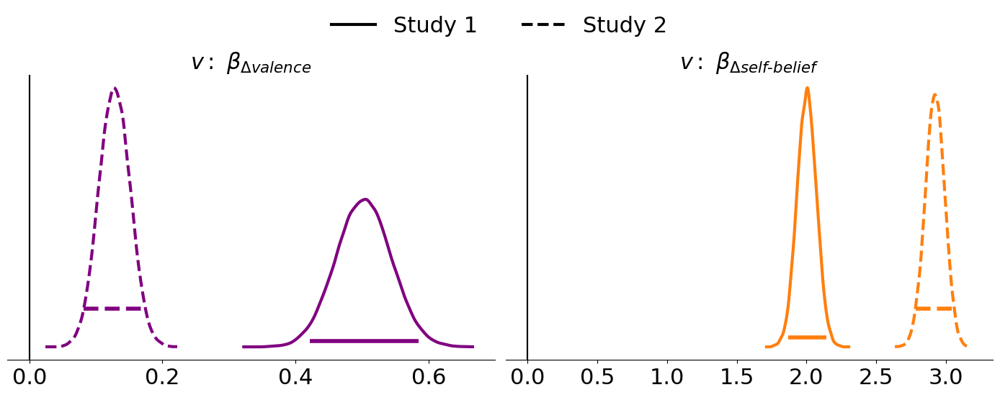

In [241]:
# GENERATING FIGURE 3b (Drift Regressor Coefficients)

label_map = {
    "v_delta_valence": r'$v:\ \beta_{\Delta valence}$',
    "v_r_diff_norm": r'$v:\ \beta_{\Delta self\text{-}belief}$'
}

color_map = {
    "v_delta_valence": "purple",
    "v_r_diff_norm": "#FF7F0E"
}

vars_of_interest = list(label_map.keys())

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes = axes.flatten()

for i, var in enumerate(vars_of_interest):

    ax = axes[i]
    color = color_map[var]

    # -------------------------
    # Study 1 → SOLID
    # -------------------------
    draw_posterior_clean(
        idata=drift_full_model_study1,
        var=var,
        ax=ax,
        color=color,
        alpha=1.0,
        linestyle="-",
        hdi_y_frac=0.08
    )

    # -------------------------
    # Study 2 → DASHED
    # -------------------------
    draw_posterior_clean(
        idata=drift_full_model_study2,
        var=var,
        ax=ax,
        color=color,
        alpha=1.0,
        linestyle="--",
        hdi_y_frac=0.18
    )

    # Title
    ax.set_title(label_map[var], fontsize=22)

    # Formatting
    ax.set_ylabel("")
    ax.tick_params(axis="x", labelsize=22)
    ax.tick_params(axis="y", left=False, labelleft=False)

    for side in ["left", "right", "top"]:
        ax.spines[side].set_visible(False)

    # Remove ALL ArviZ text (HDI, probabilities, etc.)
    for txt in axes[i].texts:
        txt.set_visible(False)

    # Force vertical reference line at 0 to black
    for line in axes[i].lines:
        x = line.get_xdata()
        if len(x) == 2 and np.allclose(x, [0, 0]):
            line.set_color("black")
            line.set_linewidth(1.5)

# ============================================================
# Legend (Line-based, matches posterior style)
# ============================================================

from matplotlib.lines import Line2D

legend_handles = [
    Line2D([0], [0], color="black", lw=3, linestyle="-", label="Study 1"),
    Line2D([0], [0], color="black", lw=3, linestyle="--", label="Study 2")
]

fig.legend(
    handles=legend_handles,
    fontsize=22,
    frameon=False,
    loc="upper center",
    ncol=2,
    bbox_to_anchor=(0.5, 1.12)
)

plt.tight_layout()
plt.savefig(
    "../plots/drift_regressors",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

In [242]:
# Supplementary Table 4 - Drift Regressor Summary

print(az.summary(drift_full_model_study1,  var_names = ['t','z','a','v_r_diff_norm',
                                          'v_delta_valence','v_Intercept'], hdi_prob=0.95).head(8))

print(az.summary(drift_full_model_study2,  var_names = ['t','z','a','v_r_diff_norm',
                                          'v_delta_valence','v_Intercept'], hdi_prob=0.95).head(8))

                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
t                0.541  0.004     0.533      0.549      0.000      0.0   
z                0.484  0.003     0.478      0.491      0.000      0.0   
a                1.103  0.005     1.092      1.113      0.000      0.0   
v_r_diff_norm    2.002  0.070     1.868      2.144      0.001      0.0   
v_delta_valence  0.502  0.042     0.421      0.585      0.000      0.0   
v_Intercept     -0.023  0.015    -0.052      0.006      0.000      0.0   

                 ess_bulk  ess_tail  r_hat  
t                 40779.0   33403.0    1.0  
z                 46225.0   31431.0    1.0  
a                 42287.0   32318.0    1.0  
v_r_diff_norm     19447.0   26350.0    1.0  
v_delta_valence   11235.0   19093.0    1.0  
v_Intercept       28681.0   30297.0    1.0  
                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
t                0.523  0.002     0.519      0.527      0.000    0.000   
z                0

In [243]:
# GENERATING FIGURE 3c (Paramter Recovery)

def calc_sub_effects(drift_full_model,study):
    
    # r_diff_norm
    random_effects_v_r_diff_norm = drift_full_model.posterior["v_r_diff_norm|subject"]
    subject_means_v_r_diff_norm = random_effects_v_r_diff_norm.mean(dim=["chain", "draw"])

    subject_means_v_r_diff_norm_df = subject_means_v_r_diff_norm.to_series().reset_index()
    subject_means_v_r_diff_norm_df.columns = ['subject', 're_v_r_diff_norm']

    # v intercept
    random_effects_v_intercept = drift_full_model.posterior["v_1|subject"]
    subject_means_v_intercept = random_effects_v_intercept.mean(dim = ["chain","draw"])

    subject_means_v_intercept_df = subject_means_v_intercept.to_series().reset_index()
    subject_means_v_intercept_df.columns = ['subject', 're_v_intercept']

    # v delta_valence
    random_effects_v_delta_valence = drift_full_model.posterior["v_delta_valence|subject"]
    subject_means_v_delta_valence = random_effects_v_delta_valence.mean(dim = ["chain","draw"])

    subject_means_v_delta_valence_df = subject_means_v_delta_valence.to_series().reset_index()
    subject_means_v_delta_valence_df.columns = ['subject', 're_v_delta_valence']

    random_effects_df = pd.merge(subject_means_v_intercept_df, subject_means_v_r_diff_norm_df, on='subject', how='inner')
    random_effects_df = pd.merge(random_effects_df,subject_means_v_delta_valence_df, on='subject', how='inner')

    random_effects_df.head()

    # Fixed Effects

    fixed_effects_df = az.summary(drift_full_model, var_names = ['t','z','a','v_r_diff_norm',
                                              'v_delta_valence','v_Intercept'])

    new_fixed_effects_df = fixed_effects_df['mean'].T.to_frame().T
    new_fixed_effects_df.columns = fixed_effects_df.index

    #################### Subject Effects (Fixed + Random Effects) ########################

    subject_effects_df = random_effects_df.copy()

    subject_effects_df['re_v_r_diff_norm'] = subject_effects_df['re_v_r_diff_norm'] + new_fixed_effects_df['v_r_diff_norm'].values[0]
    subject_effects_df['re_v_intercept'] = subject_effects_df['re_v_intercept'] + new_fixed_effects_df['v_Intercept'].values[0]
    subject_effects_df['re_v_delta_valence'] = subject_effects_df['re_v_delta_valence'] + new_fixed_effects_df['v_delta_valence'].values[0]

    subject_effects_df['z'] = new_fixed_effects_df['z'].values[0]
    subject_effects_df['t'] = new_fixed_effects_df['t'].values[0]
    subject_effects_df['a'] = new_fixed_effects_df['a'].values[0]

    subject_effects_df = subject_effects_df.rename(columns = {"re_v_r_diff_norm":"v_r_diff_norm",
                                                         "re_v_delta_valence":"v_delta_valence", 
                                                         "re_v_intercept":"v_intercept"})
    
    using_nonanon_models = 1 # Set this to 0 if model was fit on the github data, which is anonymized.

    if using_nonanon_models == 1:
        if study == 'study_1':
            mapping = pd.read_csv("../../subject_mapping_study1.csv")
            id_map = dict(zip(mapping["original_subject"], mapping["anonymized_subject"]))
        elif study == 'study_2':
            mapping = pd.read_csv("../../subject_mapping_study2.csv")
            id_map = dict(zip(mapping["original_subject"], mapping["anonymized_subject"]))

        subject_effects_df["subject"] = subject_effects_df["subject"].map(id_map)

    return subject_effects_df

In [244]:
# GENERATING FIGURE 3c (Paramter Recovery)


def do_pr (model_path, true_param_path, study):

    ddm_samples_recov = az.InferenceData.from_netcdf(model_path)

    subject_effects_df_recov = calc_sub_effects(ddm_samples_recov,study)
    
    ###################### Reading the true parameters####################
    pr_df = pd.read_csv(true_param_path)

    pr_df = pr_df.rename(columns = {'v_delta_valence':'v_delta_valence_og',
                                'v_r_diff_norm':'v_r_diff_norm_og',
                                'v_intercept':'v_intercept_og'})

    combined_info = pd.merge(pr_df,subject_effects_df_recov,on ='subject', how='inner')

    relevant_info = combined_info[['subject','v_delta_valence_og','v_r_diff_norm_og','v_r_diff_norm','v_delta_valence']].copy().drop_duplicates()

    ############### Plottting ###############################################

    fig, axes = plt.subplots(1, 2, figsize=(8, 6), dpi=300)  # 1 row, 2 columns

    # --- First plot: r_diff_norm ---
    ax = axes[0]
    x = relevant_info['v_r_diff_norm_og']
    y = relevant_info['v_r_diff_norm']
    cor_val = x.corr(y)

    ax.scatter(x, y,color="#FF7F0E")
    ax.set_xlabel('True', fontsize=26)
    ax.set_ylabel('Recovered', fontsize=26)
    #ax.set_title(r'$(v: \beta_{\Delta self-belief})$', fontsize=22)

    # identity line
    lims = [min(x.min(), y.min()), max(x.max(), y.max())]
    ax.plot(lims, lims, 'k--', linewidth=1)
    ax.set_xlim(lims)
    ax.set_ylim(lims)

    ax.tick_params(axis='x', labelsize=26)
    ax.tick_params(axis='y', labelsize=26)

    # correlation text
    ax.text(0.05, 0.95,
            f'r = {cor_val:.2f}',
            transform=ax.transAxes,
            fontsize=22,
            verticalalignment='top',
            color='firebrick')

    # --- Second plot: delta_valence ---
    ax = axes[1]
    x = relevant_info['v_delta_valence_og']
    y = relevant_info['v_delta_valence']
    cor_val = x.corr(y)

    ax.scatter(x, y,color="purple")
    ax.set_xlabel('True', fontsize=26)
    ax.set_ylabel('', fontsize=26)
    #ax.set_title(r'$(v: \beta_{\Delta valence})$', fontsize=22)

    # identity line
    lims = [min(x.min(), y.min()), max(x.max(), y.max())]
    ax.plot(lims, lims, 'k--', linewidth=1)
    ax.set_xlim(lims)
    ax.set_ylim(lims)

    ax.tick_params(axis='x', labelsize=26)
    ax.tick_params(axis='y', labelsize=26)

    # correlation text
    ax.text(0.05, 0.95,
            f'r = {cor_val:.2f}',
            transform=ax.transAxes,
            fontsize=22,
            verticalalignment='top',
            color='firebrick')
    #fig.suptitle("Study 1", fontsize=22, y=0.95)
    plt.tight_layout()
    fig.savefig(
        f"../plots/param_recovery_{study}",
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()



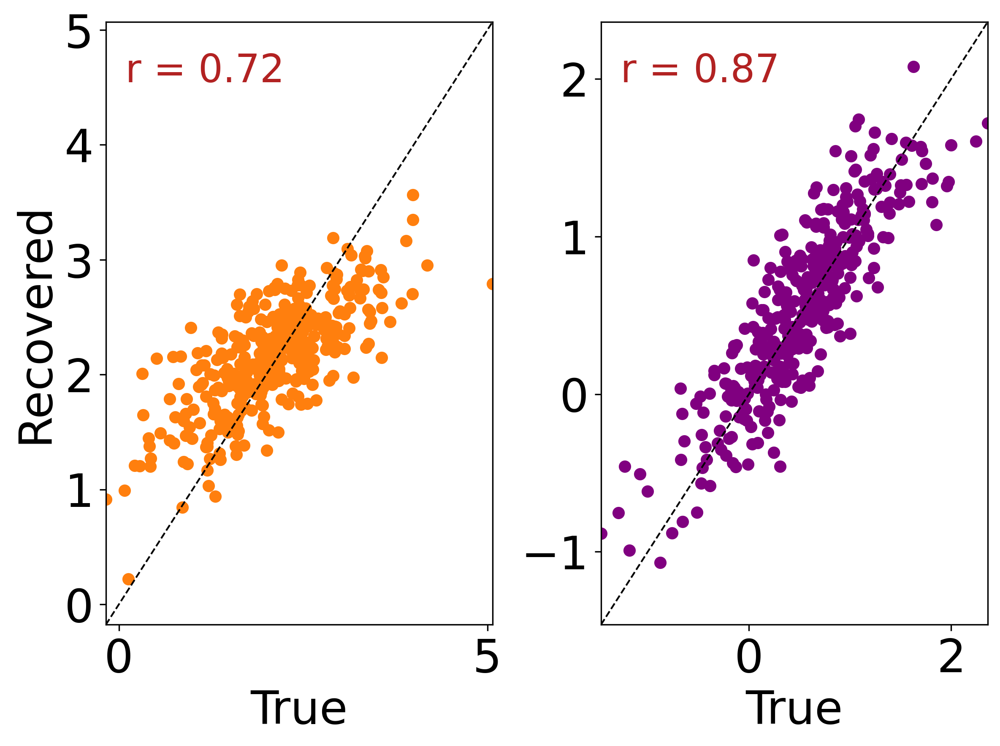

In [245]:
# Study 1

model_path_study1 = '../../model_output/study_1/drift_full_model_pr.nc'
true_param_path_study1 = '../task_data/study_1/drift_full_model_pr_true_param.csv'

do_pr(model_path_study1,true_param_path_study1,'study_1')


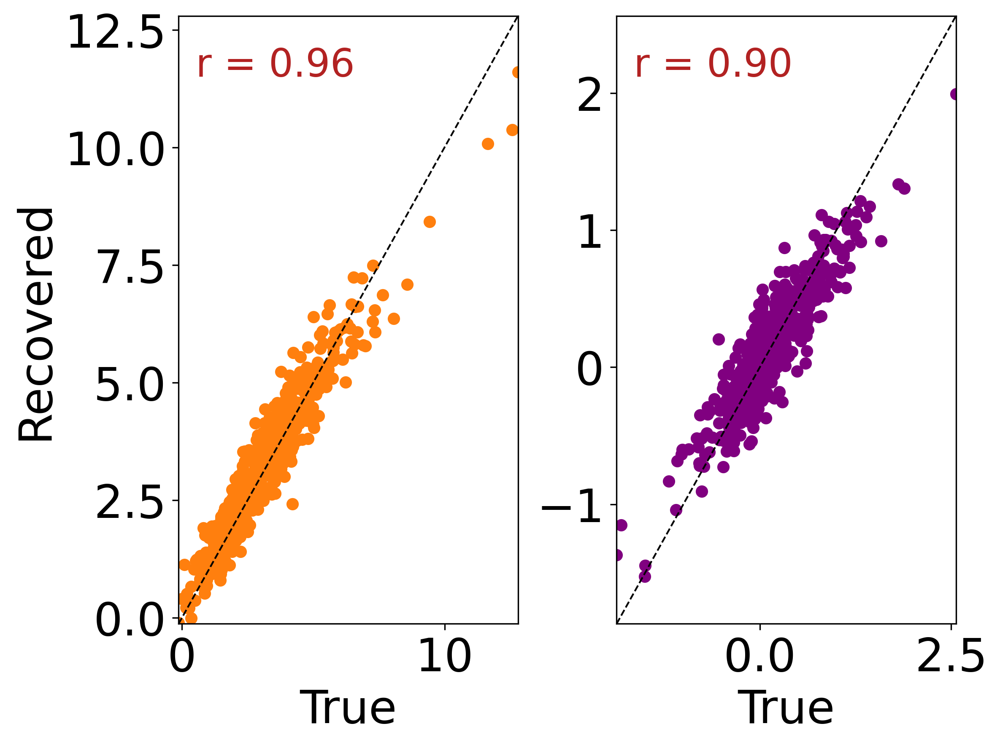

In [246]:
# Study 2

model_path_study2 = '../../model_output/study_2/drift_full_model_pr.nc'
true_param_path_study2 = '../task_data/study_2/drift_full_model_pr_true_param.csv'

do_pr(model_path_study2,true_param_path_study2,'study_2')

In [247]:
# GENERATING FIGURE 3D (Model Validation)

# Fisher z -> correlation SE
def correlation_se(r, n):
    z = np.arctanh(r)
    se = 1 / np.sqrt(n - 3)
    return se

def extract_random_slope(idata, varname):
    """Extract per-subject posterior means from a variable like v_delta_valence[subject]."""
    arr = idata.posterior[varname]  # dims: chain × draw × subject
    means = arr.mean(dim=("chain","draw")) # → per subject

    df = means.to_dataframe().reset_index()            # keep subject labels

    return df

def fisher_ci(r, n, alpha=0.05):
    z = np.arctanh(r)
    se = 1 / np.sqrt(n - 3)
    z_crit = 1.96
    z_lo = z - z_crit * se
    z_hi = z + z_crit * se
    return np.tanh(z_lo), np.tanh(z_hi)

def compute_study_correlations(choice_idata, drift_idata, rt_idata,rt_idata_og):


    # ---- Choice random effects ----
    choice_val  = extract_random_slope(choice_idata, "delta_valence|subject")
    choice_self = extract_random_slope(choice_idata, "r_diff_norm|subject")

    drift_val  = extract_random_slope(drift_idata, "v_delta_valence|subject")
    drift_self = extract_random_slope(drift_idata, "v_r_diff_norm|subject")

    rt_val = extract_random_slope(rt_idata, "pos_neg_lin|subject")
    rt_self = extract_random_slope(rt_idata_og, "r_diff_norm_abs|subject")


    choice_val = choice_val.rename(columns = {'subject__factor_dim':'subject','delta_valence|subject':'choice_val'})
    choice_self = choice_self.rename(columns = {'subject__factor_dim':'subject','r_diff_norm|subject':'choice_self'})

    drift_val = drift_val.rename(columns = {'v_delta_valence|subject__factor_dim':'subject','v_delta_valence|subject':'drift_val'})
    drift_self = drift_self.rename(columns = {'v_r_diff_norm|subject__factor_dim':'subject','v_r_diff_norm|subject':'drift_self'})

    rt_val = rt_val.rename(columns = {'subject__factor_dim':'subject','pos_neg_lin|subject':'rt_val'})
    rt_self = rt_self.rename(columns = {'subject__factor_dim':'subject','r_diff_norm_abs|subject':'rt_self'})

    #print(drift_self.head())

    combo_df = pd.merge(choice_val,choice_self,on = 'subject', how ='inner')
    combo_df = pd.merge(combo_df,drift_val,on = 'subject', how ='inner')
    combo_df = pd.merge(combo_df,drift_self,on = 'subject', how ='inner')
    combo_df = pd.merge(combo_df,rt_val,on = 'subject', how ='inner')
    combo_df = pd.merge(combo_df,rt_self,on = 'subject', how ='inner')
    
    # sample size
    n = len(combo_df.choice_val)

    # correlations + p-values
    results = {}
    results_p = {}

    r, p = pearsonr(combo_df.choice_val, combo_df.drift_val)
    results["choice_valence"] = r
    results_p["choice_valence"] = p

    r, p = pearsonr(combo_df.choice_self, combo_df.drift_self)
    results["choice_selfbelief"] = r
    results_p["choice_selfbelief"] = p

    r, p = pearsonr(combo_df.rt_val, combo_df.drift_val)
    results["rt_valence"] = r
    results_p["rt_valence"] = p

    r, p = pearsonr(combo_df.rt_self, combo_df.drift_self)
    results["rt_selfbelief"] = r
    results_p["rt_selfbelief"] = p

    # SEs
    results_se = {k: correlation_se(v, n) for k, v in results.items()}

    # CIs
    results_ci = {k: fisher_ci(v, n) for k, v in results.items()}

    return results, results_se, results_ci, results_p


study1_corr, study1_se, study1_ci, study1_p = compute_study_correlations(
    choice_study1, drift_full_model_study1, rt_study1_valence, rt_study1_sb
)

study2_corr, study2_se, study2_ci, study2_p = compute_study_correlations(
    choice_study2, drift_full_model_study2, rt_study2_valence,rt_study2_sb
)


In [248]:
print(study1_p)
print(study2_p)

{'choice_valence': 1.16455063851457e-75, 'choice_selfbelief': 1.1047952171774506e-40, 'rt_valence': 0.0009730431840957645, 'rt_selfbelief': 5.324918336527941e-07}
{'choice_valence': 1.983169101283071e-159, 'choice_selfbelief': 8.634424807684577e-20, 'rt_valence': 6.379093301413033e-19, 'rt_selfbelief': 9.109246588686529e-11}


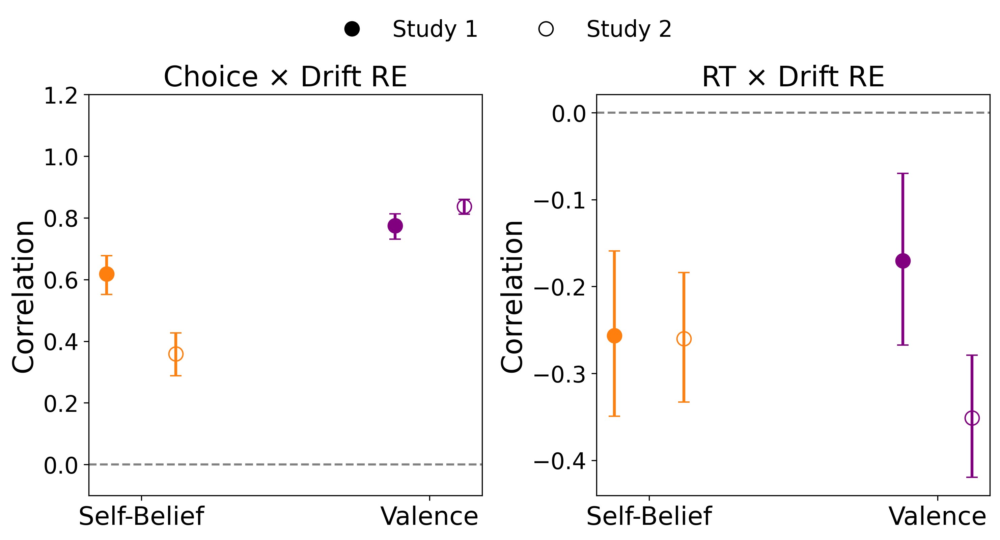

In [249]:
# GENERATING FIGURE 3D (Model Validation)

def ci_to_yerr(r, ci):
    """Convert a (lo, hi) CI on the r scale into matplotlib's 2x1 yerr (distances from r)."""
    lo, hi = ci
    return np.array([[r - lo], [hi - r]])

color_self = "#FF7F0E"
color_val  = "purple"

jitter = 0.12
fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=300)

x_positions = np.array([0, 1])
x1 = x_positions - jitter   # Study 1
x2 = x_positions + jitter   # Study 2


# -----------------------------------------------
# LEFT PANEL: Choice × Drift
# -----------------------------------------------
ax = axes[0]
ax.set_title("Choice × Drift RE", fontsize=20)

# ---- Study 1 (FILLED) ----
ax.errorbar(
    x1[0], study1_corr["choice_selfbelief"],
    yerr=ci_to_yerr(study1_corr["choice_selfbelief"], study1_ci["choice_selfbelief"]),
    fmt="o", mfc=color_self, mec=color_self, ecolor=color_self,
    markersize=10, capsize=4, linewidth=2
)
ax.errorbar(
    x1[1], study1_corr["choice_valence"],
    yerr=ci_to_yerr(study1_corr["choice_valence"], study1_ci["choice_valence"]),
    fmt="o", mfc=color_val, mec=color_val, ecolor=color_val,
    markersize=10, capsize=4, linewidth=2
)

# ---- Study 2 (HOLLOW) ----
ax.errorbar(
    x2[0], study2_corr["choice_selfbelief"],
    yerr=ci_to_yerr(study2_corr["choice_selfbelief"], study2_ci["choice_selfbelief"]),
    fmt="o", mfc="none", mec=color_self, ecolor=color_self,
    markersize=10, capsize=4, linewidth=2
)
ax.errorbar(
    x2[1], study2_corr["choice_valence"],
    yerr=ci_to_yerr(study2_corr["choice_valence"], study2_ci["choice_valence"]),
    fmt="o", mfc="none", mec=color_val, ecolor=color_val,
    markersize=10, capsize=4, linewidth=2
)

ax.axhline(0, color="gray", linestyle="--")
ax.set_xticks(x_positions)
ax.set_xticklabels(["Self-Belief", "Valence"], fontsize=18)
ax.set_ylabel("Correlation", fontsize=20)
ax.set_ylim(-0.1, 1.2)
ax.tick_params(axis='y', labelsize=16)


# -----------------------------------------------
# RIGHT PANEL: RT × Drift
# -----------------------------------------------
ax = axes[1]
ax.set_title("RT × Drift RE", fontsize=20)

# ---- Study 1 (FILLED) ----
ax.errorbar(
    x1[0], study1_corr["rt_selfbelief"],
    yerr=ci_to_yerr(study1_corr["rt_selfbelief"], study1_ci["rt_selfbelief"]),
    fmt="o", mfc=color_self, mec=color_self, ecolor=color_self,
    markersize=10, capsize=4, linewidth=2
)
ax.errorbar(
    x1[1], study1_corr["rt_valence"],
    yerr=ci_to_yerr(study1_corr["rt_valence"], study1_ci["rt_valence"]),
    fmt="o", mfc=color_val, mec=color_val, ecolor=color_val,
    markersize=10, capsize=4, linewidth=2
)

# ---- Study 2 (HOLLOW) ----
ax.errorbar(
    x2[0], study2_corr["rt_selfbelief"],
    yerr=ci_to_yerr(study2_corr["rt_selfbelief"], study2_ci["rt_selfbelief"]),
    fmt="o", mfc="none", mec=color_self, ecolor=color_self,
    markersize=10, capsize=4, linewidth=2
)
ax.errorbar(
    x2[1], study2_corr["rt_valence"],
    yerr=ci_to_yerr(study2_corr["rt_valence"], study2_ci["rt_valence"]),
    fmt="o", mfc="none", mec=color_val, ecolor=color_val,
    markersize=10, capsize=4, linewidth=2
)


legend_elements = [
    Line2D([0], [0], marker='o', linestyle='None',
           markerfacecolor='black',
           markeredgecolor='black',
           markersize=10,
           label='Study 1'),

    Line2D([0], [0], marker='o', linestyle='None',
           markerfacecolor='none',
           markeredgecolor='black',
           markersize=10,
           label='Study 2'),
]

fig.legend(
    handles=legend_elements,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.08),
    ncol=2,
    frameon=False,
    fontsize=16
)

ax.axhline(0, color="gray", linestyle="--")
ax.set_xticks(x_positions)
ax.set_xticklabels(["Self-Belief", "Valence"], fontsize=18)
ax.set_ylabel("Correlation", fontsize=20)
ax.tick_params(axis='y', labelsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig("../plots/model_validation", dpi=300, bbox_inches="tight")
plt.show()

In [250]:
# Generating Figure 4

#################### Simulate Data ##############################


def simulate_data(pair_data,n_sims):

    v_trial_wise = (pair_data['v_intercept'] + pair_data['v_r_diff_norm']*pair_data['r_diff_norm'] +
                    pair_data['v_delta_valence']*pair_data['delta_valence']) 

    a_est = pair_data["a"].values[0]
    z_est = pair_data["z"].values[0]
    t_est = pair_data["t"].values[0]
    v_est = v_trial_wise.values
    
    sim_data = hssm.simulate_data(
        model="ddm",
        theta=dict(
            v=v_est,
            a=a_est,
            z=z_est,
            t=t_est,
        ),
        size=n_sims, 
    )

    sim_data['subject'] = np.tile(pair_data['subject'],n_sims)
    sim_data['sim_num'] = np.repeat(np.arange(1,n_sims+1),pair_data.shape[0])
    sim_data.rename(columns = {'rt':'pred_rt','response':'pred_response'},inplace=True)
    sim_data['r_diff_norm'] = np.tile(pair_data['r_diff_norm'],n_sims)
    sim_data['valence'] = np.tile(pair_data['valence'],n_sims)
    sim_data['valence_left'] = np.tile(pair_data['valence_left'],n_sims)
    sim_data['valence_right'] = np.tile(pair_data['valence_right'],n_sims)
    sim_data['rating_left'] = np.tile(pair_data['rating_left'],n_sims)
    sim_data['rating_right'] = np.tile(pair_data['rating_right'],n_sims)
    sim_data['delta_valence'] = np.tile(pair_data['delta_valence'],n_sims)

    sim_data['pred_valence_chosen'] = np.where(sim_data['pred_response'] == 1,
                                    sim_data['valence_right'],
                                    sim_data['valence_left'])
    sim_data['pred_valence_chosen_int'] =  np.where(sim_data['pred_valence_chosen'] == 'positive', 1, 0)
    sim_data['pred_choice'] = np.where(sim_data['pred_response'] == -1, 0, 1)

    return sim_data
    

In [251]:
# Generating Figure 4


def gen_seq_sampling_curves(pair_data,drift_full_model,study): 
    
    subject_effects_df = calc_sub_effects(drift_full_model,study)

    pair_data = pd.merge(pair_data,subject_effects_df, on = 'subject', how = 'inner')

    sim_data = simulate_data(pair_data,1000)

    ############# Calculated observed and predicted RT and choice as a function of delta self-belief #########
    
    ########## Observed ###########
    # RT
    pair_data['r_diff_norm'] = pair_data['r_diff_norm'].round(1)
    rt_mod1a = pair_data.groupby(['subject','r_diff_norm'],as_index=False,observed=True)['rt'].median()
    rt_mod2a = rt_mod1a.groupby('r_diff_norm',observed=True)['rt'].agg(
        mean='mean',
        se=lambda x: x.std(ddof=1) / np.sqrt(x.count())
    ).reset_index()

    # Choice
    pair_mod1a = pair_data.groupby(['subject','r_diff_norm'],as_index=False,observed=True)['choice'].mean()
    pair_mod2a = pair_mod1a.groupby('r_diff_norm',observed=True)['choice'].agg(
        mean='mean',
        se=lambda x: x.std(ddof=1) / np.sqrt(x.count())
    ).reset_index()

    ######### Predicted ############
    # RT
    sim_data['r_diff_norm'] = sim_data['r_diff_norm'].round(1)
    sim_rt = sim_data.groupby(['subject','r_diff_norm','sim_num'],as_index=False,observed=True)['pred_rt'].median()
    sim_rt2 = sim_rt.groupby(['r_diff_norm','sim_num'],as_index=False,observed=True)['pred_rt'].mean()
    sim_rt3 = sim_rt2.groupby('r_diff_norm',observed=True)['pred_rt'].agg(
        pred_mean = 'mean',
        lower_2_5=lambda x: x.quantile(0.025),
        upper_97_5=lambda x: x.quantile(0.975)
    ).reset_index()
    merged_df2 = pd.merge(sim_rt3, rt_mod2a, on=['r_diff_norm'], how='inner')


    # Choice
    sim_choice = sim_data.groupby(['subject','r_diff_norm','sim_num'],as_index=False,observed=True)['pred_choice'].mean()
    sim_choice2 = sim_choice.groupby(['r_diff_norm','sim_num'],as_index=False,observed=True)['pred_choice'].mean()
    sim_choice3 = sim_choice2.groupby('r_diff_norm',observed=True)['pred_choice'].agg(
        pred_mean = 'mean',
        lower_2_5=lambda x: x.quantile(0.025),
        upper_97_5=lambda x: x.quantile(0.975)
    ).reset_index()
    merged_df3 = pd.merge(sim_choice3, pair_mod2a, on=['r_diff_norm'], how='inner')


    ################# MSE calculation #############
    rt_mse = np.mean((merged_df2['mean'] - merged_df2['pred_mean'])**2)
    choice_mse = np.mean((merged_df3['mean'] - merged_df3['pred_mean'])**2)

    print(f"RT MSE: {rt_mse:.6f}")
    print(f"Choice MSE: {choice_mse:.6f}")

    ############################################# Plotting ########################################

    fig, axes = plt.subplots(2, 1, figsize=(8, 12), sharex=True)
    s_val = 1.0  # smoothing parameter

    # =========================
    # Top panel (merged_df3) - Choice proportions
    # =========================
    df3 = merged_df3.copy()
    df3["r_diff_norm"] = pd.to_numeric(df3["r_diff_norm"], errors="coerce")

    df3 = (df3.groupby("r_diff_norm", as_index=False)
              .agg(mean=("mean", "mean"),
                   se=("se", "mean"),
                   pred_mean=("pred_mean", "mean"))
              .dropna(subset=["r_diff_norm", "pred_mean"]))

    df3_sorted = df3.sort_values("r_diff_norm")
    x3 = df3_sorted["r_diff_norm"].to_numpy()
    y3 = df3_sorted["pred_mean"].to_numpy()

    spl3 = UnivariateSpline(x3, y3, k=3, s=s_val)
    xg3 = np.linspace(x3.min(), x3.max(), 600)
    yg3 = spl3(xg3)

    axes[0].errorbar(
        x3, df3_sorted["mean"], yerr=df3_sorted["se"],
        fmt='o', capsize=5, color='#FF7F0E', ecolor='#FF7F0E', markersize=14,
        elinewidth=2, markeredgewidth=0, label='Observed'
    )
    axes[0].plot(xg3, yg3, color='#fdae6b', linewidth=2, label='Model Predictions')

    axes[0].set_ylabel('P(Choose Right)', fontsize=26)
    axes[0].tick_params(axis='x', labelsize=26)
    axes[0].tick_params(axis='y', labelsize=26)
    axes[0].set_xticks([-0.5, 0, 0.5])
    #axes[0].set_title('Study 2',fontsize = 26)
    axes[0].set_xticklabels(['-0.5', '0', '0.5'])
    axes[0].set_ylim(0,1)


    # =========================
    # Bottom panel (merged_df2) - Reaction time in seconds
    # =========================
    df2 = merged_df2.copy()
    df2["r_diff_norm"] = pd.to_numeric(df2["r_diff_norm"], errors="coerce")

    df2 = (df2.groupby("r_diff_norm", as_index=False)
              .agg(mean=("mean", "mean"),
                   se=("se", "mean"),
                   pred_mean=("pred_mean", "mean"))
              .dropna(subset=["r_diff_norm", "pred_mean"]))

    df2_sorted = df2.sort_values("r_diff_norm")
    x2 = df2_sorted["r_diff_norm"].to_numpy()
    # convert ms → seconds
    y2 = df2_sorted["pred_mean"]
    mean2 = df2_sorted["mean"]
    se2 = df2_sorted["se"]

    spl2 = UnivariateSpline(x2, y2, k=3, s=s_val)
    xg2 = np.linspace(x2.min(), x2.max(), 600)
    yg2 = spl2(xg2)

    axes[1].errorbar(
        x2, mean2, yerr=se2,
        fmt='o', capsize=5, color='#FF7F0E', ecolor='#FF7F0E', markersize=14,
        elinewidth=2, markeredgewidth=0, label='Observed'
    )
    axes[1].plot(xg2, yg2, color='#fdae6b', linewidth=2, label='Model Predictions')

    axes[1].set_xlabel(r'$\Delta$ Self-Belief (Right Belief - Left Belief)', fontsize=26)
    axes[1].set_ylabel('Reaction Time (s)', fontsize=26)  # seconds now
    axes[1].tick_params(axis='x', labelsize=26)
    axes[1].tick_params(axis='y', labelsize=26)
    axes[1].set_xticks([-0.5, 0, 0.5])
    axes[1].set_xticklabels(['-0.5', '0', '0.5'])


    plt.tight_layout()
    fig.savefig(
        f"../plots/seq_sampling_self_beliefs_{study}",
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()

    return sim_data



RT MSE: 0.002215
Choice MSE: 0.000223


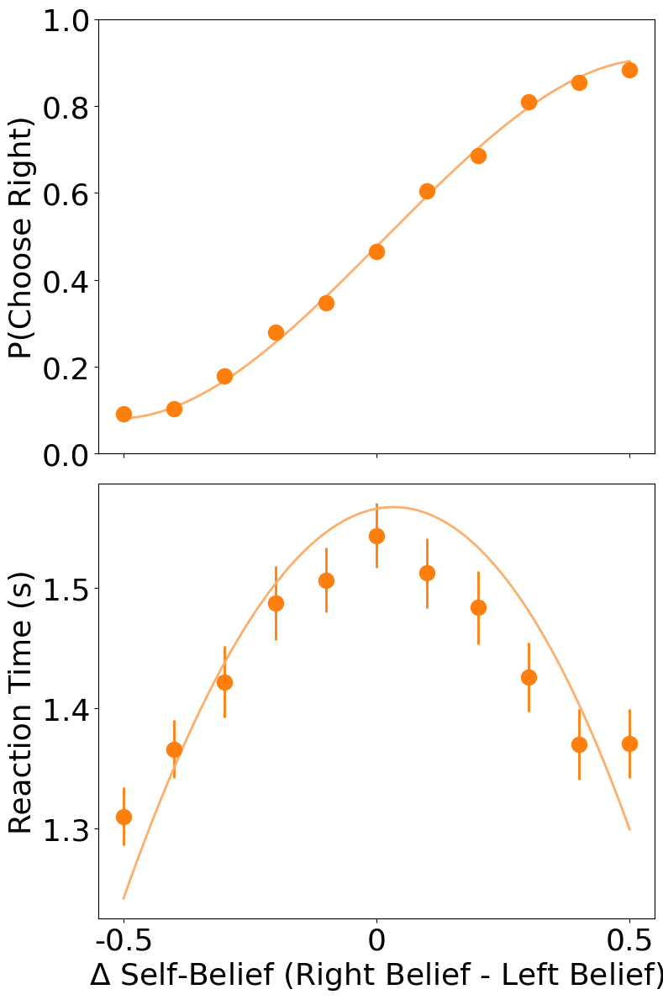

RT MSE: 0.003107
Choice MSE: 0.000338


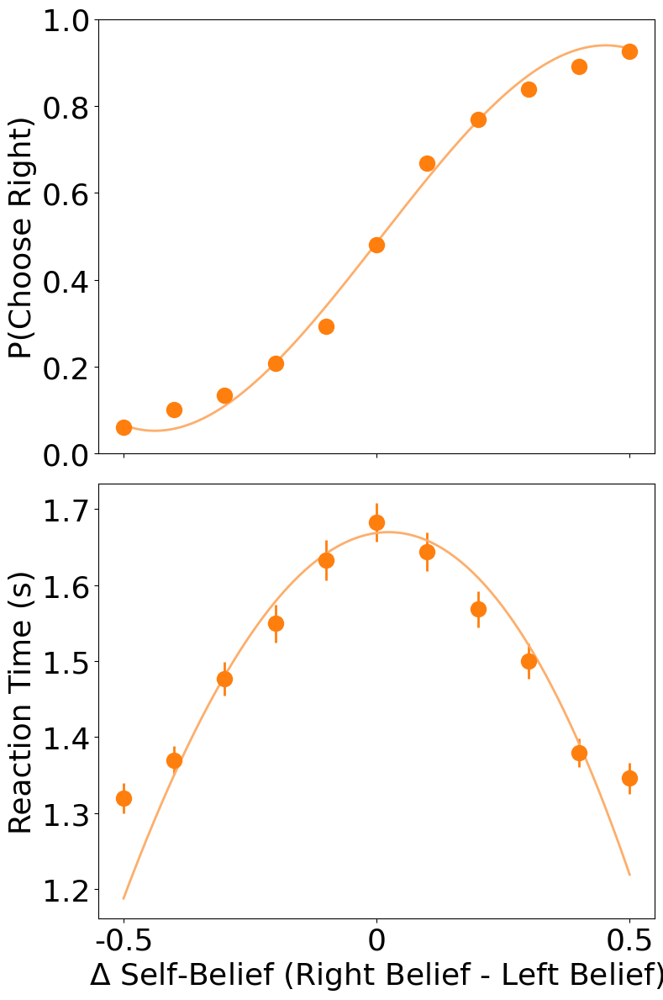

In [252]:
sim_study1 = gen_seq_sampling_curves(pair_df_study1,drift_full_model_study1,'study_1')
sim_study2 = gen_seq_sampling_curves(pair_df_study2,drift_full_model_study2,'study_2')

In [253]:
# Supplementary Table 5
## Bottom of the script (search for Supplementary Table 5)

In [254]:
def compute_quantile_prob_cor_incor(pair_df, sim_data, n_sims):
    """
    Compute observed and predicted RT quantiles and choice probabilities
    for correct vs incorrect trials.
    """

    # -------------------------
    # Observed
    # -------------------------
    pair_df_cor   = pair_df[pair_df["correct"] == 1]
    pair_df_incor = pair_df[pair_df["correct"] == 0]

    obs_q_cor   = pair_df_cor["rt"].quantile([0.1, 0.3, 0.5, 0.7, 0.9])
    obs_q_incor = pair_df_incor["rt"].quantile([0.1, 0.3, 0.5, 0.7, 0.9])

    obs_choice_prop_cor   = pair_df["correct"].mean()
    obs_choice_prop_incor = 1 - obs_choice_prop_cor

    # -------------------------
    # Predicted (per simulation)
    # -------------------------
    pred_q_cor_all   = []
    pred_q_incor_all = []
    pred_choice_prop_cor = []

    for sim in range(1, n_sims + 1):
        tmp = sim_data[sim_data["sim_num"] == sim]

        tmp_cor   = tmp[tmp["correct"] == 1]
        tmp_incor = tmp[tmp["correct"] == 0]

        pred_q_cor_all.append(
            tmp_cor["pred_rt"].quantile([0.1, 0.3, 0.5, 0.7, 0.9]).values
        )
        pred_q_incor_all.append(
            tmp_incor["pred_rt"].quantile([0.1, 0.3, 0.5, 0.7, 0.9]).values
        )

        pred_choice_prop_cor.append(tmp["correct"].mean())

    pred_q_cor   = np.nanmean(pred_q_cor_all, axis=0)
    pred_q_incor = np.nanmean(pred_q_incor_all, axis=0)

    pred_choice_prop_cor   = np.nanmean(pred_choice_prop_cor)
    pred_choice_prop_incor = 1 - pred_choice_prop_cor

    return {
        "obs_q_cor": obs_q_cor,
        "obs_q_incor": obs_q_incor,
        "pred_q_cor": pred_q_cor,
        "pred_q_incor": pred_q_incor,
        "obs_choice_prop_cor": obs_choice_prop_cor,
        "obs_choice_prop_incor": obs_choice_prop_incor,
        "pred_choice_prop_cor": pred_choice_prop_cor,
        "pred_choice_prop_incor": pred_choice_prop_incor,
    }


In [255]:
def plot_quantile_prob_ax(
    ax, stats, title, row_idx, col_idx,
    ylim=(0.5, 4.0)   # <-- seconds instead of ms
):
    """
    Plot quantile probability points on a single axis.
    """

    # -------------------------
    # Convert RTs from ms → seconds
    # -------------------------
    obs_q_incor_sec  = stats["obs_q_incor"]  
    pred_q_incor_sec = stats["pred_q_incor"] 
    obs_q_cor_sec    = stats["obs_q_cor"]    
    pred_q_cor_sec   = stats["pred_q_cor"]

    # X positions
    x_obs_incor  = np.full(len(obs_q_incor_sec),  stats["obs_choice_prop_incor"])
    x_pred_incor = np.full(len(pred_q_incor_sec), stats["pred_choice_prop_incor"])

    x_obs_cor  = np.full(len(obs_q_cor_sec),  stats["obs_choice_prop_cor"])
    x_pred_cor = np.full(len(pred_q_cor_sec), stats["pred_choice_prop_cor"])

    # -------------------------
    # Scatter
    # -------------------------
    ax.scatter(x_obs_incor,  obs_q_incor_sec,  color="blue", marker="o", s=80, label="Observed")
    ax.scatter(x_pred_incor, pred_q_incor_sec, color="red",  marker="o", s=80, label="Predicted")

    ax.scatter(x_obs_cor,  obs_q_cor_sec,  color="blue", marker="o", s=80)
    ax.scatter(x_pred_cor, pred_q_cor_sec, color="red",  marker="o", s=80)

    # -------------------------
    # Labels
    # -------------------------
    # Y-axis label (LEFT column only)
    if col_idx == 0:
        ax.set_ylabel("Reaction Time (s)", fontsize=26)
    else:
        ax.set_ylabel("")

    # Congruent / Incongruent labels (BOTTOM row only)
    if row_idx == 1:
        ax.text(
            0.25, -0.15, "Incongruent",
            transform=ax.transAxes,
            ha="center", va="top",
            fontsize=26
        )
        ax.text(
            0.75, -0.15, "Congruent",
            transform=ax.transAxes,
            ha="center", va="top",
            fontsize=26
        )

    ax.set_title(title, fontsize=26)

    # -------------------------
    # Axis formatting
    # -------------------------
    ax.set_xlim(0, 1)
    ax.set_ylim(*ylim)
    ax.tick_params(axis="x", labelsize=24, pad=10)
    ax.tick_params(axis="y", labelsize=24)
    ax.margins(x=0.1)


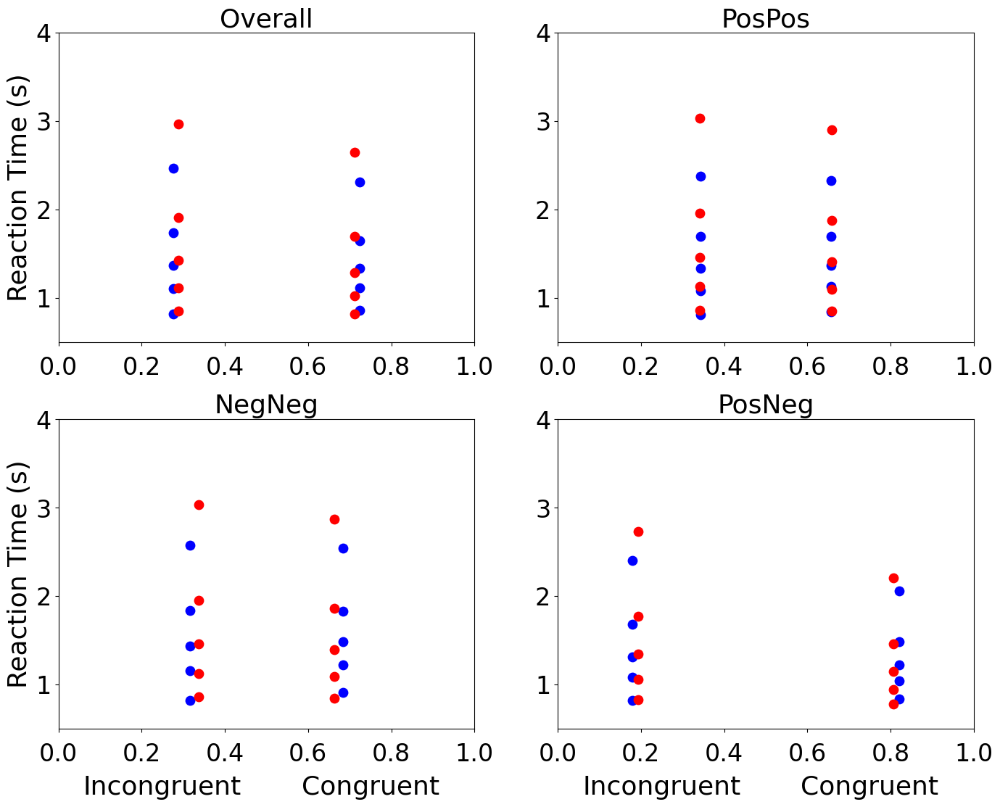

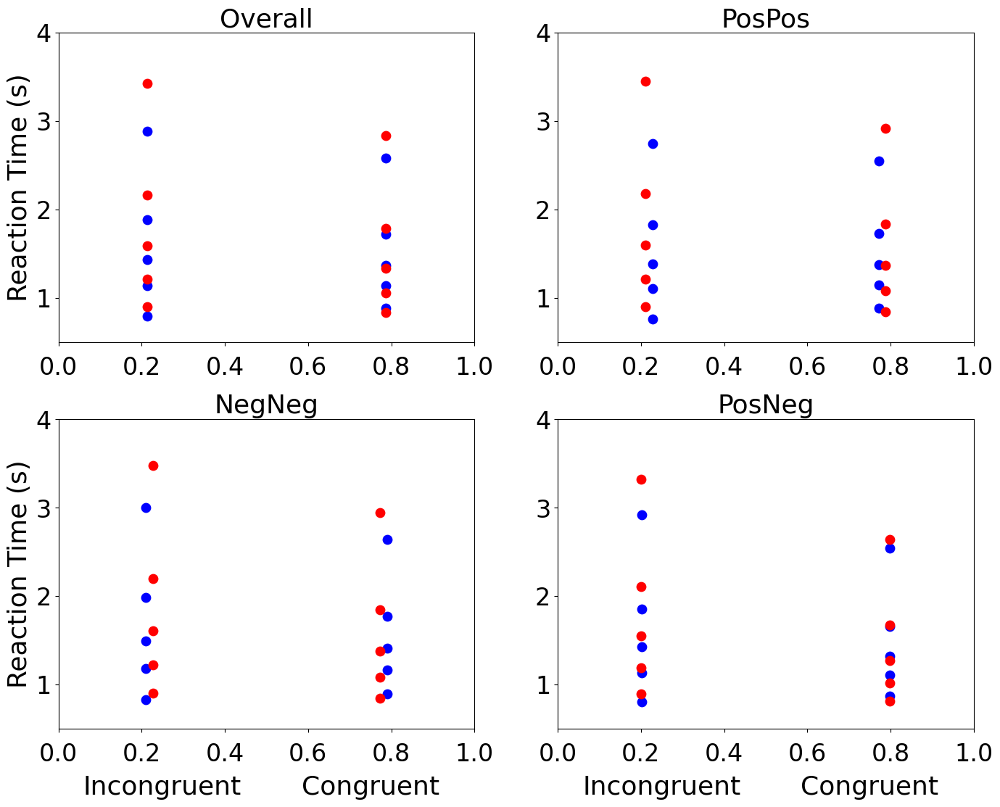

In [256]:
# Supplementary Figure 1

def calc_quantiles(pair_df,sim_data,study):

    pair_df['r_greater_l'] = np.where(pair_df['rating_right'] > pair_df['rating_left'], 1,
                      np.where(pair_df['rating_right'] < pair_df['rating_left'], -1, 0))
    pair_df2 = pair_df[pair_df['r_greater_l']!=0].copy()
    pair_df2['correct'] = np.where(pair_df2['r_greater_l']==pair_df2['response'],1,0)


    sim_data['r_greater_l'] = np.where(sim_data['rating_right'] > sim_data['rating_left'], 1,
                      np.where(sim_data['rating_right'] < sim_data['rating_left'], -1, 0))
    sim_data2 = sim_data[sim_data['r_greater_l']!=0].copy()
    sim_data2['correct'] = np.where(sim_data2['r_greater_l']==sim_data2['pred_response'],1,0)


    pair_pos_pos = pair_df2[pair_df2['valence']=='PosPos']
    pair_neg_neg = pair_df2[pair_df2['valence']=='NegNeg']
    pair_pos_neg = pair_df2[pair_df2['valence']=='PosNeg']

    sim_pos_pos = sim_data2[sim_data2['valence']=='PosPos']
    sim_neg_neg = sim_data2[sim_data2['valence']=='NegNeg']
    sim_pos_neg = sim_data2[sim_data2['valence']=='PosNeg']

    n_sims = 1000
    stats_overall = compute_quantile_prob_cor_incor(pair_df2, sim_data2, n_sims)
    stats_pp      = compute_quantile_prob_cor_incor(pair_pos_pos, sim_pos_pos, n_sims)
    stats_nn      = compute_quantile_prob_cor_incor(pair_neg_neg, sim_neg_neg, n_sims)
    stats_pn      = compute_quantile_prob_cor_incor(pair_pos_neg, sim_pos_neg, n_sims)

    fig, axs = plt.subplots(2, 2, figsize=(14, 12))

    plot_quantile_prob_ax(axs[0, 0], stats_overall, "Overall", 0, 0)
    plot_quantile_prob_ax(axs[0, 1], stats_pp,      "PosPos",  0, 1)
    plot_quantile_prob_ax(axs[1, 0], stats_nn,      "NegNeg",  1, 0)
    plot_quantile_prob_ax(axs[1, 1], stats_pn,      "PosNeg",  1, 1)

    # Legend
    handles, labels = axs[0, 0].get_legend_handles_labels()

    plt.tight_layout(rect=[0, -0.03, 1, 0.93])
    plt.subplots_adjust(top=0.95, bottom=0.15, hspace=0.25, wspace=0.2)

    #plt.suptitle("Study 2", fontsize=22, y=1.05)
    plt.savefig(
        f"../plots/quantile_prob_plots_{study}",
        bbox_inches="tight"
    )
    plt.show()


calc_quantiles(pair_df_study1,sim_study1,'study_1')
calc_quantiles(pair_df_study2,sim_study2,'study_2')

In [257]:
# Generating Figure 5

def extract_pos_neg(pair_df):
    
    pair_pos_neg = pair_df[pair_df['valence']=='PosNeg'].copy()

    pair_pos_neg['positive_rating'] = np.where(
        pair_pos_neg['valence_left'] == 'positive',
        pair_pos_neg['rating_left'],
        pair_pos_neg['rating_right']
    )

    pair_pos_neg['negative_rating'] = np.where(
        pair_pos_neg['valence_left'] == 'negative',
        pair_pos_neg['rating_left'],
        pair_pos_neg['rating_right']
    )

    pair_pos_neg['delta_pos_rat'] = pair_pos_neg['positive_rating'] - pair_pos_neg['negative_rating']

    pair_pos_neg["delta_pos_mod"] = (
    (pair_pos_neg["delta_pos_rat"] - pair_pos_neg["delta_pos_rat"].min()) / (pair_pos_neg["delta_pos_rat"].max() - pair_pos_neg["delta_pos_rat"].min())
    )
    pair_pos_neg["delta_pos_mod"] = pair_pos_neg["delta_pos_mod"]/2

    pair_pos_neg['delta_pos_mod'] = pair_pos_neg['delta_pos_mod'] - 0.25

    pair_pos_neg['delta_pos_mod'] = round(pair_pos_neg['delta_pos_mod'],1)

    return pair_pos_neg

pos_neg_study1 = extract_pos_neg(pair_df_study1)
pos_neg_study2 = extract_pos_neg(pair_df_study2)

subject_effects_study1 = calc_sub_effects(drift_full_model_study1,'study_1')
subject_effects_study2 = calc_sub_effects(drift_full_model_study2,'study_2')

pos_neg_study1 = pd.merge(pos_neg_study1,subject_effects_study1, on = 'subject', how = 'inner')
pos_neg_study2 = pd.merge(pos_neg_study2,subject_effects_study2, on = 'subject', how = 'inner')



In [258]:
beta_valence_pos_study1 = pos_neg_study1[pos_neg_study1['v_delta_valence']>0]
beta_valence_neg_study1 = pos_neg_study1[pos_neg_study1['v_delta_valence']<0]

beta_valence_pos_study2 = pos_neg_study2[pos_neg_study2['v_delta_valence']>0]
beta_valence_neg_study2 = pos_neg_study2[pos_neg_study2['v_delta_valence']<0]

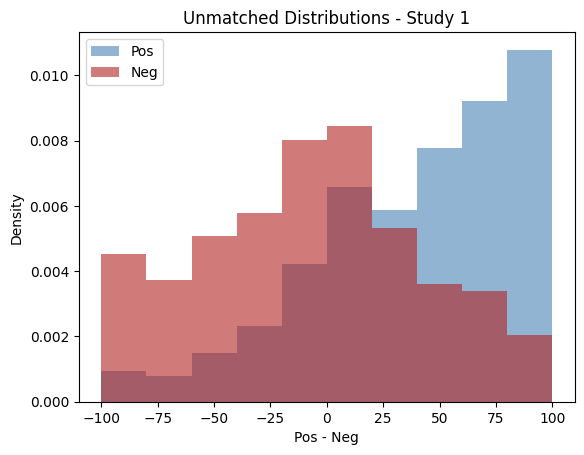

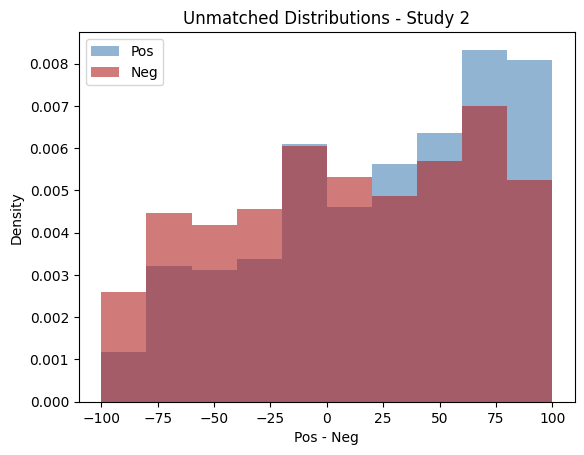

In [259]:
def plot_hist(pos_dist,neg_dist,study,unmatched):

    plt.hist(pos_dist['delta_pos_rat'], color='steelblue', alpha=0.6, label='Pos', density = True)
    plt.hist(neg_dist['delta_pos_rat'], color='firebrick', alpha=0.6, label='Neg', density = True)

    plt.xlabel('Pos - Neg')
    plt.ylabel('Density')
    plt.title(f'{unmatched} Distributions - {study}')
    plt.legend()
    plt.show()

plot_hist(beta_valence_pos_study1,beta_valence_neg_study1,'Study 1','Unmatched')
plot_hist(beta_valence_pos_study2,beta_valence_neg_study2,'Study 2','Unmatched')


In [260]:
import numpy as np
import pandas as pd

def match_histogram_simple(df_high, df_low, bin_size=20, random_state=None):
    """
    Match df_high and df_low on raw bin frequency.
    
    For each bin:
        n = min(count_high, count_low)
        sample n from each group
    
    Returns:
        matched_high_df, matched_low_df, bin_edges
    """

    # Copy to avoid modifying originals
    df_high = df_high.copy()
    df_low  = df_low.copy()

    # Ensure numeric
    df_high["delta_pos_rat"] = pd.to_numeric(df_high["delta_pos_rat"], errors="coerce")
    df_low["delta_pos_rat"]  = pd.to_numeric(df_low["delta_pos_rat"], errors="coerce")

    # Define shared bin edges
    min_val = min(df_high["delta_pos_rat"].min(), df_low["delta_pos_rat"].min())
    max_val = max(df_high["delta_pos_rat"].max(), df_low["delta_pos_rat"].max())

    bin_edges = np.arange(min_val, max_val + bin_size, bin_size)
    if len(bin_edges) < 2:
        bin_edges = np.array([min_val, max_val])

    # Assign bins
    df_high["bin"] = pd.cut(df_high["delta_pos_rat"], bins=bin_edges, include_lowest=True)
    df_low["bin"]  = pd.cut(df_low["delta_pos_rat"],  bins=bin_edges, include_lowest=True)

    matched_high = []
    matched_low  = []

    # Loop through bins present in either group
    all_bins = sorted(set(df_high["bin"].dropna()) | set(df_low["bin"].dropna()))

    for b in all_bins:
        h_bin = df_high[df_high["bin"] == b]
        l_bin = df_low[df_low["bin"] == b]

        n = min(len(h_bin), len(l_bin))

        if n > 0:
            matched_high.append(h_bin.sample(n=n, random_state=random_state))
            matched_low.append(l_bin.sample(n=n, random_state=random_state))

    matched_high_df = pd.concat(matched_high, ignore_index=True) if matched_high else pd.DataFrame()
    matched_low_df  = pd.concat(matched_low,  ignore_index=True) if matched_low  else pd.DataFrame()

    return matched_high_df, matched_low_df, bin_edges

pos_matched_study1, neg_matched_study1, bin_edges = match_histogram_simple(
    beta_valence_pos_study1, beta_valence_neg_study1, bin_size=10, random_state=42
)

pos_matched_study2, neg_matched_study2, bin_edges = match_histogram_simple(
    beta_valence_pos_study2, beta_valence_neg_study2, bin_size=10, random_state=42
)

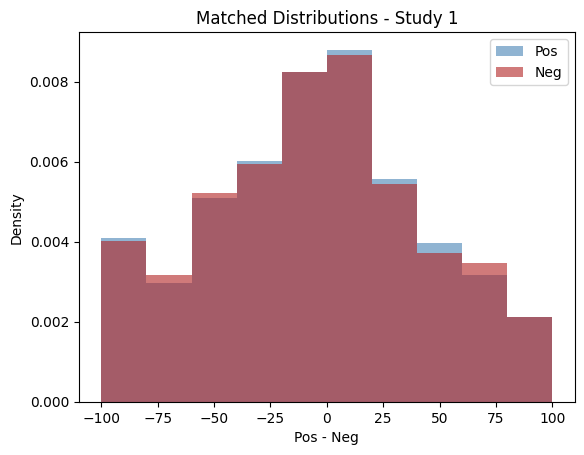

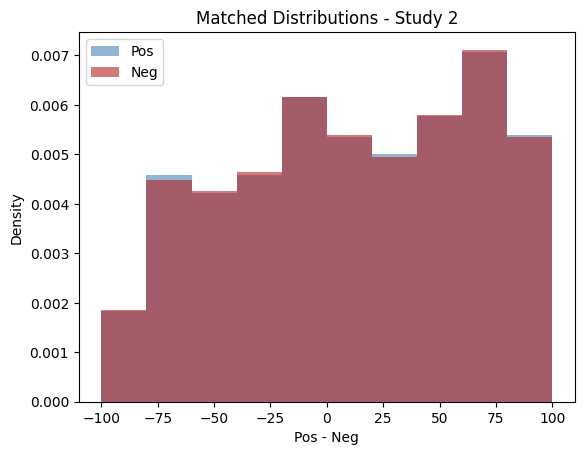

In [261]:
plot_hist(pos_matched_study1,neg_matched_study1,'Study 1','Matched')
plot_hist(pos_matched_study2,neg_matched_study2,'Study 2','Matched')

In [262]:
def cal_rt_beta_valence(pos_df,neg_df):

    rt_pos1 = pos_df.groupby(['subject','delta_pos_mod'])['rt'].median().reset_index()
    rt_neg1 = neg_df.groupby(['subject','delta_pos_mod'])['rt'].median().reset_index()

    rt_pos1['bin_group'] = 'pos'
    rt_neg1['bin_group'] = 'neg'

    rt_comb = pd.concat([rt_pos1,rt_neg1], axis=0, ignore_index=True)

    rt_comb2 = (
            rt_comb.groupby(["delta_pos_mod","bin_group"])["rt"]
              .agg(rt_mean="mean",
                   rt_se=lambda x: x.std(ddof=1) / np.sqrt(len(x)))  # SEM = SD / sqrt(n)
              .reset_index()
        )
    return(rt_comb2)

rt_beta_valence_study1 = cal_rt_beta_valence(pos_matched_study1, neg_matched_study1)
rt_beta_valence_study2 = cal_rt_beta_valence(pos_matched_study2, neg_matched_study2)


In [263]:
def cal_choice_beta_valence(pos_df,neg_df):

    choice_pos1 = pos_df.groupby(['subject','delta_pos_mod'])['valence_chosen_int'].mean().reset_index()
    choice_neg1 = neg_df.groupby(['subject','delta_pos_mod'])['valence_chosen_int'].mean().reset_index()

    choice_pos1['bin_group'] = 'pos'
    choice_neg1['bin_group'] = 'neg'

    choice_comb = pd.concat([choice_pos1,choice_neg1], axis=0, ignore_index=True)

    choice_comb2 = (
            choice_comb.groupby(["delta_pos_mod","bin_group"])["valence_chosen_int"]
              .agg(choice_mean="mean",
                   choice_se=lambda x: x.std(ddof=1) / np.sqrt(len(x)))  # SEM = SD / sqrt(n)
              .reset_index()
        )
    return(choice_comb2)

choice_beta_valence_study1 = cal_choice_beta_valence(pos_matched_study1, neg_matched_study1)
choice_beta_valence_study2 = cal_choice_beta_valence(pos_matched_study2, neg_matched_study2)


In [264]:
pos_matched_study1['bin_group'] = 'pos'
neg_matched_study1['bin_group'] = 'neg'

pos_matched_study2['bin_group'] = 'pos'
neg_matched_study2['bin_group'] = 'neg'

pos_neg_df1_study1 = pd.concat([pos_matched_study1,neg_matched_study1], axis =0, ignore_index=True)
pos_neg_df1_study2 = pd.concat([pos_matched_study2,neg_matched_study2], axis =0, ignore_index=True)


In [265]:
beta_valence_sim_study1 = simulate_data(pos_neg_df1_study1,1000)
beta_valence_sim_study2 = simulate_data(pos_neg_df1_study2,1000)


In [266]:
beta_valence_sim_study1['v_delta_valence'] = np.tile(pos_neg_df1_study1['v_delta_valence'],1000)
beta_valence_sim_study2['v_delta_valence'] = np.tile(pos_neg_df1_study2['v_delta_valence'],1000)

beta_valence_sim_study1['delta_pos_mod'] = np.tile(pos_neg_df1_study1['delta_pos_mod'],1000)
beta_valence_sim_study2['delta_pos_mod'] = np.tile(pos_neg_df1_study2['delta_pos_mod'],1000)

In [267]:
pos_sim_study1 = beta_valence_sim_study1[beta_valence_sim_study1['v_delta_valence']>0]
neg_sim_study1 = beta_valence_sim_study1[beta_valence_sim_study1['v_delta_valence']< 0]

pos_sim_study2 = beta_valence_sim_study2[beta_valence_sim_study2['v_delta_valence']>0]
neg_sim_study2 = beta_valence_sim_study2[beta_valence_sim_study2['v_delta_valence']< 0]

In [268]:
def cal_rt_beta_valence_sim(pos_sim,neg_sim):

    rt_pos = pos_sim.groupby(['subject','delta_pos_mod','sim_num'])['pred_rt'].median().reset_index()
    rt_neg = neg_sim.groupby(['subject','delta_pos_mod','sim_num'])['pred_rt'].median().reset_index()

    rt_pos1 = rt_pos.groupby(['delta_pos_mod','sim_num'])['pred_rt'].mean().reset_index()
    rt_neg1 = rt_neg.groupby(['delta_pos_mod','sim_num'])['pred_rt'].mean().reset_index()

    rt_pos1['bin_group'] = 'pos'
    rt_neg1['bin_group'] = 'neg'

    rt_comb = pd.concat([rt_pos1,rt_neg1], axis=0, ignore_index=True)

    rt_comb2 = (
            rt_comb.groupby(["delta_pos_mod","bin_group"])["pred_rt"]
              .agg(pred_rt="mean",
               lower_2_5=lambda x: x.quantile(0.025),
               upper_97_5=lambda x: x.quantile(0.975)).reset_index()  # SEM = SD / sqrt(n)            
        )
    return(rt_comb2)

rt_beta_valence_pred_study1 = cal_rt_beta_valence_sim(pos_sim_study1, neg_sim_study1)
rt_beta_valence_pred_study2 = cal_rt_beta_valence_sim(pos_sim_study2, neg_sim_study2)



In [269]:
def cal_choice_beta_valence_pred(pos_sim,neg_sim):

    choice_pos = pos_sim.groupby(['subject','delta_pos_mod','sim_num'])['pred_valence_chosen_int'].mean().reset_index()
    choice_neg = neg_sim.groupby(['subject','delta_pos_mod','sim_num'])['pred_valence_chosen_int'].mean().reset_index()

    choice_pos1 = choice_pos.groupby(['delta_pos_mod','sim_num'])['pred_valence_chosen_int'].mean().reset_index()
    choice_neg1 = choice_neg.groupby(['delta_pos_mod','sim_num'])['pred_valence_chosen_int'].mean().reset_index()

    choice_pos1['bin_group'] = 'pos'
    choice_neg1['bin_group'] = 'neg'

    choice_comb = pd.concat([choice_pos1,choice_neg1], axis=0, ignore_index=True)

    choice_comb2 = (
            choice_comb.groupby(["delta_pos_mod","bin_group"])["pred_valence_chosen_int"]
              .agg(pred_choice="mean",
               lower_2_5=lambda x: x.quantile(0.025),
               upper_97_5=lambda x: x.quantile(0.975)).reset_index()  # SEM = SD / sqrt(n)            
        )
    return(choice_comb2)

choice_beta_valence_pred_study1 = cal_choice_beta_valence_pred(pos_sim_study1, neg_sim_study1)
choice_beta_valence_pred_study2 = cal_choice_beta_valence_pred(pos_sim_study2, neg_sim_study2)



In [270]:
combined_choice_info_study1 = pd.merge(choice_beta_valence_study1,choice_beta_valence_pred_study1, on = ['delta_pos_mod','bin_group'], how = 'inner')
combined_rt_info_study1 = pd.merge(rt_beta_valence_study1,rt_beta_valence_pred_study1, on = ['delta_pos_mod','bin_group'], how = 'inner')

combined_choice_info_study2 = pd.merge(choice_beta_valence_study2,choice_beta_valence_pred_study2, on = ['delta_pos_mod','bin_group'], how = 'inner')
combined_rt_info_study2 = pd.merge(rt_beta_valence_study2,rt_beta_valence_pred_study2, on = ['delta_pos_mod','bin_group'], how = 'inner')


In [271]:
def gen_valence_curves(combined_choice_info,combined_rt_info,study): 


    colors = {"pos": "#4B0082", "neg": "#D8BFD8"}  # dark & light purple

    fig, (ax_choice, ax_rt) = plt.subplots(
        2, 1, figsize=(8, 12), dpi=300, sharex=True
    )


    df_choice = combined_choice_info.copy()

    x_positions = df_choice["delta_pos_mod"].unique()
    x_vals = np.arange(len(x_positions))
    x_fine = np.linspace(x_vals.min(), x_vals.max(), 300)

    ax = ax_choice

    for group, sub in df_choice.groupby("bin_group", observed=False):
        sub = (
            sub.set_index("delta_pos_mod")
               .reindex(x_positions)
               .reset_index()
        )

        y_obs  = sub["choice_mean"].values
        y_se   = sub["choice_se"].values
        y_pred = sub["pred_choice"].values

        # Observed
        ax.plot(x_vals, y_obs, color=colors[group], linewidth=3)
        ax.fill_between(
            x_vals, y_obs - y_se, y_obs + y_se,
            color=colors[group], alpha=0.2
        )

        # Predicted (splined)
        spline = UnivariateSpline(x_vals, y_pred, s=0.5)
        ax.plot(
            x_fine, spline(x_fine),
            color=colors[group], linestyle="--", linewidth=3
        )

    ax.set_ylim(0, 1)
    ax.tick_params(axis="y", labelsize=26)
    ax.set_ylabel("P(Choose Positive)", fontsize=26)



    df_rt = combined_rt_info.copy()

    ax = ax_rt

    for group, sub in df_rt.groupby("bin_group", observed=False):
        sub = (
            sub.set_index("delta_pos_mod")
               .reindex(x_positions)
               .reset_index()
        )

        y_obs  = sub["rt_mean"]
        y_se   = sub["rt_se"]
        y_pred = sub["pred_rt"]

        # Observed
        ax.plot(x_vals, y_obs, color=colors[group], linewidth=3)
        ax.fill_between(
            x_vals, y_obs - y_se, y_obs + y_se,
            color=colors[group], alpha=0.2
        )

        # Predicted (splined)
        spline = UnivariateSpline(x_vals, y_pred, s=0.5)
        ax.plot(
            x_fine, spline(x_fine),
            color=colors[group], linestyle="--", linewidth=3
        )

    #ax.set_ylim(1.1, 1.8)
    ax.set_ylabel("Reaction Time (s)", fontsize=26)
    ax.tick_params(axis="y", labelsize=26)



    # Find indices for -0.5, 0, 0.5
    tick_vals_mod = [-0.2, 0.0, 0.2]
    tick_inds = [
        i for i, x in enumerate(x_positions)
        if np.isclose(x, tick_vals_mod).any()
    ]

    # Set ticks at those positions only
    ax_rt.set_xticks(tick_inds)
    ax_rt.set_xticklabels(
        [-100, 0, 100],
        fontsize=26
    )

    plt.tight_layout(h_pad=2)
    fig.savefig(
            f"../plots/seq_sampling_valence_{study}",
            dpi=300,
            bbox_inches="tight"
    )
    plt.show()


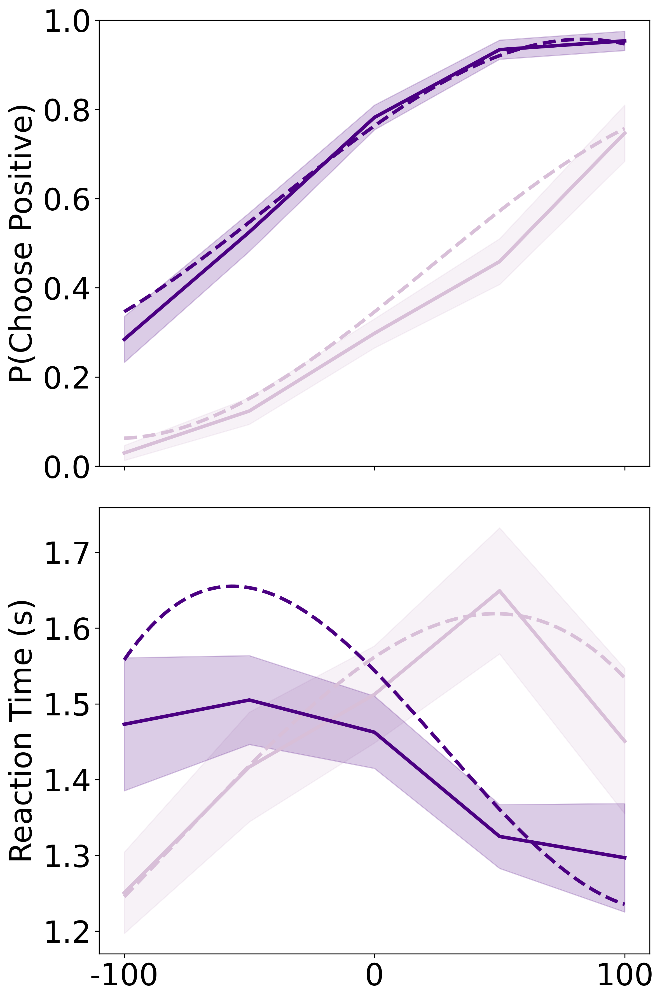

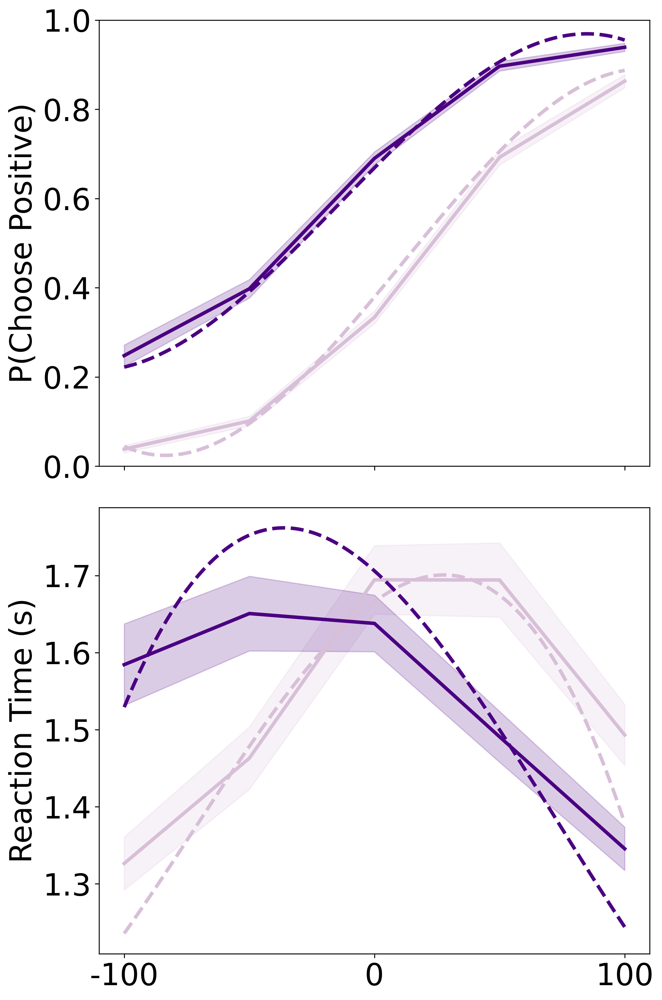

In [272]:
gen_valence_curves(combined_choice_info_study1,combined_rt_info_study1,'study 1')
gen_valence_curves(combined_choice_info_study2,combined_rt_info_study2,'study 2')


In [273]:
# Creating Supplementary Table 6 and 7 
#pos_neg_df1_study1

def seq_sampling_stats(pos_neg_df1, study):

    pos_neg_df1['v_delta_valence_z'] = (pos_neg_df1['v_delta_valence'] - pos_neg_df1['v_delta_valence'].mean()) / pos_neg_df1['v_delta_valence'].std(ddof=1)
    pos_neg_df1["pos_neg_z"] = pos_neg_df1.groupby("subject")["delta_pos_rat"].transform(
        lambda x: (x - x.mean()) / x.std(ddof=1))  
    pos_neg_df1["rt_z"] = pos_neg_df1.groupby("subject")["rt"].transform(
        lambda x: (x - x.mean()) / x.std(ddof=1))  

    model_vars = [
    "rt_z",
    "pos_neg_z",
    "v_delta_valence_z",
    "subject"
    ]

    pos_neg_df1_model = pos_neg_df1.dropna(subset=model_vars).copy()
    
    # Ensure centered / scaled predictor 
    x = pos_neg_df1_model["pos_neg_z"].to_numpy()

    Q, _ = np.linalg.qr(polyvander(x, 2))
    pos_neg_lin  = Q[:, 1]
    pos_neg_quad = Q[:, 2]

    pos_neg_df1_model["pos_neg_lin"] = pos_neg_lin
    pos_neg_df1_model["pos_neg_quad"] = pos_neg_quad

    r, p = pearsonr(pos_neg_df1_model["pos_neg_lin"], pos_neg_df1_model["pos_neg_quad"])
    print(f"r = {r:.3f}, p = {p:.3f}")


    if study == 'study_2':

        ################## CHOICE #################
        model_choice = Lmer("valence_chosen_int ~ pos_neg_z+v_delta_valence_z + (1 + pos_neg_z|subject)", data=pos_neg_df1_model, family = 'binomial')
        results_choice = model_choice.fit()
        print(results_choice)
        print(results_choice["P-val"].apply(lambda x: f"{x:.16f}"))

        X = model_choice.design_matrix

        # Get column names
        feature_names = X.columns

        vif_choice = pd.DataFrame()
        vif_choice["variable"] = feature_names
        vif_choice["VIF"] = [
            variance_inflation_factor(X.values, i)
            for i in range(X.shape[1])
        ]
        print(vif_choice)  

        ################# RT ######################
        model_rt = smf.ols(
            "rt_z ~ pos_neg_lin + pos_neg_quad + pos_neg_lin*v_delta_valence_z",
            data=pos_neg_df1_model
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    
    elif study == 'study_1':

        ############# CHOICE #######################
        model_choice = smf.glm(
            "valence_chosen_int ~ pos_neg_z + v_delta_valence_z",
            data=pos_neg_df1_model,
            family=sm.families.Binomial()
        ).fit()
        print(model_choice.summary())

        # Get design matrix used in OLS
        X = model_choice.model.exog
        feature_names = model_choice.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_choice = pd.DataFrame()
        vif_choice["variable"] = X_no_intercept.columns
        vif_choice["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_choice)

        ################# RT ######################
        model_rt = smf.ols(
            "rt_z ~ pos_neg_lin + pos_neg_quad + pos_neg_lin*v_delta_valence_z",
            data=pos_neg_df1_model
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    

seq_sampling_stats(pos_neg_df1_study1,'study_1')
seq_sampling_stats(pos_neg_df1_study2,'study_2')
  

r = 0.000, p = 1.000
                 Generalized Linear Model Regression Results                  
Dep. Variable:     valence_chosen_int   No. Observations:                 1542
Model:                            GLM   Df Residuals:                     1539
Model Family:                Binomial   Df Model:                            2
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -809.64
Date:                Tue, 18 Aug 2026   Deviance:                       1619.3
Time:                        13:20:21   Pearson chi2:                 1.83e+03
No. Iterations:                     5   Pseudo R-squ. (CS):             0.2848
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept        

/Users/spand31/hssm_env_v3_10/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "bin". Fall back to string conversion. The error is: Converting pandas "Category" series to R factor is only possible when categories are strings.
  warnings.warn('Error while trying to convert '


Linear mixed model fit by maximum likelihood  ['lmerMod']
Formula: valence_chosen_int~pos_neg_z+v_delta_valence_z+(1+pos_neg_z|subject)

Family: binomial	 Inference: parametric

Number of observations: 11186	 Groups: {'subject': 602.0}

Log-likelihood: -4955.094 	 AIC: 9922.189

Random effects:

                Name    Var    Std
subject  (Intercept)  0.948  0.974
subject    pos_neg_z  1.125  1.061

                 IV1        IV2   Corr
subject  (Intercept)  pos_neg_z -0.267

Fixed effects:

                   Estimate  2.5_ci  97.5_ci     SE     OR  OR_2.5_ci  \
(Intercept)           0.593   0.492    0.694  0.051  1.809      1.635   
pos_neg_z             1.810   1.689    1.930  0.061  6.109      5.416   
v_delta_valence_z     1.081   0.970    1.192  0.057  2.947      2.638   

                   OR_97.5_ci   Prob  Prob_2.5_ci  Prob_97.5_ci  Z-stat  \
(Intercept)             2.001  0.644        0.621         0.667  11.511   
pos_neg_z               6.892  0.859        0.844         0

In [274]:
# Robustness check on unmatched distributions

seq_sampling_stats(pos_neg_study1,'study_1')
seq_sampling_stats(pos_neg_study2,'study_2')

r = 0.000, p = 1.000
                 Generalized Linear Model Regression Results                  
Dep. Variable:     valence_chosen_int   No. Observations:                 4818
Model:                            GLM   Df Residuals:                     4815
Model Family:                Binomial   Df Model:                            2
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1876.8
Date:                Tue, 18 Aug 2026   Deviance:                       3753.6
Time:                        13:20:25   Pearson chi2:                 1.12e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.2753
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept        

In [275]:
# Creating Figure 6a (Study 1 and Study 2 Ratings)

ratings_study1 = pd.read_csv('../task_data/study_1/ratings.csv')
ratings_study2 = pd.read_csv('../task_data/study_2/ratings.csv')

phq_study1 = pd.read_csv('../task_data/study_1/phq.csv')
phq_study2 = pd.read_csv('../task_data/study_2/phq.csv')

phq_study1['group'] = np.where(phq_study1['phq_score']> 14,'depressed','hc')
phq_study2['group'] = pd.qcut(phq_study2["phq_score"], q=3, labels=["low", "medium", "high"])

ratings_study1 = pd.merge(ratings_study1,phq_study1, on = ['subject','phq_score'],how = 'inner')
ratings_study2 = pd.merge(ratings_study2,phq_study2, on = ['subject','phq_score'],how = 'inner')

In [276]:
def calc_sub_ratings(ratings_df):

    sub_ratings = ratings_df.groupby(["subject", "group", "valence"], as_index=False, observed = True)["response"].mean()
    sub_ratings2 = sub_ratings.pivot(index=["subject", "group"], columns="valence", values="response").reset_index()
    return sub_ratings2

sub_ratings_study1 = calc_sub_ratings(ratings_study1)
sub_ratings_study2 = calc_sub_ratings(ratings_study2)


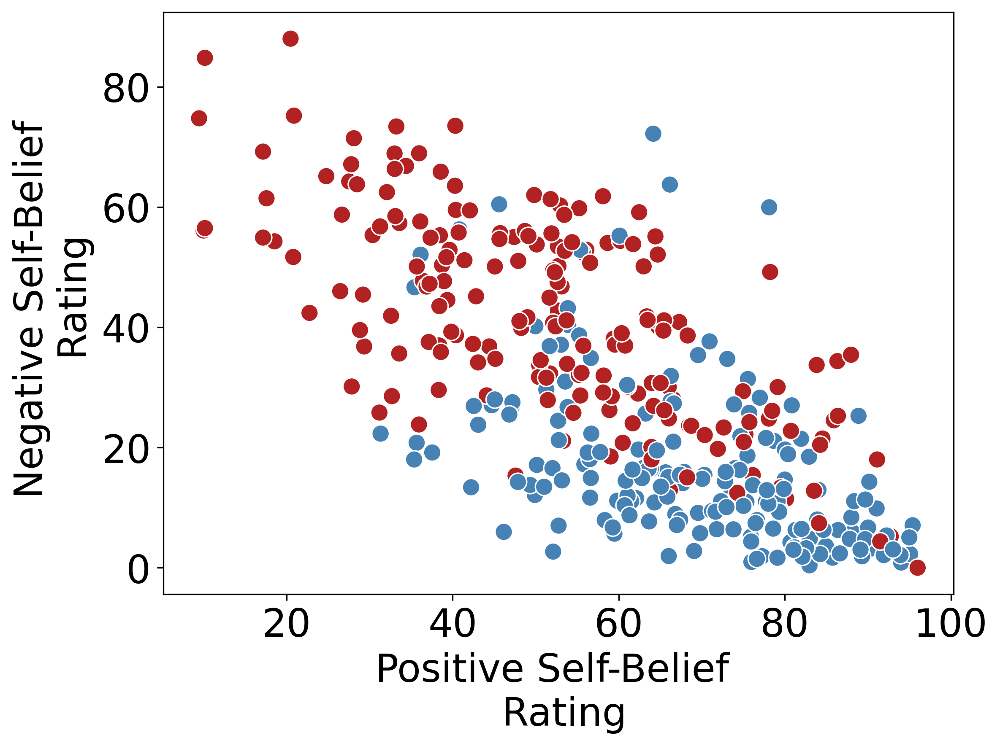

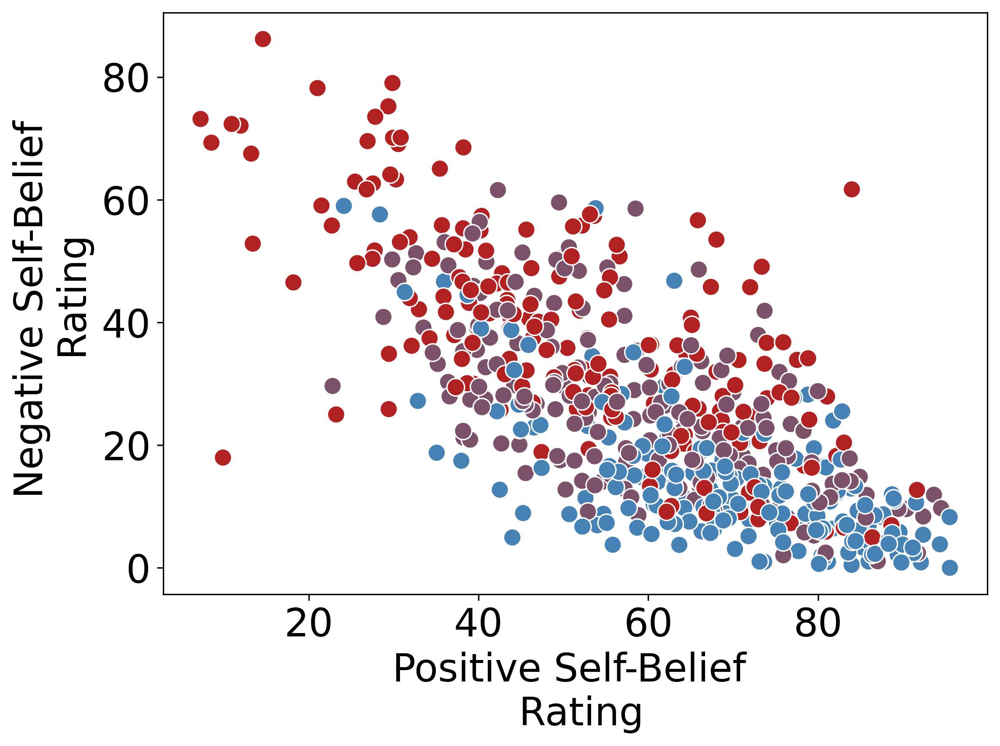

In [277]:
import matplotlib.pyplot as plt

def plot_quadrant(subj, study):

    # -------------------------
    # Study-specific settings
    # -------------------------
    if study == "study_1":
        label_map = {"depressed": "High", "hc": "Low"}
        colors = {"depressed": "firebrick", "hc": "steelblue"}

    elif study == "study_2":
        label_map = {"low": "Low", "medium": "Medium", "high": "High"}
        colors = {
            "low": "steelblue",
            "medium": "#7C526B",
            "high": "firebrick"
        }

    # -------------------------
    # Plot
    # -------------------------
    fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

    ax.scatter(
        subj["positive"],
        subj["negative"],
        c=subj["group"].map(colors),
        edgecolor="white",
        linewidth=0.8,
        s=100
    )

    ax.set_xlabel("Positive Self-Belief \n Rating", fontsize=22)
    ax.set_ylabel("Negative Self-Belief \n Rating", fontsize=22)

    title = None
    legend_title = None
    
    ax.tick_params(axis='x', labelsize=22)
    ax.tick_params(axis='y', labelsize=22)
    
    # Legend
    handles = [
        plt.Line2D([0], [0], marker='o', linestyle='',
                   markerfacecolor=colors[g],
                   markeredgecolor="white",
                   markersize=8,
                   label=label_map[g])
        for g in label_map.keys()
    ]

    #ax.legend(handles=handles,
    #          title=legend_title,
    #          frameon=True,
    #          fontsize=22,
    #          title_fontsize=22)

    plt.tight_layout()
    fig.savefig(
            f"../plots/quadrant_plots_{study}",
            dpi=300,
            bbox_inches="tight"
    )
    plt.show()

plot_quadrant(sub_ratings_study1,'study_1')
plot_quadrant(sub_ratings_study2,'study_2')


In [278]:
# pos_neg_study2 does not have a group column. Adding it here

pos_neg_study2 = pd.merge(pos_neg_study2,phq_study2,on = ['subject','phq_score'],how = 'inner')
pos_neg_study2.head()

,Unnamed: 0,subject,rt,response,left_word,right_word,valence,participant_response,trial_number,word_pair,...,v_intercept,v_r_diff_norm,v_delta_valence,z,t,a,v_delta_valence_z,pos_neg_z,rt_z,group
0,16,study2_602,2.886,1,hater,decisive,PosNeg,decisive,17,"decisive,hater",...,-0.036334,3.191272,-0.27875,0.49,0.523,1.222,-0.868967,-0.766030,0.787109,low
1,17,study2_602,3.713,1,successful,insecure,PosNeg,insecure,18,"insecure,successful",...,-0.036334,3.191272,-0.27875,0.49,0.523,1.222,-0.868967,-0.766030,1.678959,low
2,18,study2_602,1.582,1,inspirational,fool,PosNeg,fool,19,"fool,inspirational",...,-0.036334,3.191272,-0.27875,0.49,0.523,1.222,-0.868967,-0.508541,-0.619146,low
3,19,study2_602,1.552,-1,slob,decisive,PosNeg,slob,20,"decisive,slob",...,-0.036334,3.191272,-0.27875,0.49,0.523,1.222,-0.868967,-0.997770,-0.651498,low
4,20,study2_602,2.369,1,flawless,unlucky,PosNeg,unlucky,21,"flawless,unlucky",...,-0.036334,3.191272,-0.27875,0.49,0.523,1.222,-0.868967,-1.178012,0.229568,low


In [279]:
# Generating Figure 6b

def sim_partial_model(pos_neg_df1,n_sims):

    v_trial_wise_s_r = pos_neg_df1['v_intercept'] + pos_neg_df1['v_r_diff_norm']*pos_neg_df1['r_diff_norm'] 

    a_est = pos_neg_df1["a"].values[0]
    z_est = pos_neg_df1["z"].values[0]
    t_est = pos_neg_df1["t"].values[0]
    v_est = v_trial_wise_s_r.values

    sim_data_s_r = hssm.simulate_data(
        model="ddm",
        theta=dict(
            v=v_est,
            a=a_est,
            z=z_est,
            t=t_est,
        ),
        size=n_sims,
    )

    sim_data_s_r['subject'] = np.tile(pos_neg_df1['subject'],n_sims)
    sim_data_s_r['sim_num'] = np.repeat(np.arange(1,n_sims+1),pos_neg_df1.shape[0])
    sim_data_s_r.rename(columns = {'rt':'pred_rt','response':'pred_response'},inplace=True)
    sim_data_s_r['r_diff_norm'] = np.tile(pos_neg_df1['r_diff_norm'],n_sims)
    sim_data_s_r['valence'] = np.tile(pos_neg_df1['valence'],n_sims)
    sim_data_s_r['valence_left'] = np.tile(pos_neg_df1['valence_left'],n_sims)
    sim_data_s_r['valence_right'] = np.tile(pos_neg_df1['valence_right'],n_sims)
    sim_data_s_r['rating_left'] = np.tile(pos_neg_df1['rating_left'],n_sims)
    sim_data_s_r['rating_right'] = np.tile(pos_neg_df1['rating_right'],n_sims)
    sim_data_s_r['delta_valence'] = np.tile(pos_neg_df1['delta_valence'],n_sims)
    
    sim_data_s_r['pred_valence_chosen'] = np.where(sim_data_s_r['pred_response'] == 1,
                                    sim_data_s_r['valence_right'],
                                    sim_data_s_r['valence_left'])
    sim_data_s_r['pred_valence_chosen_int'] =  np.where(sim_data_s_r['pred_valence_chosen'] == 'positive', 1, 0)
    sim_data_s_r['pred_choice'] = np.where(sim_data_s_r['pred_response'] == -1, 0, 1)

    
    return sim_data_s_r




In [280]:
sim_data_partial_study1 = sim_partial_model(pos_neg_study1,1000)
sim_data_partial_study2 = sim_partial_model(pos_neg_study2,1000)

sim_data_full_study1 = simulate_data(pos_neg_study1,1000)
sim_data_full_study2 = simulate_data(pos_neg_study2,1000)


In [281]:
sim_data_partial_study1['group'] = np.tile(pos_neg_study1['group'],1000)
sim_data_partial_study2['group'] = np.tile(pos_neg_study2['group'],1000)

sim_data_full_study1['group'] = np.tile(pos_neg_study1['group'],1000)
sim_data_full_study2['group'] = np.tile(pos_neg_study2['group'],1000)

In [282]:
# Empirical Plot

def empirical_choose_pos_marg(pos_neg_df):
    
    pos_neg_summ1 = pos_neg_df.groupby(['subject','group'],as_index=False,observed=True)['valence_chosen_int'].mean()

    pos_neg_summ2 = pos_neg_summ1.groupby('group',as_index=False,observed=True)['valence_chosen_int'].agg(
         mean='mean',
            se=lambda x: x.std(ddof=1) / np.sqrt(x.count())
    ).reset_index()

    return pos_neg_summ2

emp_choose_pos_marg_study1 = empirical_choose_pos_marg(pos_neg_study1)
emp_choose_pos_marg_study2 = empirical_choose_pos_marg(pos_neg_study2)


In [283]:
def pred_choose_pos_marg(sim_data):

    pos_neg_summ1 = sim_data.groupby(['subject','group','sim_num'],as_index=False,observed=True)['pred_valence_chosen_int'].mean()

    pos_neg_summ2 = pos_neg_summ1.groupby('group',as_index=False,observed=True)['pred_valence_chosen_int'].mean()

    return pos_neg_summ2

pred_sr_choose_pos_marg_study1 = pred_choose_pos_marg(sim_data_partial_study1)
pred_sr_choose_pos_marg_study2 = pred_choose_pos_marg(sim_data_partial_study2)

pred_full_choose_pos_marg_study1 = pred_choose_pos_marg(sim_data_full_study1)
pred_full_choose_pos_marg_study2 = pred_choose_pos_marg(sim_data_full_study2)

In [284]:
def combine_emp_pred(sim_overall,sim_s_r,emp):

    sim_overall['type'] = 'overall'
    sim_s_r['type'] = 's_r'
    sim_combo = pd.concat([sim_overall,sim_s_r],axis=0, ignore_index=True)
    sim_combo = sim_combo.rename(columns = {'pred_valence_chosen_int':'mean'})
    sim_combo['se'] = 'NA'

    emp['type'] = 'observed'
    emp2 = emp.drop(columns=["index"], errors="ignore")
    combo_df = pd.concat([sim_combo,emp2],axis=0, ignore_index=True)

    return combo_df


In [285]:
combo_study1 = combine_emp_pred(pred_full_choose_pos_marg_study1,pred_sr_choose_pos_marg_study1,emp_choose_pos_marg_study1)
combo_study2 = combine_emp_pred(pred_full_choose_pos_marg_study2,pred_sr_choose_pos_marg_study2,emp_choose_pos_marg_study2)


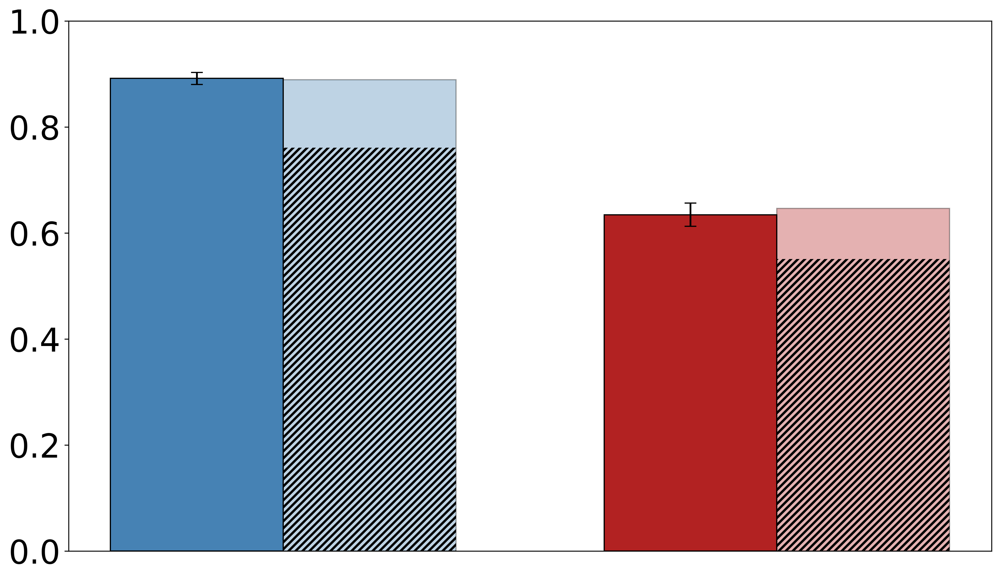

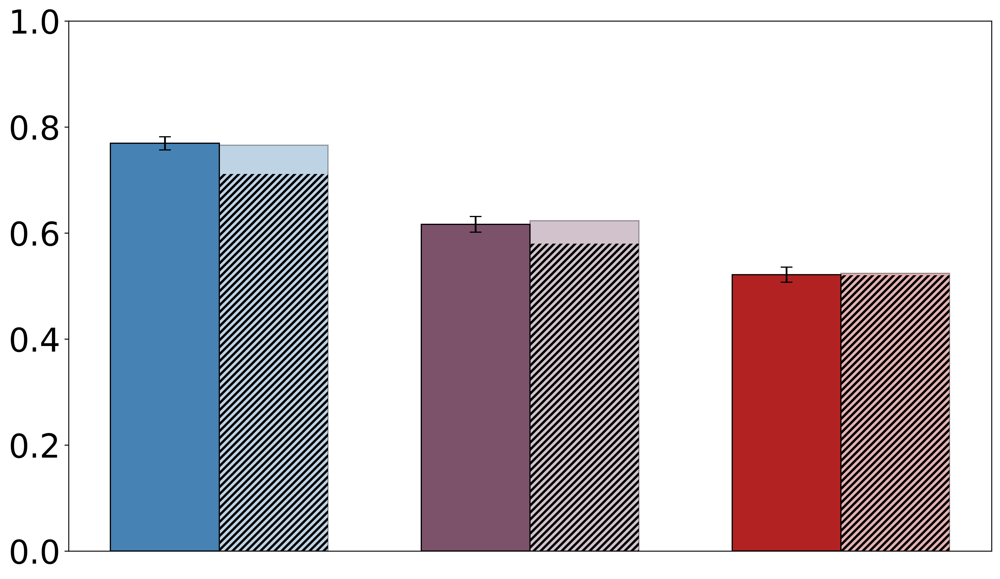

In [286]:
def plot_choose_pos_marg(pos_neg_combo,study):

    fig, ax = plt.subplots(figsize=(12,7), dpi = 300)


    # --- your existing series ---
    obs = pos_neg_combo[pos_neg_combo["type"] == "observed"].set_index("group")["mean"]
    overall = pos_neg_combo[pos_neg_combo["type"] == "overall"].set_index("group")["mean"]
    sr = pos_neg_combo[pos_neg_combo["type"] == "s_r"].set_index("group")["mean"]

    if study == "study_2":
        groups = ["low", "medium", "high"]
        color_map = {"low": "steelblue", "medium": "#7C526B","high": "firebrick"}
        x = np.arange(len(groups))
        width = 0.35

    elif study == "study_1":
        groups = ["HC", "Depressed"]
        color_map = {"HC": "steelblue", "Depressed": "firebrick"}
        x = np.arange(len(groups))
        width = 0.35

    # --- Extract observed mean and SE ---
    obs_df = pos_neg_combo[pos_neg_combo["type"] == "observed"].set_index("group")
    obs_vals = obs_df.reindex(groups)["mean"].values
    obs_errs = obs_df.reindex(groups)["se"].values.astype(float)  # convert from string 'NA' to float


    overall_vals = overall.reindex(groups).values
    sr_vals = sr.reindex(groups).values

    plt.rcParams['hatch.linewidth'] = 2.0  


    # --- Observed bars (solid) ---
    obs_colors = [color_map[g] for g in groups]
    # --- Observed bars (solid) with error bars ---
    ax.bar(x - width/2, obs_vals, width,
           color=obs_colors, edgecolor='black', label="_nolegend_",
           yerr=obs_errs, capsize=5, ecolor='black', zorder=2)

    # --- Predicted (Overall) bars ---
    for i, g in enumerate(groups):
        c = color_map[g]
        ax.bar(x[i] + width/2, overall_vals[i], width,
               color=c, alpha=0.35, edgecolor='black', label="_nolegend_")
        ax.bar(x[i] + width/2, sr_vals[i], width,
               facecolor='none', edgecolor='black',
               hatch='////', linewidth=0, zorder=3, label="_nolegend_")

    # cosmetics
    ax.set_xticks(x, groups, fontsize=28)
    ax.tick_params(axis="y", labelsize=28)
    ax.set_ylim(0,1)

    if study == 'study_2':
        color_handles = [
            Patch(facecolor='steelblue', label='Low'),
            Patch(facecolor='#7C526B', label='Medium'),
            Patch(facecolor='firebrick', label='High')
        ]
    elif study == 'study_1':
        color_handles = [
            Patch(facecolor='steelblue', label='HC'),
            Patch(facecolor='firebrick', label='Depressed')
        ]

    #fig.patch.set_edgecolor('black')
    fig.patch.set_linewidth(2)

    ax.set_xticks([])
    plt.tight_layout()
    fig.savefig(
            f"../plots/choose_pos_marg_{study}",
            dpi=300,
            bbox_inches="tight"
    )    
    plt.show()


plot_choose_pos_marg(combo_study1,'study_1')
plot_choose_pos_marg(combo_study2,'study_2')

In [287]:
# Generating Figure 6c

drift_depression_model_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/drift_depression_model.nc')
drift_depression_model_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/drift_depression_model.nc')



In [288]:
# Supplementary Table 8
param_summary_df_study1 = az.summary(drift_depression_model_study1, var_names = ['t','z','v_r_diff_norm','v_group_int','v_delta_valence:group_int',
                                          'v_delta_valence','v_Intercept'])
print(param_summary_df_study1.head(10))
# NOTE GROUP INT IS CODED AS -1 -> DEPRESSED, 1 -> HEALTHY CONTROL. THE COEFFICIENT SIGN IS REVERSED TO LOOK AT HOW V VARIES WITH INCREASING DEPRESSION.


param_summary_df_study2 = az.summary(drift_depression_model_study2, var_names = ['t','z','v_r_diff_norm','v_phq_scale','v_delta_valence:phq_scale',
                                          'v_delta_valence','v_Intercept'])
print(param_summary_df_study2.head(10))

                            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  \
t                          0.541  0.004   0.533    0.548      0.000      0.0   
z                          0.484  0.003   0.478    0.491      0.000      0.0   
v_r_diff_norm              1.965  0.070   1.830    2.094      0.001      0.0   
v_group_int                0.011  0.012  -0.012    0.035      0.000      0.0   
v_delta_valence:group_int  0.222  0.039   0.145    0.293      0.000      0.0   
v_delta_valence            0.518  0.039   0.443    0.591      0.000      0.0   
v_Intercept               -0.023  0.015  -0.051    0.005      0.000      0.0   

                           ess_bulk  ess_tail  r_hat  
t                           40304.0   31511.0    1.0  
z                           43555.0   31073.0    1.0  
v_r_diff_norm               19631.0   27102.0    1.0  
v_group_int                 29387.0   31593.0    1.0  
v_delta_valence:group_int   12562.0   20410.0    1.0  
v_delta_valence             1

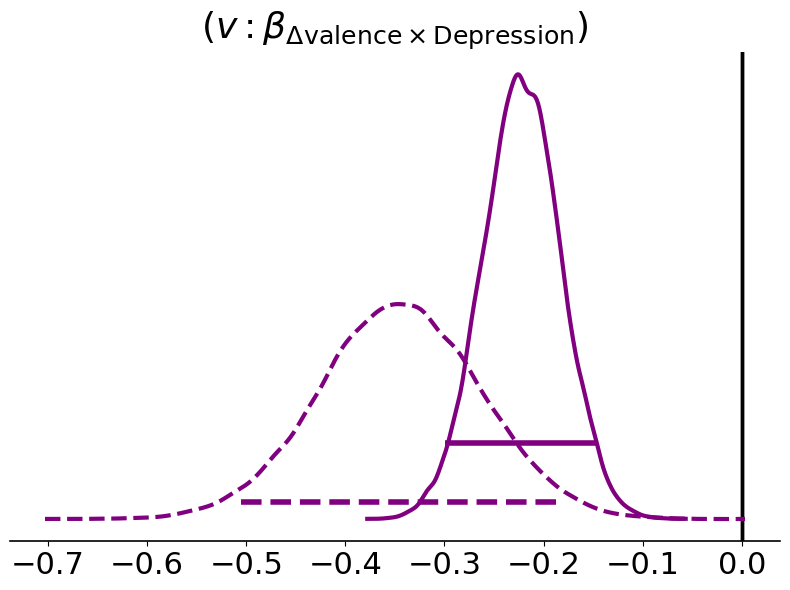

In [289]:
# ---------- figure layout ----------
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Extract samples for the variable of interest
samples1 = drift_depression_model_study1.posterior["v_delta_valence:group_int"].values.flatten()

# Mirror by multiplying by -1. (Because 1 corresponded to HC in Study 1. We want 1 to correspond to Depressed, So mulitplying by -1)
samples1_mirror = -samples1

# Wrap them back into an InferenceData container so az.plot_posterior works
idata1_mirror = az.from_dict(posterior={"v_delta_valence:group_int": samples1_mirror})

# ---------- COLOR DEFINITIONS ----------
purple = tuple(np.array([0.29, 0.0, 0.51]))
orange = tuple(np.array([1.0, 0.55, 0.0]))
interaction = tuple((np.array(purple) + np.array(orange)) / 2)

# ======================
# INTERACTION PANEL ONLY
# ======================
draw_posterior_clean(
    idata1_mirror,
    "v_delta_valence:group_int",
    ax,
    "purple",
    alpha = 1,
    mean_y_frac=0.55,
    hdi_y_frac=0.20,
)

draw_posterior_clean(
    drift_depression_model_study2,
    "v_delta_valence:phq_scale",
    ax,
    "purple",
    alpha = 1,
    mean_y_frac=0.38,
    hdi_y_frac=0.08,
    linestyle = '--'
)

ax.set_title(r'$(v: \beta_{\Delta \mathrm{valence} \times \mathrm{Depression}})$', fontsize=26)

# ======================
# REMOVE ALL TEXT ANNOTATIONS
# ======================
for txt in ax.texts:
    txt.set_visible(False)

# ======================
# STYLING
# ======================
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_linewidth(1.2)

ax.tick_params(axis="x", labelsize=22)
ax.set_yticks([])

# ======================
# LEGEND
# ======================

plt.tight_layout()
plt.savefig(
            "../plots/depression_posteriors",
            dpi=300,
            bbox_inches="tight"
    )
plt.show()


In [290]:
# Generating Figure 6d

pos_neg_hc_study1 = pos_neg_study1[pos_neg_study1['group']=='HC'].copy()
pos_neg_dep_study1 = pos_neg_study1[pos_neg_study1['group']=='Depressed'].copy()

pos_neg_low_study2 = pos_neg_study2[pos_neg_study2['group']=='low'].copy()
pos_neg_medium_study2 = pos_neg_study2[pos_neg_study2['group']=='medium'].copy()
pos_neg_high_study2 = pos_neg_study2[pos_neg_study2['group']=='high'].copy()


In [291]:
def match_histogram_three_groups_simple(
    df_high, df_medium, df_low, bin_size=20, random_state=None
):
    """
    Match three dataframes on raw bin frequency.

    For each bin:
        n = min(count_high, count_medium, count_low)
        sample n from each group

    Returns:
        matched_high_df, matched_medium_df, matched_low_df, bin_edges
    """

    # Copy to avoid modifying originals
    df_high = df_high.copy()
    df_medium = df_medium.copy()
    df_low = df_low.copy()

    # Ensure numeric
    for df in (df_high, df_medium, df_low):
        df["delta_pos_rat"] = pd.to_numeric(df["delta_pos_rat"], errors="coerce")

    # Define shared bin edges
    min_val = min(
        df_high["delta_pos_rat"].min(),
        df_medium["delta_pos_rat"].min(),
        df_low["delta_pos_rat"].min()
    )
    max_val = max(
        df_high["delta_pos_rat"].max(),
        df_medium["delta_pos_rat"].max(),
        df_low["delta_pos_rat"].max()
    )

    bin_edges = np.arange(min_val, max_val + bin_size, bin_size)
    if len(bin_edges) < 2:
        bin_edges = np.array([min_val, max_val])

    # Assign bins using pd.cut (cleaner + consistent)
    df_high["bin"]   = pd.cut(df_high["delta_pos_rat"], bins=bin_edges, include_lowest=True)
    df_medium["bin"] = pd.cut(df_medium["delta_pos_rat"], bins=bin_edges, include_lowest=True)
    df_low["bin"]    = pd.cut(df_low["delta_pos_rat"], bins=bin_edges, include_lowest=True)

    matched_high, matched_medium, matched_low = [], [], []

    # Get all bins present in any group
    all_bins = sorted(
        set(df_high["bin"].dropna()) |
        set(df_medium["bin"].dropna()) |
        set(df_low["bin"].dropna())
    )

    for b in all_bins:
        h_bin = df_high[df_high["bin"] == b]
        m_bin = df_medium[df_medium["bin"] == b]
        l_bin = df_low[df_low["bin"] == b]

        # Frequency matching
        n = min(len(h_bin), len(m_bin), len(l_bin))

        if n > 0:
            matched_high.append(h_bin.sample(n=n, random_state=random_state))
            matched_medium.append(m_bin.sample(n=n, random_state=random_state))
            matched_low.append(l_bin.sample(n=n, random_state=random_state))

    matched_high_df = pd.concat(matched_high, ignore_index=True) if matched_high else pd.DataFrame()
    matched_medium_df = pd.concat(matched_medium, ignore_index=True) if matched_medium else pd.DataFrame()
    matched_low_df = pd.concat(matched_low, ignore_index=True) if matched_low else pd.DataFrame()

    return matched_high_df, matched_medium_df, matched_low_df, bin_edges

hc_matched_study1, dep_matched_study1, bin_edges = match_histogram_simple(
    pos_neg_hc_study1, pos_neg_dep_study1, bin_size=10, random_state=42
)

high_matched, med_matched, low_matched, bin_edges = match_histogram_three_groups_simple(
    pos_neg_high_study2, pos_neg_medium_study2, pos_neg_low_study2, bin_size=10, random_state=42
)

In [292]:
combo_depr_study1 = pd.concat([hc_matched_study1,dep_matched_study1],axis = 0, ignore_index = 0)
combo_depr_study2 = pd.concat([high_matched,med_matched,low_matched],axis = 0, ignore_index = 0)

In [293]:
def seq_sampling_depr(pos_neg_matched):

    pos_neg_temp_matched_choice = pos_neg_matched.groupby(['subject','group','delta_pos_mod'], as_index=False, observed = True)['valence_chosen_int'].mean()

    pos_neg_temp2_matched_choice = (
        pos_neg_temp_matched_choice
          .groupby(['group','delta_pos_mod'], observed=True, as_index=False)
          .agg(
              mean=('valence_chosen_int', 'mean'),
              se=('valence_chosen_int', lambda x: x.std(ddof=1) / np.sqrt(len(x)))
          )
    )

    pos_neg_temp_matched_rt = pos_neg_matched.groupby(['subject','group','delta_pos_mod'],observed = True,as_index=False)['rt'].median()

    pos_neg_temp2_matched_rt = (
        pos_neg_temp_matched_rt
          .groupby(['group','delta_pos_mod'], observed=True, as_index=False)
          .agg(
              mean=('rt', 'mean'),
              se=('rt', lambda x: x.std(ddof=1) / np.sqrt(len(x)))
          )
    )

    return pos_neg_temp2_matched_choice, pos_neg_temp2_matched_rt

choice_depr_study1, rt_depr_study1 = seq_sampling_depr(combo_depr_study1) 
choice_depr_study2, rt_depr_study2 = seq_sampling_depr(combo_depr_study2) 


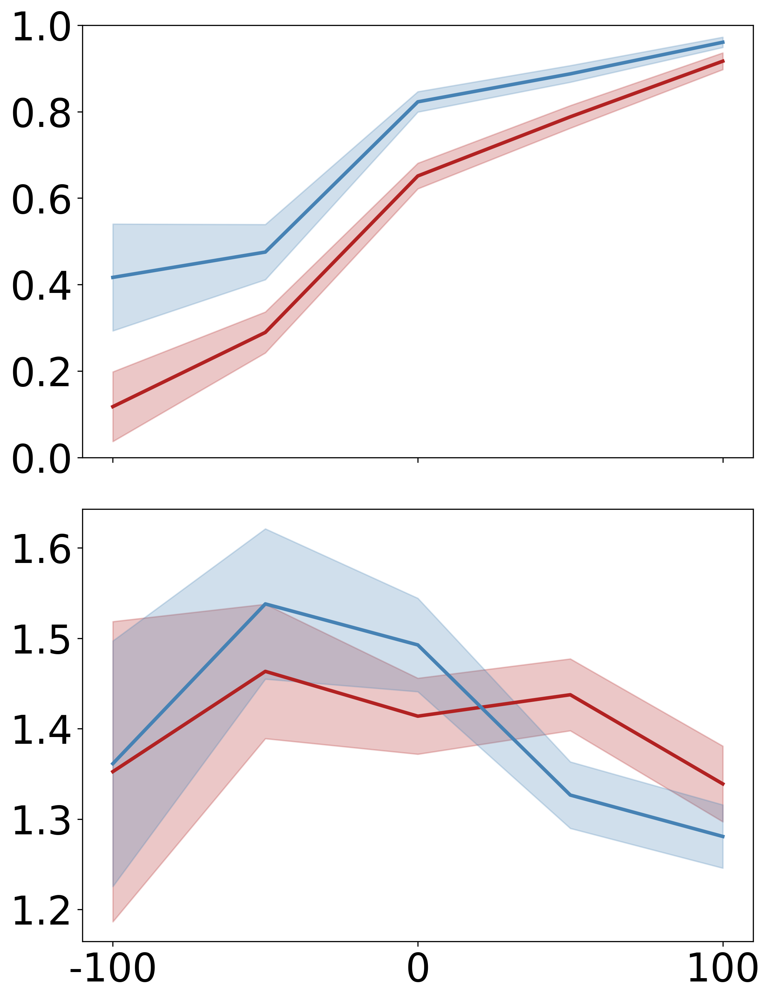

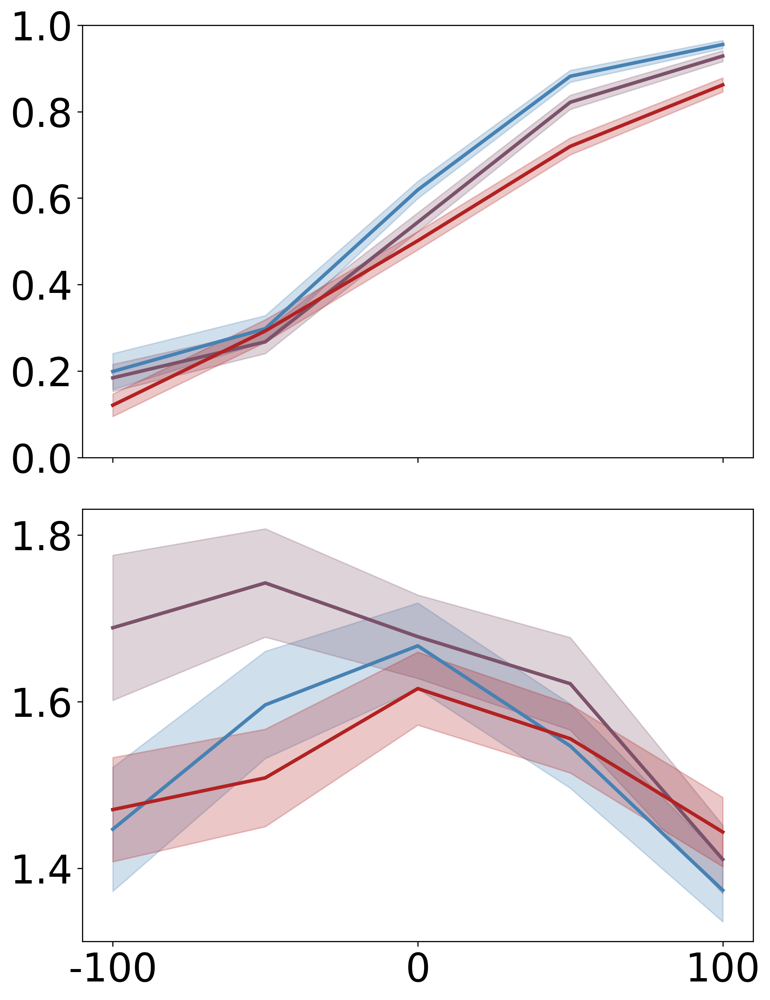

In [294]:

def plot_seq_sampling_depr(choice_depr,rt_depr,study):

    if study == 'study_2':
        colors = {
            "low": "steelblue",
            "medium": "#7C526B",   # midpoint between steelblue & firebrick
            "high": "firebrick"
        }
    elif study == 'study_1':
        colors = {
            "HC": "steelblue",
            "Depressed": "firebrick"
        }
        
    fig, (ax_choice, ax_rt) = plt.subplots(
        2, 1, figsize=(8, 10), dpi=300, sharex=True
    )


    for grp, sub in choice_depr.groupby("group"):
        sub = sub.sort_values("delta_pos_mod")

        ax_choice.plot(
            sub["delta_pos_mod"],
            sub["mean"],
            linewidth=2.5,
            color=colors[grp],
            label=grp.capitalize()
        )
        ax_choice.fill_between(
            sub["delta_pos_mod"],
            sub["mean"] - sub["se"],
            sub["mean"] + sub["se"],
            color=colors[grp],
            alpha=0.25
        )

    #ax_choice.set_ylabel("P(Choose Positive)", fontsize=22)
    ax_choice.set_ylim(0, 1)
    ax_choice.tick_params(axis="y", labelsize=28)
    #ax_choice.legend(frameon=False, fontsize=18)


    for grp, sub in rt_depr.groupby("group"):
        sub = sub.sort_values("delta_pos_mod")

        ax_rt.plot(
            sub["delta_pos_mod"],
            sub["mean"],   # ms → seconds
            linewidth=2.5,
            color=colors[grp]
        )
        ax_rt.fill_between(
            sub["delta_pos_mod"],
            (sub["mean"] - sub["se"]),
            (sub["mean"] + sub["se"]),
            color=colors[grp],
            alpha=0.25
        )

    ax_rt.tick_params(axis="y", labelsize=28)

    ax_rt.set_xticks([-0.2, 0.0, 0.2])
    ax_rt.set_xticklabels([-100, 0, 100], fontsize=28)

    plt.tight_layout(h_pad=2)
    plt.savefig(
        f"../plots/seq_sampling_depr_{study}",
        bbox_inches="tight",
        dpi=300
    )
    plt.show()

plot_seq_sampling_depr(choice_depr_study1,rt_depr_study1,'study_1')
plot_seq_sampling_depr(choice_depr_study2,rt_depr_study2,'study_2')



In [295]:
phq_study2['phq_z'] = (phq_study2["phq_score"] - phq_study2["phq_score"].mean()) / phq_study2["phq_score"].std(ddof=1)


In [296]:
combo_depr_study2 = pd.merge(combo_depr_study2,phq_study2,on = ['subject','phq_score','group'], how = 'inner')


In [297]:
# Creating Supplementary Table 9 and Table 10


def seq_sampling_stats_depr(pos_neg_df1, study):
    
    pos_neg_df1["pos_neg_z"] = pos_neg_df1.groupby("subject")["delta_pos_rat"].transform(
        lambda x: (x - x.mean()) / x.std(ddof=1))  
    pos_neg_df1["rt_z"] = pos_neg_df1.groupby("subject")["rt"].transform(
        lambda x: (x - x.mean()) / x.std(ddof=1))  

    model_vars = [
    "rt_z",
    "pos_neg_z",
    "group",    
    "subject"
    ]

    pos_neg_df1_model = pos_neg_df1.dropna(subset=model_vars).copy()
    
    # Ensure centered / scaled predictor 
    x = pos_neg_df1_model["pos_neg_z"].to_numpy()

    Q, _ = np.linalg.qr(polyvander(x, 2))
    pos_neg_lin  = Q[:, 1]
    pos_neg_quad = Q[:, 2]

    pos_neg_df1_model["pos_neg_lin"] = pos_neg_lin
    pos_neg_df1_model["pos_neg_quad"] = pos_neg_quad

    r, p = pearsonr(pos_neg_df1_model["pos_neg_lin"], pos_neg_df1_model["pos_neg_quad"])
    print(f"r = {r:.3f}, p = {p:.3f}")

    if study == 'study_2':

        ################## CHOICE #################
        model_choice = Lmer("valence_chosen_int ~ pos_neg_z+ phq_z + (1 + pos_neg_z|subject)", data=pos_neg_df1_model, family = 'binomial')
        results_choice = model_choice.fit()
        print(results_choice)
        print(results_choice["P-val"].apply(lambda x: f"{x:.16f}"))

        X = model_choice.design_matrix

        # Get column names
        feature_names = X.columns

        vif_choice = pd.DataFrame()
        vif_choice["variable"] = feature_names
        vif_choice["VIF"] = [
            variance_inflation_factor(X.values, i)
            for i in range(X.shape[1])
        ]
        print(vif_choice)  

        ################# RT ######################
        model_rt = smf.ols(
            "rt_z ~ pos_neg_lin + pos_neg_quad + pos_neg_lin*phq_z",
            data=pos_neg_df1_model
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    
    elif study == 'study_1':

        ############# CHOICE #######################
        model_choice = Lmer("valence_chosen_int ~ pos_neg_z + group + (1 +pos_neg_z|subject)", data=pos_neg_df1_model, family = 'binomial')
        results_choice = model_choice.fit()
        print(results_choice)
        print(results_choice["P-val"].apply(lambda x: f"{x:.16f}"))

        # Get fixed-effects design matrix from pymer4
        X = model_choice.design_matrix

        # Get column names
        feature_names = X.columns

        vif_choice = pd.DataFrame()
        vif_choice["variable"] = feature_names
        vif_choice["VIF"] = [
            variance_inflation_factor(X.values, i)
            for i in range(X.shape[1])
        ]
        print(vif_choice)

        ################# RT ######################
        model_rt = smf.ols(
            "rt_z ~ pos_neg_lin + pos_neg_quad + pos_neg_lin*group",
            data=pos_neg_df1_model
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    

seq_sampling_stats_depr(combo_depr_study1,'study_1')
seq_sampling_stats_depr(combo_depr_study2,'study_2')


# Note here the baseline is Depressed for Study 1.

r = 0.000, p = 1.000


/Users/spand31/hssm_env_v3_10/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: UserWarning: DataFrame contains duplicated elements in the index, which will lead to loss of the row names in the resulting data.frame
  warnings.warn('DataFrame contains duplicated elements in the index, '
/Users/spand31/hssm_env_v3_10/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "bin". Fall back to string conversion. The error is: Converting pandas "Category" series to R factor is only possible when categories are strings.
  warnings.warn('Error while trying to convert '


Linear mixed model fit by maximum likelihood  ['lmerMod']
Formula: valence_chosen_int~pos_neg_z+group+(1+pos_neg_z|subject)

Family: binomial	 Inference: parametric

Number of observations: 3003	 Groups: {'subject': 368.0}

Log-likelihood: -1195.089 	 AIC: 2402.178

Random effects:

                Name    Var    Std
subject  (Intercept)  2.973  1.724
subject    pos_neg_z  0.309  0.556

                 IV1        IV2   Corr
subject  (Intercept)  pos_neg_z  0.017

Fixed effects:

             Estimate  2.5_ci  97.5_ci     SE     OR  OR_2.5_ci  OR_97.5_ci  \
(Intercept)     1.655   1.334    1.976  0.164  5.235      3.797       7.217   
pos_neg_z       0.877   0.695    1.058  0.093  2.403      2.004       2.881   
groupHC         1.269   0.801    1.737  0.239  3.556      2.227       5.679   

              Prob  Prob_2.5_ci  Prob_97.5_ci  Z-stat  P-val  Sig  
(Intercept)  0.840        0.792         0.878  10.103    0.0  ***  
pos_neg_z    0.706        0.667         0.742   9.458    0.0  

/Users/spand31/hssm_env_v3_10/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "bin". Fall back to string conversion. The error is: Converting pandas "Category" series to R factor is only possible when categories are strings.
  warnings.warn('Error while trying to convert '


Linear mixed model fit by maximum likelihood  ['lmerMod']
Formula: valence_chosen_int~pos_neg_z+phq_z+(1+pos_neg_z|subject)

Family: binomial	 Inference: parametric

Number of observations: 10863	 Groups: {'subject': 602.0}

Log-likelihood: -4935.573 	 AIC: 9883.146

Random effects:

                Name    Var    Std
subject  (Intercept)  1.767  1.329
subject    pos_neg_z  0.972  0.986

                 IV1        IV2   Corr
subject  (Intercept)  pos_neg_z -0.305

Fixed effects:

             Estimate  2.5_ci  97.5_ci     SE     OR  OR_2.5_ci  OR_97.5_ci  \
(Intercept)     1.108   0.980    1.236  0.065  3.028      2.664       3.442   
pos_neg_z       1.675   1.558    1.791  0.059  5.337      4.751       5.995   
phq_z          -0.484  -0.609   -0.359  0.064  0.616      0.544       0.698   

              Prob  Prob_2.5_ci  Prob_97.5_ci  Z-stat  P-val  Sig  
(Intercept)  0.752        0.727         0.775  16.946    0.0  ***  
pos_neg_z    0.842        0.826         0.857  28.236    0.0 

In [298]:
pos_neg_study2 = pd.merge(pos_neg_study2,phq_study2,on = ['subject','phq_score','group'], how = 'inner')

In [299]:
## Robustness check with unmatched distributions

seq_sampling_stats_depr(pos_neg_study1,'study_1')
seq_sampling_stats_depr(pos_neg_study2,'study_2')
  

r = 0.000, p = 1.000
Linear mixed model fit by maximum likelihood  ['lmerMod']
Formula: valence_chosen_int~pos_neg_z+group+(1+pos_neg_z|subject)

Family: binomial	 Inference: parametric

Number of observations: 4818	 Groups: {'subject': 372.0}

Log-likelihood: -1840.383 	 AIC: 3692.767

Random effects:

                Name    Var    Std
subject  (Intercept)  3.875  1.968
subject    pos_neg_z  0.282  0.531

                 IV1        IV2   Corr
subject  (Intercept)  pos_neg_z -0.099

Fixed effects:

             Estimate  2.5_ci  97.5_ci     SE      OR  OR_2.5_ci  OR_97.5_ci  \
(Intercept)     1.006   0.692    1.320  0.160   2.735      1.998       3.744   
pos_neg_z       0.948   0.810    1.086  0.070   2.581      2.249       2.962   
groupHC         2.492   1.991    2.993  0.256  12.083      7.322      19.938   

              Prob  Prob_2.5_ci  Prob_97.5_ci  Z-stat  P-val  Sig  
(Intercept)  0.732        0.666         0.789   6.278    0.0  ***  
pos_neg_z    0.721        0.692      

In [300]:
# Generating Figure 7

recall_study1 = pd.read_csv('../task_data/study_1/recall.csv')
recall_study2 = pd.read_csv('../task_data/study_2/recall.csv')

recall_study1["group"] = np.where(recall_study1["phq_score"] > 14,'depressed','hc')
recall_study2 = pd.merge(recall_study2,phq_study2, on = ['subject','phq_score'], how = 'inner')

In [301]:
def calc_overall_recall(recall_df, study):
    subj_recall = (
        recall_df
        .groupby(['subject', 'group','phq_score'], as_index=False, observed = True)['recalled']
        .sum()
        .rename(columns={'recalled': 'n_words_recalled'})
    )

    group_avg = (
        subj_recall
        .groupby('group', observed=True, as_index=False)['n_words_recalled']
        .mean()
    ) 
    overall_avg_recall = subj_recall['n_words_recalled'].mean()
    
    print(group_avg)
    print(overall_avg_recall)

    if study == 'study_1':
        hc = subj_recall.loc[subj_recall['group'] == 'hc', 'n_words_recalled']
        dep = subj_recall.loc[subj_recall['group'] == 'depressed', 'n_words_recalled']

        ttest = ttest_ind(hc, dep, equal_var=False, nan_policy='omit')
        print(f"Welch t-test hc vs dep: t = {ttest.statistic:.3f}, p = {ttest.pvalue:.3f}")

    elif study == 'study_2':
        model = smf.ols("n_words_recalled ~ phq_score", data=subj_recall).fit()
        print(model.summary())


calc_overall_recall(recall_study1,'study_1')
calc_overall_recall(recall_study2,'study_2')


       group  n_words_recalled
0  depressed          3.936842
1         hc          4.554945
4.239247311827957
Welch t-test hc vs dep: t = 1.456, p = 0.146
    group  n_words_recalled
0     low          9.808612
1  medium          9.182741
2    high          9.168367
9.395348837209303
                            OLS Regression Results                            
Dep. Variable:       n_words_recalled   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.2073
Date:                Tue, 18 Aug 2026   Prob (F-statistic):              0.649
Time:                        13:28:34   Log-Likelihood:                -1944.6
No. Observations:                 602   AIC:                             3893.
Df Residuals:                     600   BIC:                             3902.
Df Model:                           1                                         
Cov

Welch t-test hc vs dep: t = 2.353, p = 0.019


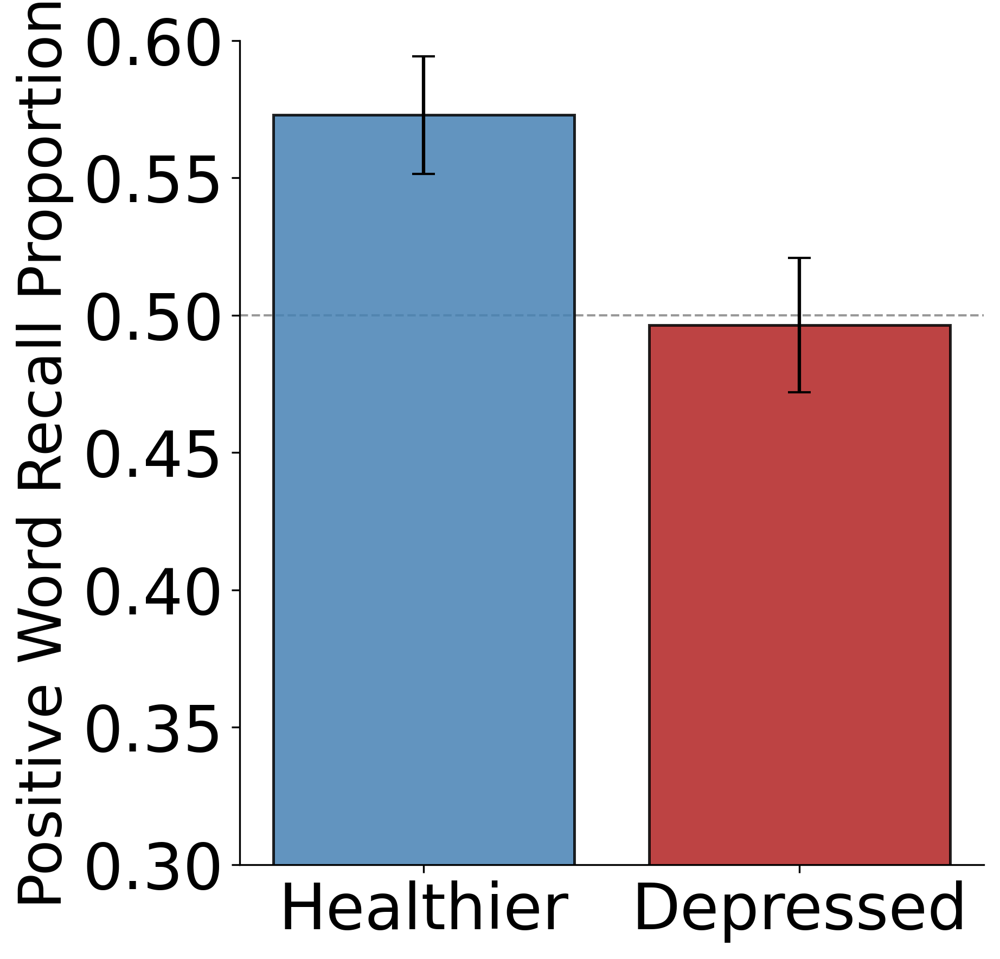

                            OLS Regression Results                            
Dep. Variable:               prop_pos   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     6.467
Date:                Tue, 18 Aug 2026   Prob (F-statistic):             0.0113
Time:                        13:28:35   Log-Likelihood:                 132.17
No. Observations:                 575   AIC:                            -260.3
Df Residuals:                     573   BIC:                            -251.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.5039      0.015     34.071      0.0

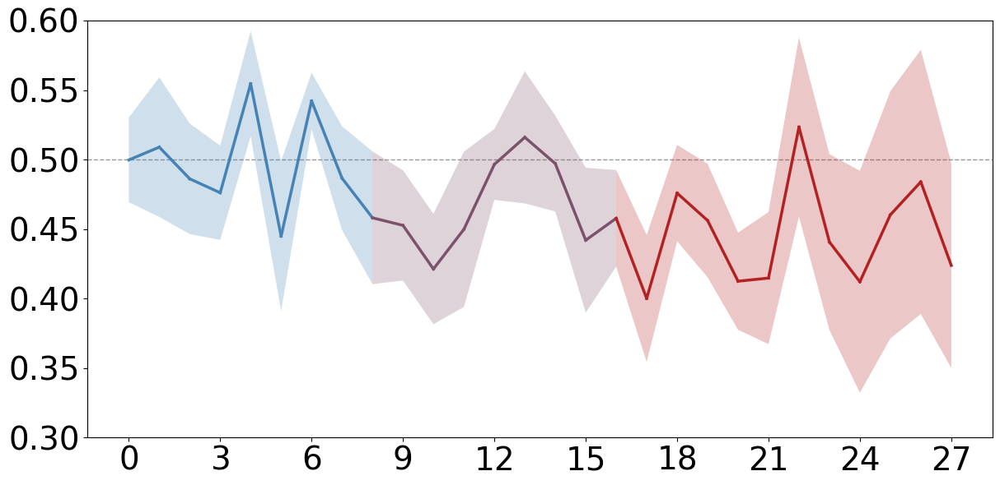

In [302]:
def plot_valenced_recall(recall_df,study):

    recalled_words = recall_df[recall_df['recalled']==1].copy()
    
    summary = (
            recalled_words.groupby(["subject","phq_score","group"], observed = True)
              .agg(
                  total_recalled=("words", "count"),
                  pos_words=("valence", lambda x: (x == "positive").sum()),
                  neg_words=("valence", lambda x: (x == "negative").sum())
              )
              .reset_index()
            )

    # proportions
    summary["prop_pos"] = summary["pos_words"] / summary["total_recalled"]
    summary["prop_neg"] = summary["neg_words"] / summary["total_recalled"] 
    
    if (study =='study_1'):

        hc = summary.loc[summary['group'] == 'hc', 'prop_pos']
        dep = summary.loc[summary['group'] == 'depressed', 'prop_pos']

        ttest = ttest_ind(hc, dep, equal_var=False, nan_policy='omit')
        print(f"Welch t-test hc vs dep: t = {ttest.statistic:.3f}, p = {ttest.pvalue:.3f}")
        
        phq_group_summary = (
            summary.groupby("group")
            .agg(
                mean_prop_pos=("prop_pos", "mean"),
                se_prop_pos=("prop_pos", lambda x: x.std(ddof=1) / np.sqrt(len(x)))
            )
            .reset_index()
        )

        phq_group_summary["group"] = phq_group_summary["group"].replace({
            "hc": "Healthier",
            "depressed": "Depressed"
        })

        # Force plotting order
        phq_group_summary["group"] = pd.Categorical(
            phq_group_summary["group"],
            categories=["Healthier", "Depressed"],
            ordered=True
        )

        phq_group_summary = phq_group_summary.sort_values("group")

        colors = {
            "Healthier": "steelblue",
            "Depressed": "firebrick"
        }

        fig, ax = plt.subplots(figsize=(6, 6), dpi=300)

        ax.bar(
            phq_group_summary["group"],
            phq_group_summary["mean_prop_pos"],
            yerr=phq_group_summary["se_prop_pos"],
            capsize=5,
            color=[colors[g] for g in phq_group_summary["group"]],
            edgecolor="black",
            linewidth=1.2,
            alpha=0.85
        )

        # Reference line at 0
        ax.axhline(0.5, color="black", linewidth=1, linestyle="--", alpha=0.4, zorder=0)

        # Labels and title
        ax.set_ylabel("Positive Word Recall Proportion", fontsize=26)
        ax.set_xlabel("", fontsize=22)
        ax.set_ylim(0.3,0.6)

        # Styling
        ax.tick_params(axis="x", labelsize=28)
        ax.tick_params(axis="y", labelsize=28)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

        plt.tight_layout()
        plt.savefig(
             f"../plots/recall_proportion_{study}",
            bbox_inches="tight",
            dpi=300
        )
        plt.show()
        

        
    elif (study =='study_2'):

        model = smf.ols("prop_pos ~ phq_score", data=summary).fit()
        print(model.summary())
        
        phq_group_summary = (
            summary.groupby(["phq_score","group"], observed = True)
                .agg(
                    mean_prop_pos=("prop_pos", "mean"),
                    se_prop_pos=("prop_pos", lambda x: x.std(ddof=1) / np.sqrt(len(x)))
                )
                .reset_index()
        )

        df = phq_group_summary  # just for brevity

        # Define colors

        group_colors = {
            "low": "steelblue",
            "medium": "#7C526B",   # midpoint between steelblue & firebrick
            "high": "firebrick"
        }

        x = df["phq_score"].values
        y = df["mean_prop_pos"].values
        yerr = df["se_prop_pos"].values
        groups = df["group"].values

        fig, ax = plt.subplots(figsize=(12, 6))

        ax.axhline(0.5, color="black", linewidth=1, linestyle="--", alpha=0.4, zorder=0)


        # Plot each segment colored by its group
        for i in range(len(x) - 1):
            g = groups[i]
            col = group_colors[g]

            # line segment
            ax.plot(
                x[i:i+2],
                y[i:i+2],
                color=col,
                linewidth=2.5, zorder=3
            )

        # shaded error band segment
            ax.fill_between(
                x[i:i+2],
                y[i:i+2] - yerr[i:i+2],
                y[i:i+2] + yerr[i:i+2],
                color=col,
                edgecolor="none", 
                alpha=0.25, zorder=2
            )

        # ---- Styling ----
        #ax.set_xlabel("PHQ", fontsize=28)
        ax.set_ylabel("", fontsize=22)
        #ax.set_title("Study 2", fontsize=22)
        
        xticks = x[::3]               # every 3rd value
        ax.set_xticks(xticks)
        ax.set_xticklabels(xticks, fontsize=28)
        ax.tick_params(axis="y", labelsize=28)
        ax.set_ylim(0.3,0.6)

        plt.tight_layout()
        plt.savefig(
            f"../plots/recall_proportion_{study}",
            bbox_inches="tight",
            dpi=300
        )

        plt.show()

plot_valenced_recall(recall_study1,'study_1')
plot_valenced_recall(recall_study2,'study_2')



In [303]:
# Supplementary Plot 3a

def total_recall(recall_data):
    
    recall_summary = (
        recall_data
        .groupby(["subject", "group", "valence"],observed = True,  dropna=False)
        ["recalled"]
        .mean()
        .reset_index(name="mean_recalled")
    )

    recall_summary2 = (
        recall_summary
        .groupby(["group", "valence"], observed=True, dropna=False)
        .agg(
            mean_recalled=("mean_recalled", "mean"),
            se_recalled=("mean_recalled", "sem")
        )
        .reset_index()
    )
    return recall_summary2

total_recall_study1 = total_recall(recall_study1)
total_recall_study2 = total_recall(recall_study2)  


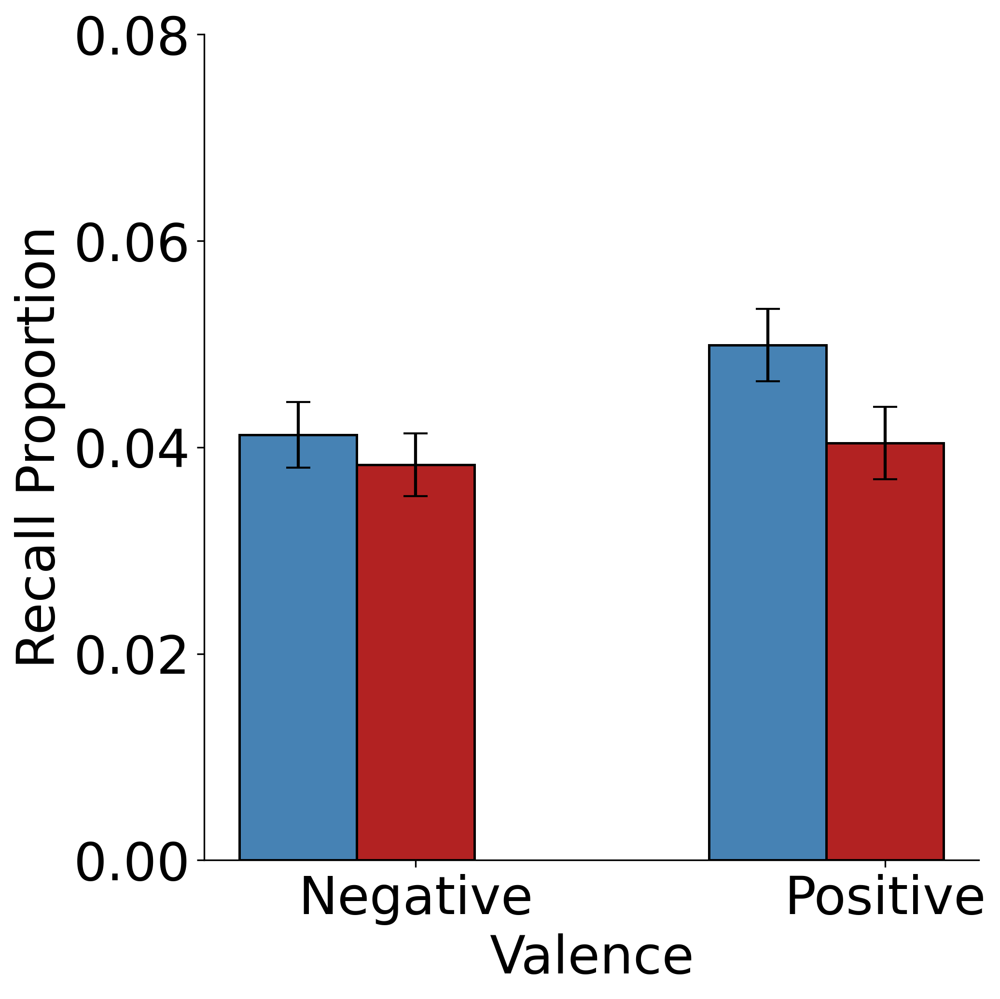

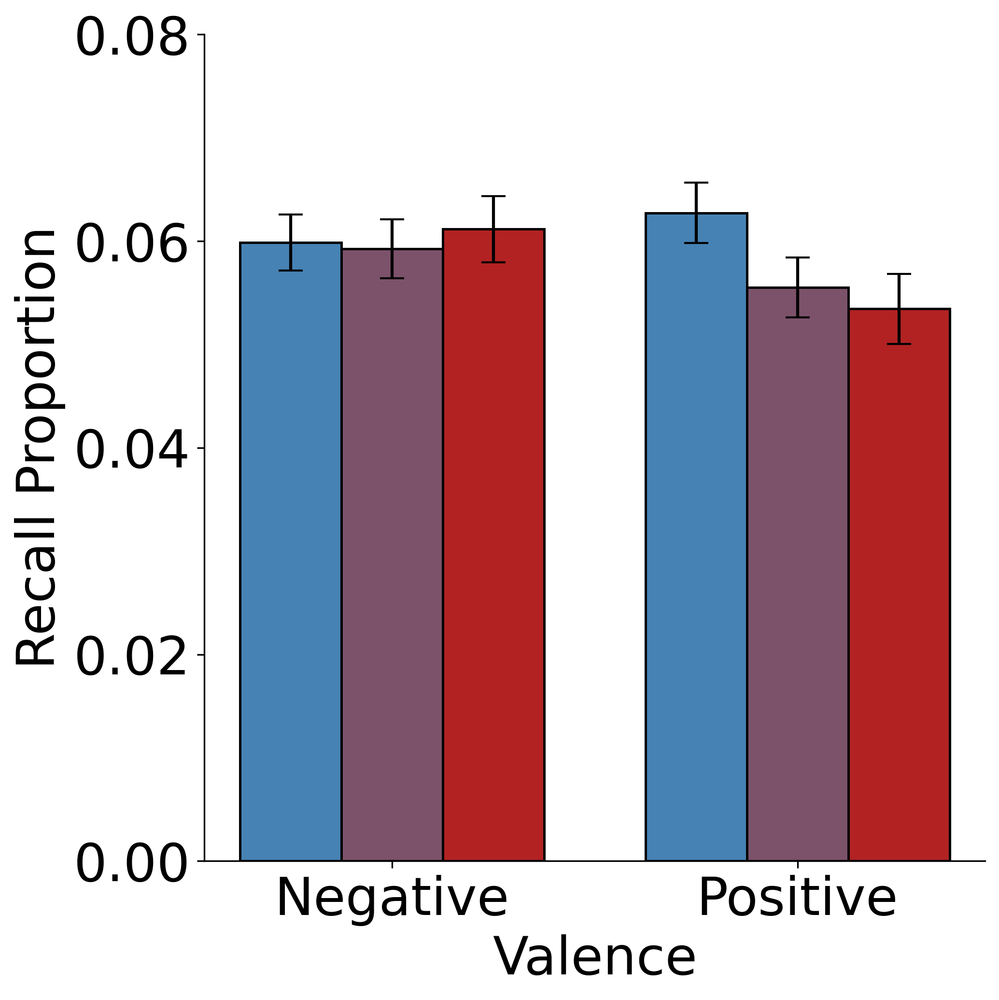

In [304]:
def plot_total_recall(recall_summary,study):

    if study == 'study_1':
        group_order = ["hc", "depressed"]
        colors = {"hc": "steelblue", "depressed": "firebrick"}
    
    elif study == 'study_2':
        group_order = ["low", "medium", "high"]
        colors = {
            "low": "steelblue",
            "medium": "#7C526B",
            "high": "firebrick"
        }

    # Ensure ordering
    valence_order = ["negative", "positive"]

    recall_summary["valence"] = pd.Categorical(recall_summary["valence"], categories=valence_order, ordered=True)
    recall_summary["group"] = pd.Categorical(recall_summary["group"], categories=group_order, ordered=True)

    # Prepare plot
    x = np.arange(len(valence_order))
    bar_width = 0.25

    fig, ax = plt.subplots(figsize=(7, 7), dpi=300)

    for i, grp in enumerate(group_order):
        grp_data = (
            recall_summary[recall_summary["group"] == grp]
            .set_index("valence")
            .loc[valence_order]
        )

        ax.bar(
            x + i * bar_width,
            grp_data["mean_recalled"],
            yerr=grp_data["se_recalled"],          # ← ADD THIS
            capsize=6,                             # ← ADD THIS
            width=bar_width,
            color=colors[grp],
            label=grp.capitalize(),
            edgecolor="black",
            linewidth=1.2
        )

    # Labels
    ax.set_xticks(x + bar_width)
    ax.set_xticklabels(["Negative", "Positive"], fontsize=26)
    ax.set_ylabel("Recall Proportion", fontsize=26)
    ax.set_xlabel("Valence", fontsize=26)
    ax.tick_params(axis="y", labelsize = 26)

    # Styling
    #ax.legend(frameon=False)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.set_ylim(0, 0.08)

    plt.tight_layout()
    plt.savefig(f"../plots/joint_recall_{study}",
            bbox_inches='tight', dpi=300)
    plt.show()

plot_total_recall(total_recall_study1,'study_1')
plot_total_recall(total_recall_study2,'study_2')


In [305]:
# Supplementary Plots 3b and 3c

def calc_joint_recall(recall_data):
    bins = [0, 20, 40, 60, 80, 100]
    labels = ["0–20", "20–40", "40–60", "60–80", "80–100"]

    recall_data["rat_bin"] = pd.cut(
        recall_data["response"],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    recall_summary = (
        recall_data
        .groupby(["subject", "group", "rat_bin", "valence"],observed = True,  dropna=False)
        ["recalled"]
        .mean()
        .reset_index(name="mean_recalled")
    )

    recall_summary2 = (
        recall_summary
        .groupby(["group", "rat_bin", "valence"], observed=True, dropna=False)
        .agg(
            mean_recalled=("mean_recalled", "mean"),
            se_recalled=("mean_recalled", "sem")
        )
        .reset_index()
    )

    bin_order = ["0–20", "20–40", "40–60", "60–80", "80–100"]

    recall_summary2["rat_bin"] = pd.Categorical(
        recall_summary2["rat_bin"],
        categories=bin_order,
        ordered=True
    )

    return recall_summary2

joint_recall_study1 = calc_joint_recall(recall_study1)
joint_recall_study2 = calc_joint_recall(recall_study2)


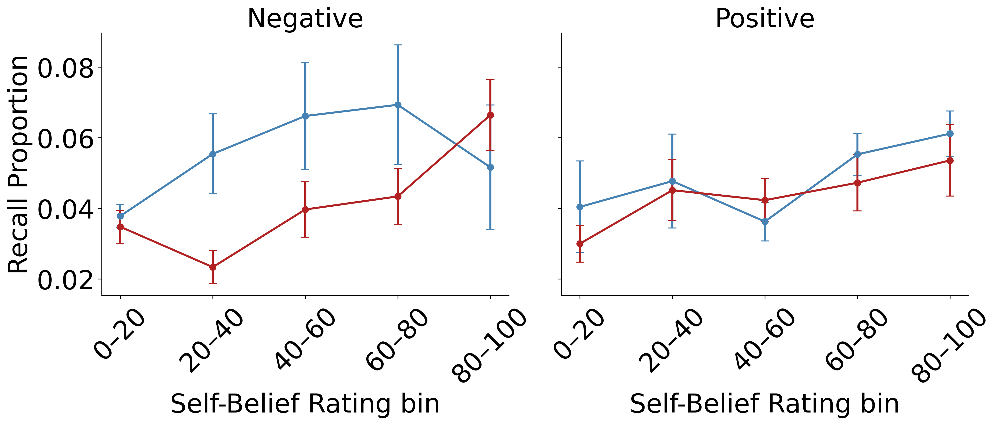

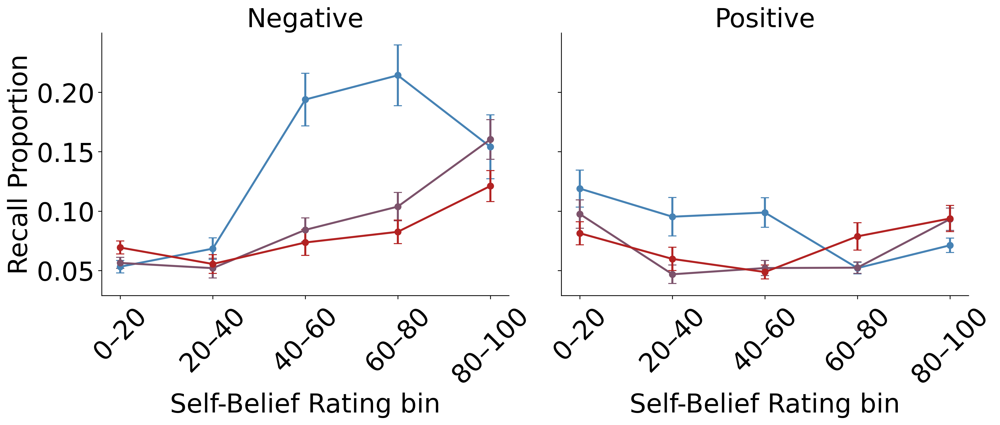

In [306]:
def plot_joint_recall(recall_summary2,study):

    if study == 'study_1':
        groups = ["hc", "depressed"]
        colors = {"hc": "steelblue", "depressed": "firebrick"}
    
    elif study == 'study_2':
        groups = ["low", "medium", "high"]
        colors = {
            "low": "steelblue",
            "medium": "#7C526B",
            "high": "firebrick"
        }

    # NEGATIVE FIRST
    valences = ["negative", "positive"]

    fig, axes = plt.subplots(
        1, 2, figsize=(14, 6), dpi=300, sharey=True
    )

    for ax, val in zip(axes, valences):
        df_val = recall_summary2[recall_summary2["valence"] == val]

        for grp in groups:
            df_grp = (
                df_val[df_val["group"] == grp]
                .sort_values("rat_bin")
            )

            ax.errorbar(
                df_grp["rat_bin"],
                df_grp["mean_recalled"],
                yerr=df_grp["se_recalled"],   # SEs
                marker="o",
                linewidth=2,
                capsize=4,
                color=colors[grp],
                label=grp
            )

        ax.set_title(val.capitalize(), fontsize=26)
        ax.set_xlabel("Self-Belief Rating bin", fontsize=26)
        ax.tick_params(axis="x", rotation=45, labelsize = 26)
        ax.tick_params(axis="y", labelsize = 26)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

    axes[0].set_ylabel("Recall Proportion", fontsize=26)

    plt.tight_layout()
    plt.savefig(
        f"../plots/joint_recall_{study}",
        bbox_inches="tight",
        dpi=300
    )
    plt.show()

plot_joint_recall(joint_recall_study1,'study_1')
plot_joint_recall(joint_recall_study2,'study_2')


In [307]:
# Supplementary Table 11 and Table 12

no_ratings_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/no_ratings_recall.nc')
with_ratings_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/with_ratings_recall.nc')

no_ratings_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/no_ratings_recall.nc')
with_ratings_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/with_ratings_recall.nc')

In [308]:
# Suppplementary Table 11

# Group 1 -> Depressed 

param_summary_df_study1 = az.summary(no_ratings_study1, var_names = ['Intercept',
 'valence',
 'C(group)',
 'valence:C(group)',
 'count_app'], hdi_prob=0.95)
print(param_summary_df_study1.head(10))

param_summary_df_study2 = az.summary(no_ratings_study2, var_names = ['Intercept',
 'valence',
 'phq_scale',
 'valence:phq_scale',
 'count_app'], hdi_prob=0.95)
print(param_summary_df_study2.head(10))



                                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
Intercept                       -2.964  0.088    -3.136     -2.791      0.001   
valence[positive]                0.199  0.074     0.054      0.344      0.001   
C(group)[1.0]                   -0.092  0.112    -0.310      0.132      0.001   
valence:C(group)[positive, 1.0] -0.150  0.107    -0.362      0.052      0.001   
count_app                       -0.646  0.069    -0.787     -0.516      0.001   

                                 mcse_sd  ess_bulk  ess_tail  r_hat  
Intercept                          0.001    9934.0   13347.0    1.0  
valence[positive]                  0.000   12947.0   13856.0    1.0  
C(group)[1.0]                      0.001    8708.0   12384.0    1.0  
valence:C(group)[positive, 1.0]    0.001   12780.0   14508.0    1.0  
count_app                          0.000    9636.0   12725.0    1.0  
                              mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
Intercept       

In [309]:
# Supplementary Table 12

# Group 1 -> Depressed 

param_summary_df2_study1 = az.summary(with_ratings_study1, var_names = ['Intercept',
 'valence',
 'C(group)',
  'r_scale',                                                              
 'valence:C(group)',
 'count_app'], hdi_prob=0.95)
print(param_summary_df2_study1.head(10))

param_summary_df2_study2 = az.summary(with_ratings_study2, var_names = ['Intercept',
 'valence',
 'phq_scale',
  'r_scale',                                                               
 'valence:phq_scale',
 'count_app'], hdi_prob=0.95)
print(param_summary_df2_study2.head(10))

                                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
Intercept                       -3.070  0.092    -3.250     -2.889      0.001   
valence[positive]               -0.092  0.088    -0.264      0.081      0.001   
C(group)[1.0]                   -0.238  0.116    -0.461     -0.006      0.001   
r_scale                          0.566  0.095     0.386      0.758      0.001   
valence:C(group)[positive, 1.0]  0.079  0.112    -0.145      0.298      0.001   
count_app                       -0.649  0.068    -0.782     -0.513      0.001   

                                 mcse_sd  ess_bulk  ess_tail  r_hat  
Intercept                          0.001    9937.0   13542.0    1.0  
valence[positive]                  0.001   10103.0   13436.0    1.0  
C(group)[1.0]                      0.001    7688.0   11029.0    1.0  
r_scale                            0.001   10630.0   14070.0    1.0  
valence:C(group)[positive, 1.0]    0.001   10660.0   13189.0    1.0  
count_app   

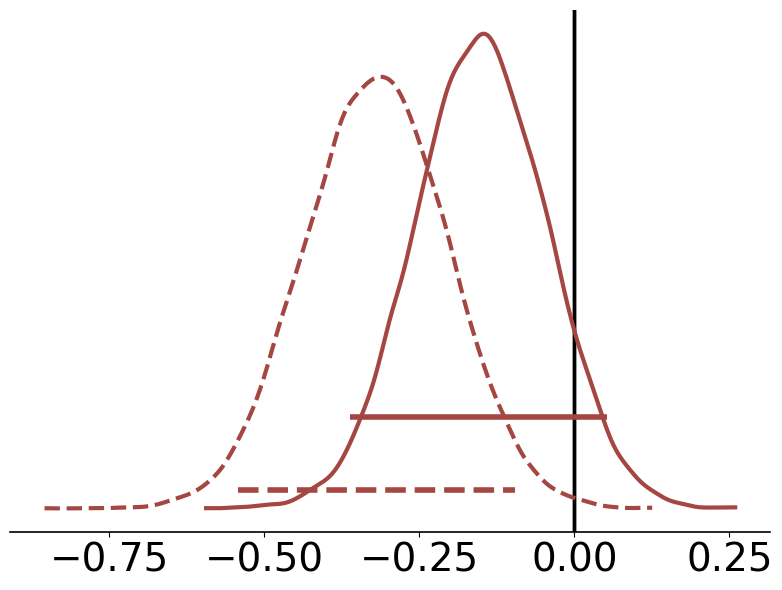

In [310]:
# Figure 7b - Posteriors from Model with no ratings regressor

# ---------- figure layout ----------
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

draw_posterior_clean(
    no_ratings_study1,
    "valence:C(group)",
    ax,
    interaction,
    alpha=1,
    mean_y_frac=0.55,
    hdi_y_frac=0.22,   # higher HDI
)

draw_posterior_clean(
    no_ratings_study2,
    "valence:phq_scale",
    ax,
    interaction,
    alpha=1,
    mean_y_frac=0.38,
    hdi_y_frac=0.08,   # lower HDI
    linestyle = '--'
)

for txt in ax.texts:
    txt.set_visible(False)

# ======================
# STYLING
# ======================
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_linewidth(1.2)

ax.tick_params(axis="x", labelsize=28)
ax.set_yticks([])

# ======================
# LEGEND
# ======================
legend_handles = [
    Patch(color=interaction, alpha=0.45, label="Study 1"),
    Patch(color=interaction, alpha=0.85, label="Study 2"),
]

#fig.legend(
#    handles=legend_handles,
#    fontsize=26,
#    frameon=False,
#    loc="upper center",
#    ncol=2,
#    bbox_to_anchor=(0.5, 1.15),
#)

plt.tight_layout()
plt.savefig(
    '../plots/no_ratings_recall_posteriors.png',
    dpi=300,
    bbox_inches="tight",
)
plt.show()


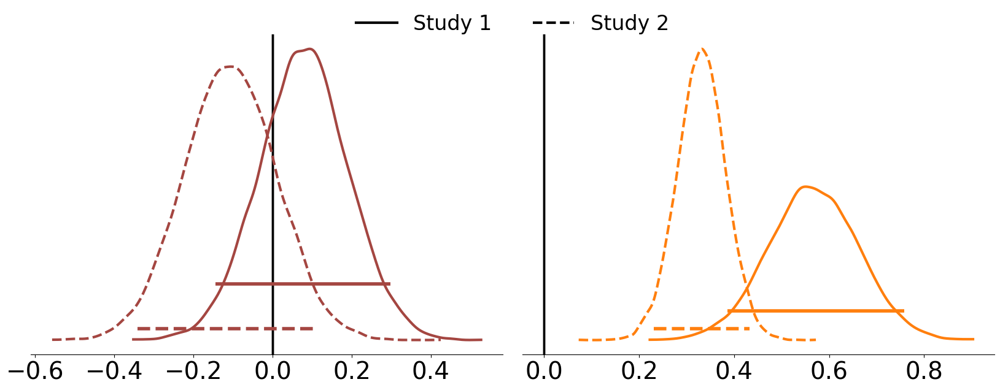

In [311]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D

# -------------------------------------------------------
# Variable label mapping
# -------------------------------------------------------
label_map = {
    "interaction": {
        "title": r'$\beta_{Valence\times Depression}$',
        "study1_var": "valence:C(group)",
        "study2_var": "valence:phq_scale",
        "color": interaction,
    },
    "r_scale": {
        "title": r'$\beta_{Self\text{-}Belief\ Ratings}$',
        "study1_var": "r_scale",
        "study2_var": "r_scale",
        "color": "#FF7F0E",
    },
}

rows = ["interaction", "r_scale"]

# -------------------------------------------------------
# FIGURE: 1 row × 2 columns
# -------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharex=False)

# -------------------------------------------------------
# LOOP
# -------------------------------------------------------
for row_idx, row in enumerate(rows):

    ax = axes[row_idx]
    cfg = label_map[row]

    # -----------------------
    # Study 1 → SOLID
    # -----------------------
    draw_posterior_clean(
        with_ratings_study1,
        cfg["study1_var"],
        ax,
        cfg["color"],
        alpha=1.0,
        hdi_y_frac=0.22,
        kde_linewidth = 3,
        linestyle="-"
    )

    # -----------------------
    # Study 2 → DASHED
    # -----------------------
    draw_posterior_clean(
        with_ratings_study2,
        cfg["study2_var"],
        ax,
        cfg["color"],
        alpha=1.0,
        hdi_y_frac=0.08,
        kde_linewidth = 3,
        linestyle="--"
    )

    # Remove leftover text
    for txt in ax.texts:
        txt.set_visible(False)

    # Styling
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.tick_params(axis="x", labelsize=28)
    ax.set_yticks([])

# -------------------------------------------------------
# LEGEND (line-based now, not patches)
# -------------------------------------------------------
legend_handles = [
    Line2D([0], [0], color="black", lw=3, linestyle="-", label="Study 1"),
    Line2D([0], [0], color="black", lw=3, linestyle="--", label="Study 2"),
]

fig.legend(
    handles=legend_handles,
    fontsize=24,
    frameon=False,
    loc="upper center",
    ncol=2,
    bbox_to_anchor=(0.5, 1.08),
)

# -------------------------------------------------------
# SAVE
# -------------------------------------------------------
plt.tight_layout()
plt.savefig(
    '../plots/with_ratings_recall_posteriors.png',
    dpi=300,
    bbox_inches="tight",
)
plt.show()

In [312]:
# Supplementary Plot 1 (Quantile Probablity Plots - See above)

In [313]:
# SP 2 (Predictions from the threshold model)

threshold_model_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/threshold_model.nc') 
threshold_model_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/threshold_model.nc') 

In [314]:
pos_neg2_study1 = extract_pos_neg(pair_df_study1)
pos_neg2_study2 = extract_pos_neg(pair_df_study2)

pos_neg2_study2 = pd.merge(pos_neg2_study2,phq_study2, on = ['subject','phq_score'], how = 'inner')
pos_neg2_study2['phq_scale'] = pos_neg2_study2['phq_score']/27

pos_neg2_hc_study1 = pos_neg2_study1[pos_neg2_study1['group']=='HC'].copy()
pos_neg2_dep_study1 = pos_neg2_study1[pos_neg2_study1['group']=='Depressed'].copy()

pos_neg2_low_study2 = pos_neg2_study2[pos_neg2_study2['group']=='low'].copy()
pos_neg2_medium_study2 = pos_neg2_study2[pos_neg2_study2['group']=='medium'].copy()
pos_neg2_high_study2 = pos_neg2_study2[pos_neg2_study2['group']=='high'].copy()

hc2_matched, dep2_matched, bin_edges = match_histogram_simple(pos_neg2_hc_study1, pos_neg2_dep_study1, bin_size=20, random_state=42)
high2_matched, medium2_matched, low2_matched, bin_edges = match_histogram_three_groups_simple(pos_neg2_high_study2,pos_neg2_medium_study2,pos_neg2_low_study2,bin_size=20,random_state=42)

study1_matched_alt = pd.concat([hc2_matched,dep2_matched],axis =0, ignore_index=True)
study2_matched_alt = pd.concat([high2_matched,medium2_matched,low2_matched],axis =0, ignore_index=True)

In [315]:
#  Subject Effects

# Calculating the random effects for v and a

def calc_sub_effects_alt_model(threshold_model,study):

    # r_diff_norm
    random_effects_v_r_diff_norm = threshold_model.posterior["v_r_diff_norm|subject"]
    subject_means_v_r_diff_norm = random_effects_v_r_diff_norm.mean(dim=["chain", "draw"])

    subject_means_v_r_diff_norm_df = subject_means_v_r_diff_norm.to_series().reset_index()
    subject_means_v_r_diff_norm_df.columns = ['subject', 're_v_r_diff_norm']

    # v intercept
    random_effects_v_intercept = threshold_model.posterior["v_1|subject"]
    subject_means_v_intercept = random_effects_v_intercept.mean(dim = ["chain","draw"])

    subject_means_v_intercept_df = subject_means_v_intercept.to_series().reset_index()
    subject_means_v_intercept_df.columns = ['subject', 're_v_intercept']

    # a intercept
    random_effects_a_intercept = threshold_model.posterior["a_1|subject"]
    subject_means_a_intercept = random_effects_a_intercept.mean(dim = ["chain","draw"])

    subject_means_a_intercept_df = subject_means_a_intercept.to_series().reset_index()
    subject_means_a_intercept_df.columns = ['subject', 're_a_intercept']

    # a delta_valence
    random_effects_a_delta_valence = threshold_model.posterior["a_delta_valence|subject"]
    subject_means_a_delta_valence = random_effects_a_delta_valence.mean(dim = ["chain","draw"])

    subject_means_a_delta_valence_df = subject_means_a_delta_valence.to_series().reset_index()
    subject_means_a_delta_valence_df.columns = ['subject', 're_a_delta_valence']

    random_effects_df = pd.merge(subject_means_v_intercept_df, subject_means_v_r_diff_norm_df, on='subject', how='inner')
    random_effects_df = pd.merge(random_effects_df,subject_means_a_delta_valence_df, on='subject', how='inner')
    random_effects_df = pd.merge(random_effects_df,subject_means_a_intercept_df, on='subject', how='inner')

    # Fixed Effects

    if study == 'study_1':
        fixed_effects_df = az.summary(threshold_model, var_names = ['t','z','a_Intercept','v_r_diff_norm',
                                              'a_delta_valence','v_Intercept',
                                              'a_Intercept',
                                              'a_delta_valence:group_int','a_group_int'])

        new_fixed_effects_df = fixed_effects_df['mean'].T.to_frame().T
        new_fixed_effects_df.columns = fixed_effects_df.index

    elif study == 'study_2':
        fixed_effects_df = az.summary(threshold_model, var_names = ['t','z','a_Intercept','v_r_diff_norm',
                                          'a_delta_valence','v_Intercept',
                                          'a_Intercept',
                                          'a_delta_valence:phq_scale','a_phq_scale'])

        new_fixed_effects_df = fixed_effects_df['mean'].T.to_frame().T
        new_fixed_effects_df.columns = fixed_effects_df.index
        

    # Subject Effects (Fixed + Random Effects)
    
    subject_effects_df = random_effects_df.copy()

    subject_effects_df['re_v_r_diff_norm'] = subject_effects_df['re_v_r_diff_norm'] + new_fixed_effects_df['v_r_diff_norm'].values[0]
    subject_effects_df['re_v_intercept'] = subject_effects_df['re_v_intercept'] + new_fixed_effects_df['v_Intercept'].values[0]
    subject_effects_df['re_a_intercept'] = subject_effects_df['re_a_intercept'] + new_fixed_effects_df['a_Intercept'].values[0]
    subject_effects_df['re_a_delta_valence'] = subject_effects_df['re_a_delta_valence'] + new_fixed_effects_df['a_delta_valence'].values[0]

    subject_effects_df['z'] = new_fixed_effects_df['z'].values[0]
    subject_effects_df['t'] = new_fixed_effects_df['t'].values[0]
    
    if study == 'study_1':
        subject_effects_df['a_group_int'] = new_fixed_effects_df['a_group_int'].values[0]
        subject_effects_df['a_delta_valence:group_int'] = new_fixed_effects_df['a_delta_valence:group_int'].values[0]


        subject_effects_df = subject_effects_df.rename(columns = {"re_v_r_diff_norm":"v_r_diff_norm",
                                                                 "re_a_delta_valence":"a_delta_valence", 
                                                                 "re_v_intercept":"v_intercept",
                                                                 "re_a_intercept":"a_intercept",                                                          
                                                                 "a_group_int":"a_group",
                                                                 "a_delta_valence:group_int":"a_delta_valence:group"})
    elif study == 'study_2':
        subject_effects_df['a_phq_scale'] = new_fixed_effects_df['a_phq_scale'].values[0]
        subject_effects_df['a_delta_valence:phq_scale'] = new_fixed_effects_df['a_delta_valence:phq_scale'].values[0]

        subject_effects_df = subject_effects_df.rename(columns = {"re_v_r_diff_norm":"v_r_diff_norm",
                                                                 "re_a_delta_valence":"a_delta_valence", 
                                                                 "re_v_intercept":"v_intercept",
                                                                 "re_a_intercept":"a_intercept",                                                          
                                                                 "a_phq_scale":"a_phq_scale",
                                                                 "a_delta_valence:phq_scale":"a_delta_valence:phq_scale"})

    using_nonanon_models = 1 # Set this to 0 if model was fit on the github data, which is anonymized.

    if using_nonanon_models == 1:
        if study == 'study_1':
            mapping = pd.read_csv("../../subject_mapping_study1.csv")
            id_map = dict(zip(mapping["original_subject"], mapping["anonymized_subject"]))
        elif study == 'study_2':
            mapping = pd.read_csv("../../subject_mapping_study2.csv")
            id_map = dict(zip(mapping["original_subject"], mapping["anonymized_subject"]))

        subject_effects_df["subject"] = subject_effects_df["subject"].map(id_map)

    return subject_effects_df
        

sub_effects_study1_alt = calc_sub_effects_alt_model(threshold_model_study1,'study_1')
sub_effects_study2_alt = calc_sub_effects_alt_model(threshold_model_study2,'study_2')



In [316]:
study1_alt = pd.merge(study1_matched_alt,sub_effects_study1_alt,on = 'subject', how = 'inner')
study2_alt = pd.merge(study2_matched_alt,sub_effects_study2_alt,on = 'subject', how = 'inner')


In [317]:
def gen_sim_pred_alt(pos_neg_df1, study):
    v_trial_wise = pos_neg_df1['v_intercept'] + pos_neg_df1['v_r_diff_norm']*pos_neg_df1['r_diff_norm'] 

    if study == 'study_1':
        a_trial_wise = (pos_neg_df1['a_intercept'] +
                    pos_neg_df1['a_delta_valence']*pos_neg_df1['delta_valence'] +
                    pos_neg_df1['a_group']*pos_neg_df1['group_int'] +
                    pos_neg_df1['a_delta_valence:group']*pos_neg_df1['delta_valence']*pos_neg_df1['group_int'])

    elif study == 'study_2':
        a_trial_wise = (pos_neg_df1['a_intercept'] +
                pos_neg_df1['a_delta_valence']*pos_neg_df1['delta_valence'] +
                pos_neg_df1['a_phq_scale']*pos_neg_df1['phq_scale'] +
                pos_neg_df1['a_delta_valence:phq_scale']*pos_neg_df1['delta_valence']*pos_neg_df1['phq_scale'])


    a_est = a_trial_wise.values
    z_est = pos_neg_df1["z"].values[0]
    t_est = pos_neg_df1["t"].values[0]
    v_est = v_trial_wise.values

    n_sims = 1000

    sim_data = hssm.simulate_data(
        model="ddm",
        theta=dict(
            v=v_est,
            a=a_est,
            z=z_est,
            t=t_est,
        ),
        size=n_sims,
    )

    sim_data['subject'] = np.tile(pos_neg_df1['subject'],n_sims)
    sim_data['sim_num'] = np.repeat(np.arange(1,n_sims+1),pos_neg_df1.shape[0])
    sim_data.rename(columns = {'rt':'pred_rt','response':'pred_response'},inplace=True)
    sim_data['r_diff_norm'] = np.tile(pos_neg_df1['r_diff_norm'],n_sims)
    sim_data['valence'] = np.tile(pos_neg_df1['valence'],n_sims)
    sim_data['valence_left'] = np.tile(pos_neg_df1['valence_left'],n_sims)
    sim_data['valence_right'] = np.tile(pos_neg_df1['valence_right'],n_sims)
    sim_data['rating_left'] = np.tile(pos_neg_df1['rating_left'],n_sims)
    sim_data['rating_right'] = np.tile(pos_neg_df1['rating_right'],n_sims)
    sim_data['delta_pos_rat'] = np.tile(pos_neg_df1['delta_pos_rat'],n_sims)
    sim_data['delta_pos_mod'] = np.tile(pos_neg_df1['delta_pos_mod'],n_sims)
    sim_data['delta_valence'] = np.tile(pos_neg_df1['delta_valence'],n_sims)
    sim_data['group'] = np.tile(pos_neg_df1['group'],n_sims)

    sim_data['pred_valence_chosen'] = np.where(sim_data['pred_response'] == 1,
                                    sim_data['valence_right'],
                                    sim_data['valence_left'])
    sim_data['pred_valence_chosen_int'] =  np.where(sim_data['pred_valence_chosen'] == 'positive', 1, 0)
    sim_data['pred_choice'] = np.where(sim_data['pred_response'] == -1, 0, 1)

    
    sim_pred1 = sim_data.groupby(['subject','group','delta_pos_mod','sim_num'], as_index=False, observed = True)['pred_valence_chosen_int'].mean()
    sim_pred2 = sim_pred1.groupby(['group','delta_pos_mod','sim_num'], as_index=False, observed = True)['pred_valence_chosen_int'].mean()

    sim_pred3 = (
        sim_pred2
          .groupby(['group','delta_pos_mod'], observed=True, as_index=False)['pred_valence_chosen_int']
          .agg(
            pred_mean = 'mean',
            lower_2_5=lambda x: x.quantile(0.025),
            upper_97_5=lambda x: x.quantile(0.975)
          )
    )

    return sim_pred3

pred_alt_study1 = gen_sim_pred_alt(study1_alt,'study_1')
pred_alt_study2 = gen_sim_pred_alt(study2_alt,'study_2')

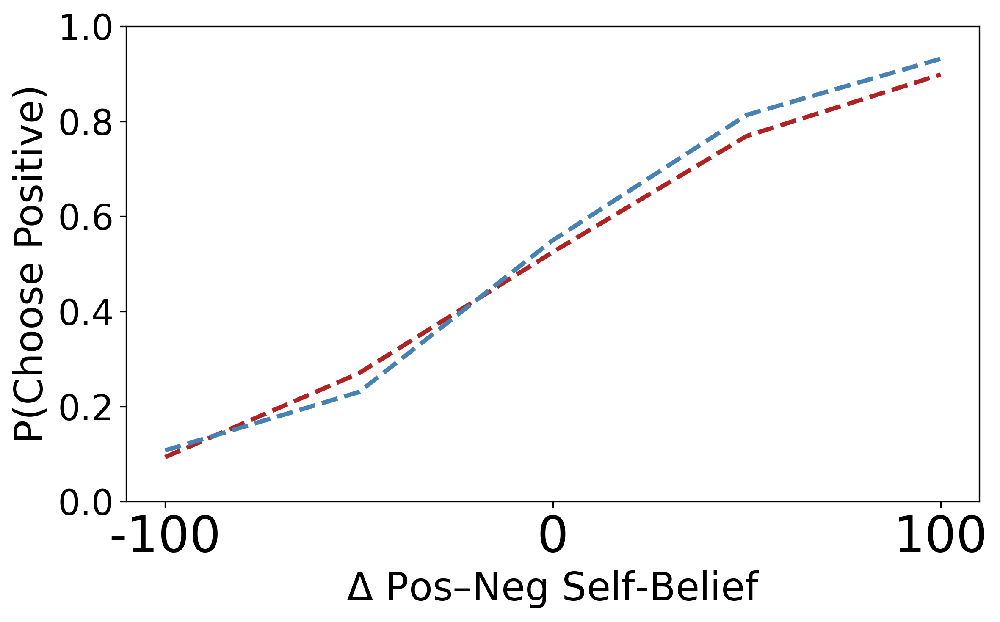

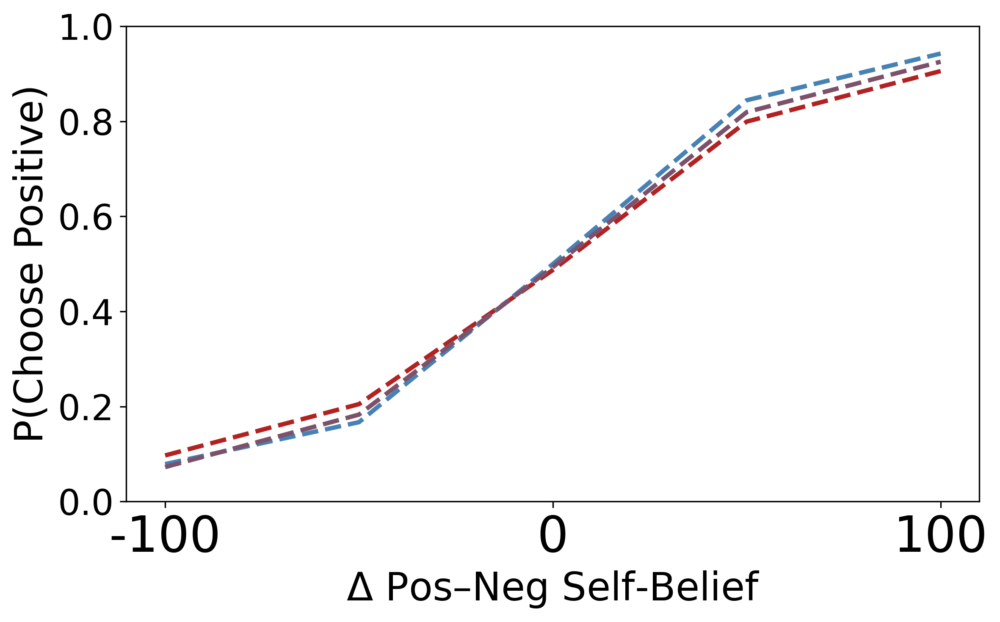

In [318]:
def plot_sim_pred_alt(sim_pred3,study):
    
    if study == 'study_1':
        colors = {"HC": "steelblue", "Depressed": "firebrick"}
    elif study == 'study_2':
        colors = {
            "low": "steelblue",
            "medium": "#7C526B",   # midpoint between steelblue & firebrick
            "high": "firebrick"
        }
    
    fig, ax = plt.subplots(1, 1, figsize=(8, 5), dpi=300)


    # ---- Predicted choice ----
    for g, sub in sim_pred3.groupby("group"):
        df = sub.copy()
        ax.plot(
            df["delta_pos_mod"],
            df["pred_mean"],
            color=colors[g],
            lw=2.5,
            ls="--"
        )

    ax.set_ylabel("P(Choose Positive)", fontsize=22)
    ax.set_xlabel(r"$\Delta$ Pos–Neg Self-Belief", fontsize=22)
    ax.tick_params(axis='both', labelsize=20)
    ax.set_ylim(0, 1)

    # X-axis formatting
    ax.set_xticks([-0.2, 0.0, 0.2])
    ax.set_xticklabels([-100, 0, 100], fontsize=28)

    plt.tight_layout()
    plt.savefig(
        f"../plots/threshold_model_pred{study}",
        dpi=300,
        bbox_inches='tight'
    )
    plt.show()

plot_sim_pred_alt(pred_alt_study1,'study_1')
plot_sim_pred_alt(pred_alt_study2,'study_2')


In [319]:
# SP 3 (Recall Plots, See above)

Percentage ≥ 2: 92.36%
Percentage ≥ 3: 76.08%


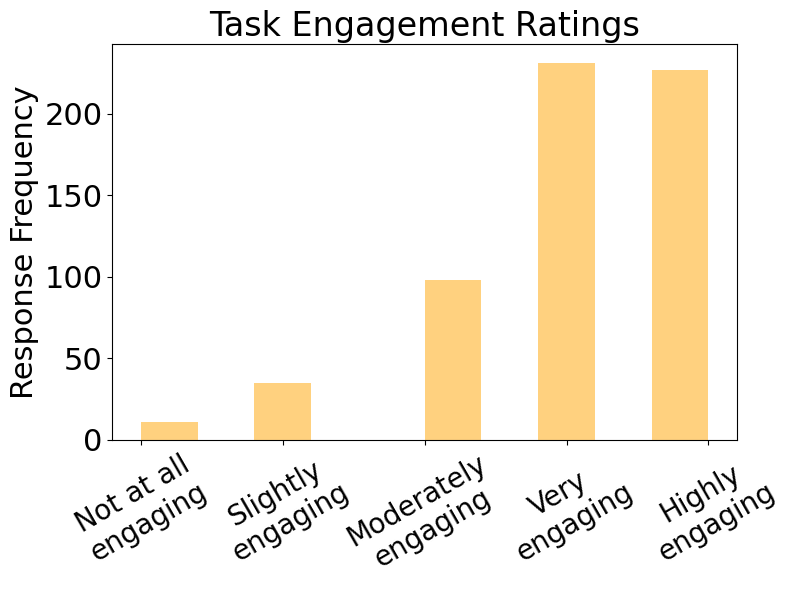

In [320]:
# SP 4 (Task Engagement Ratings) - STUDY 2 ONLY

engagement_df = pd.read_csv('../task_data/study_2/engagement.csv')
engagement_df['response_clean'] = engagement_df['response'].str.extract(r':(\d+)').astype(int)

total = len(engagement_df)

pct_ge_2 = (engagement_df["response_clean"] >= 2).sum() / total * 100
pct_ge_3 = (engagement_df["response_clean"] >= 3).sum() / total * 100

print(f"Percentage ≥ 2: {pct_ge_2:.2f}%")
print(f"Percentage ≥ 3: {pct_ge_3:.2f}%")

plt.figure(figsize=(8, 6))

plt.hist(
    engagement_df["response_clean"],
    alpha=0.5,
    density=False,
    color="orange"
)

# -------------------------
# Custom x-axis labels
# -------------------------
x_positions = [0, 1, 2, 3, 4]
x_labels = [
    "Not at all\nengaging",
    "Slightly\nengaging",
    "Moderately\nengaging",
    "Very\nengaging",
    "Highly\nengaging",
]

plt.xticks(
    x_positions,
    x_labels,
    fontsize=20,
    rotation=30,
    ha="center"
)

# -------------------------
# Axis labels
# -------------------------
#plt.xlabel("Engagement", fontsize=22)
plt.ylabel("Response Frequency", fontsize=22)

plt.yticks(fontsize=22)
plt.title("Task Engagement Ratings", fontsize = 24)

plt.tight_layout()
plt.savefig(
    "../plots/engagement_ratings_study2",
    bbox_inches="tight",
    pad_inches=0.02,
    dpi=300
)
plt.show()



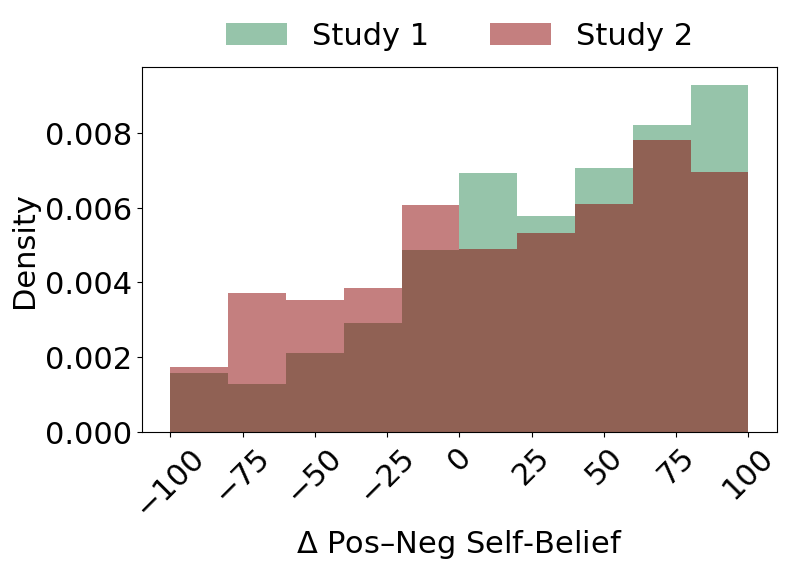

In [321]:
# SP 5 (Delta Pos-Neg Distribution)

pos_neg_study1.head()

plt.figure(figsize=(8,6))

plt.hist(pos_neg_study1['delta_pos_rat'], alpha=0.5,label = 'Study 1', density = True,color = '#2E8B57')
plt.hist(pos_neg_study2['delta_pos_rat'], alpha=0.5,label = 'Study 2', density = True,color = '#8B0000')

plt.xlabel(r'$\Delta$ Pos–Neg Self-Belief',fontsize=22)
plt.ylabel("Density",fontsize=22)
plt.title("",fontsize=22)
plt.legend(
    fontsize=22,
    frameon=False,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.2),
    ncol=2
)
plt.xticks(rotation=45,fontsize=22)
plt.yticks(fontsize=22)
plt.tight_layout()

plt.savefig(
     "../plots/study1_study2_distribution_overlap",
    bbox_inches='tight', dpi=300
)
plt.show()

In [322]:
# SP 6 (Recognition Analysis)

recog_study1 = pd.read_csv('../task_data/study_1/recog.csv')
recog_study2 = pd.read_csv('../task_data/study_2/recog.csv')


In [323]:
recog_study2['word_count'].value_counts()

word_count
0.0    24118
1.0    23834
Name: count, dtype: int64

In [324]:
recog_study2 = pd.merge(recog_study2,phq_study2, on = ['subject','phq_score'], how = 'inner')
recog_study2.head()

,Unnamed: 0,subject,true_answer,participant_response,phq_score,words_used,valence,word_count,correct,response_old,group,phq_z
0,0,study2_602,old,old,2,prick,negative,1.0,1,1,low,-1.275153
1,1,study2_602,old,old,2,repulsive,negative,1.0,1,1,low,-1.275153
2,2,study2_602,old,old,2,lifeless,negative,1.0,1,1,low,-1.275153
3,3,study2_602,old,old,2,appealing,positive,1.0,1,1,low,-1.275153
4,4,study2_602,new,new,2,unwelcome,negative,0.0,1,0,low,-1.275153


In [325]:
# Supplementary Table 27 (Recog Accuracy)

model_rec_study1 = Lmer(
    "correct ~ valence + group + (1| subject)",
    data=recog_study1,
    family="binomial"
)

result_study1 = model_rec_study1.fit()
print(result_study1)

model_rec_study2 = Lmer(
    "correct ~ valence + phq_z + (1| subject)",
    data=recog_study2,
    family="binomial"
)

result_study2 = model_rec_study2.fit()
print(result_study2)



Linear mixed model fit by maximum likelihood  ['lmerMod']
Formula: correct~valence+group+(1|subject)

Family: binomial	 Inference: parametric

Number of observations: 16332	 Groups: {'subject': 372.0}

Log-likelihood: -11198.281 	 AIC: 22404.561

Random effects:

                Name    Var    Std
subject  (Intercept)  0.001  0.036

No random effect correlations specified

Fixed effects:

                 Estimate  2.5_ci  97.5_ci     SE     OR  OR_2.5_ci  \
(Intercept)         0.370   0.316    0.423  0.027  1.447      1.372   
valencepositive    -0.342  -0.404   -0.280  0.032  0.710      0.668   
groupHC            -0.046  -0.108    0.016  0.032  0.955      0.897   

                 OR_97.5_ci   Prob  Prob_2.5_ci  Prob_97.5_ci  Z-stat  P-val  \
(Intercept)           1.527  0.591        0.578         0.604  13.480  0.000   
valencepositive       0.756  0.415        0.400         0.430 -10.838  0.000   
groupHC               1.016  0.488        0.473         0.504  -1.455  0.146   

  

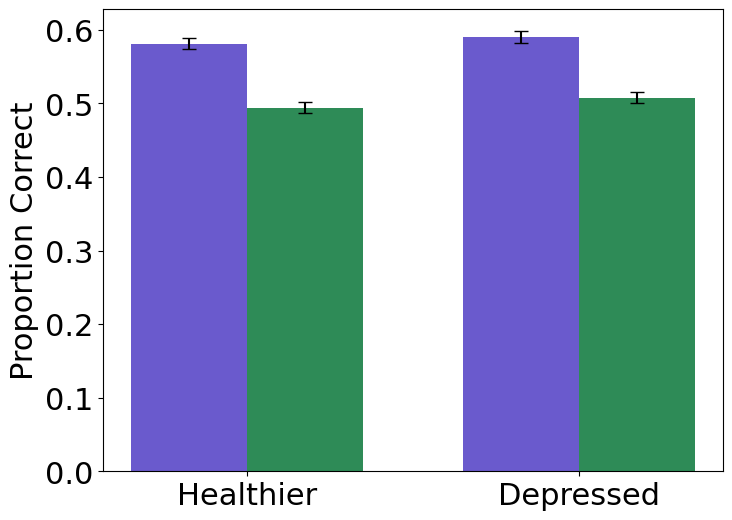

In [326]:
# Study 1

recog_summx = recog_study1.groupby(['subject','group','valence'],as_index=False, observed = True)['correct'].mean()
recog_summx2 = recog_summx.groupby(['group','valence'],as_index=False, observed = True).agg(mean=('correct', 'mean'),se=('correct', lambda x: x.std(ddof=1) / np.sqrt(len(x))))
recog_summx2.head()

# Copy and relabel HC
df_plot = recog_summx2.copy()
df_plot["group"] = df_plot["group"].replace({"HC": "Healthier"})

# Ensure correct group order
group_order = ["Healthier", "Depressed"]
valence_order = ["negative", "positive"]

df_plot["group"] = pd.Categorical(df_plot["group"], categories=group_order, ordered=True)
df_plot = df_plot.sort_values(["group", "valence"])

# Colors
pos_color = "#2E8B57"   # green
neg_color = "#6A5ACD"   # purple (your labeled light red)

# X positions
x = np.arange(len(group_order))
width = 0.35

# Extract means and SEs
neg = df_plot[df_plot["valence"] == "negative"]
pos = df_plot[df_plot["valence"] == "positive"]

neg_means = neg["mean"].values
neg_se = neg["se"].values

pos_means = pos["mean"].values
pos_se = pos["se"].values

# Plot
plt.figure(figsize=(8, 6))

plt.bar(x - width/2, neg_means, width,
        yerr=neg_se, capsize=5,
        label="Negative", color=neg_color)

plt.bar(x + width/2, pos_means, width,
        yerr=pos_se, capsize=5,
        label="Positive", color=pos_color)

plt.xticks(x, group_order, fontsize=22)
plt.yticks(fontsize = 22)
plt.ylabel("Proportion Correct", fontsize=22)
#plt.xlabel("Group", fontsize=22)
#plt.legend()

plt.savefig("../plots/study1_recog.png",
            bbox_inches='tight', dpi = 300)
plt.show()


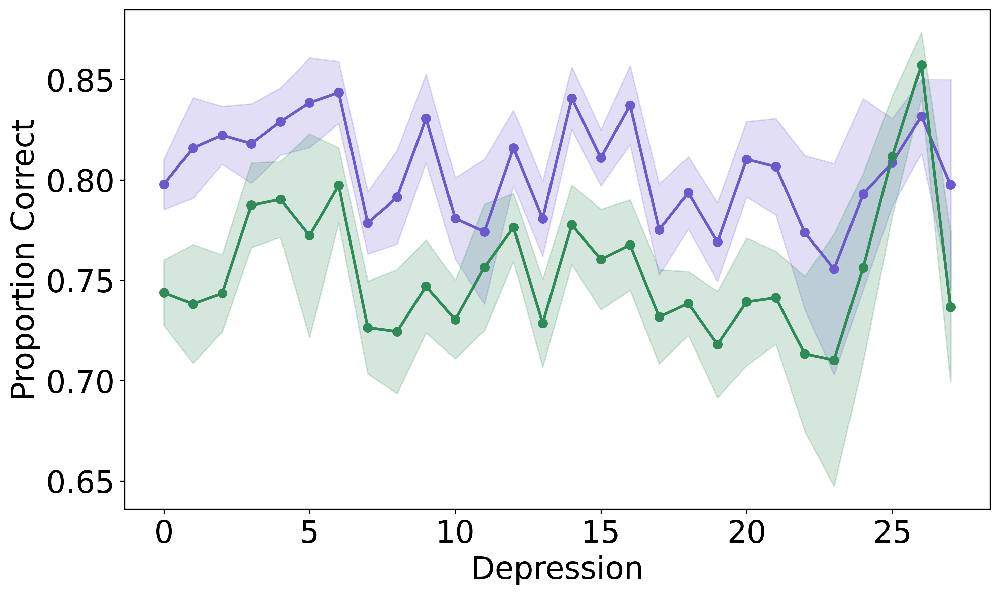

In [327]:
# Study 2

recog_summ = recog_study2.groupby(['subject','phq_score','valence'],as_index=False, observed = True)['correct'].mean()
recog_summ2 = recog_summ.groupby(['phq_score','valence'],as_index=False, observed = True).agg(mean=('correct', 'mean'),se=('correct', lambda x: x.std(ddof=1) / np.sqrt(len(x))))
recog_summ2.head()


# Color map for valence
val_colors = {"positive": "#2E8B57", "negative": "#6A5ACD"}

fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

for val, subdf in recog_summ2.groupby("valence"):
    x = subdf["phq_score"]
    y = subdf["mean"]
    se = subdf["se"]

    ax.plot(x, y, marker="o", linewidth=2, color=val_colors[val], label=val)
    ax.fill_between(x, y - se, y + se, alpha=0.2, color=val_colors[val])

ax.set_xlabel("Depression", fontsize=22)
ax.set_ylabel("Proportion Correct", fontsize=22)
#ax.set_title("Study 2", fontsize=18)
#ax.legend(title="Valence", fontsize=22, title_fontsize=22)

#ax.grid(axis="y", linestyle="--", alpha=0.3)
plt.xticks(rotation=0,fontsize=22)
plt.yticks(fontsize=22)
plt.tight_layout()
plt.savefig("../plots/study2_recog.png",
            bbox_inches='tight', dpi = 300)
plt.show()


In [328]:

recog_study1['word_old'] = np.where(recog_study1['true_answer']=='old',1,0)
recog_study2['word_old'] = np.where(recog_study2['true_answer']=='old',1,0)

EPS = 1e-5  # correction to prevent inf z-scores

def compute_sdt_by_valence(df):
    results = []

    # group by subject and valence (positive/negative)
    for (subj, val), sub_df in df.groupby(['subject', 'valence']):
        # --- counts ---
        hits = np.sum((sub_df['word_old'] == 1) & (sub_df['response_old'] == 1))
        misses = np.sum((sub_df['word_old'] == 1) & (sub_df['response_old'] == 0))
        fas = np.sum((sub_df['word_old'] == 0) & (sub_df['response_old'] == 1))
        crs = np.sum((sub_df['word_old'] == 0) & (sub_df['response_old'] == 0))

        # --- rates ---
        hit_rate = hits / (hits + misses) if (hits + misses) > 0 else np.nan
        fa_rate = fas / (fas + crs) if (fas + crs) > 0 else np.nan

        # --- clip to avoid 0/1 extremes ---
        hit_rate = np.clip(hit_rate, EPS, 1 - EPS)
        fa_rate = np.clip(fa_rate, EPS, 1 - EPS)

        # --- z-transform ---
        zH = norm.ppf(hit_rate)
        zF = norm.ppf(fa_rate)

        # --- compute d' and bias ---
        d_prime = zH - zF
        c = -0.5 * (zH + zF)

        results.append({
            'subject': subj,
            'valence': val,
            'hits': hits,
            'false_alarms': fas,
            'hit_rate': hit_rate,
            'fa_rate': fa_rate,
            'd_prime': d_prime,
            'bias_c': c
        })

    return pd.DataFrame(results)

sdt_valence_df_study1 = compute_sdt_by_valence(recog_study1)
sdt_valence_df_study2 = compute_sdt_by_valence(recog_study2)



In [329]:
def prep_sdt_regression(sdt_valence_df,phq_info):

    sdt_df2_valence = sdt_valence_df[['subject','valence','d_prime','bias_c']].copy()

    # Pivot to wide format
    sdt_wide = (
        sdt_valence_df
        .pivot(index='subject', columns='valence', values=['d_prime', 'bias_c'])
    )

    # Flatten the multi-index column names
    sdt_wide.columns = [f"{metric}_{val}" for metric, val in sdt_wide.columns]

    # Reset index to make 'subject' a column again
    sdt_wide = sdt_wide.reset_index()

    combo_df_valence = pd.merge(sdt_df2_valence,phq_info, on = 'subject', how = 'inner')

    return combo_df_valence

combo_df_valence_study1 = prep_sdt_regression(sdt_valence_df_study1,phq_study1)
combo_df_valence_study2 = prep_sdt_regression(sdt_valence_df_study2,phq_study2)



In [330]:
#  Supplementary Table 13 - Study 1

model_d_prime_study1 = Lmer("d_prime ~ group*valence + (1|subject)", data=combo_df_valence_study1)
results_d_prime_study1 = model_d_prime_study1.fit()
print(results_d_prime_study1)

Linear mixed model fit by REML [’lmerMod’]
Formula: d_prime~group*valence+(1|subject)

Family: gaussian	 Inference: parametric

Number of observations: 744	 Groups: {'subject': 372.0}

Log-likelihood: -1217.683 	 AIC: 2447.366

Random effects:

                 Name    Var    Std
subject   (Intercept)  0.090  0.299
Residual               1.442  1.201

No random effect correlations specified

Fixed effects:

                         Estimate  2.5_ci  97.5_ci     SE       DF  T-stat  \
(Intercept)                 0.818   0.642    0.994  0.090  737.478   9.111   
grouphc                     0.109  -0.143    0.361  0.128  737.478   0.849   
valencepositive            -0.685  -0.926   -0.443  0.123  370.000  -5.556   
grouphc:valencepositive    -0.302  -0.648    0.043  0.176  370.000  -1.716   

                         P-val  Sig  
(Intercept)              0.000  ***  
grouphc                  0.396       
valencepositive          0.000  ***  
grouphc:valencepositive  0.087    .  


In [331]:
#  Supplementary Table 13 - Study 2
model_d_prime_study2 = Lmer("d_prime ~ phq_z*valence + (1|subject)", data=combo_df_valence_study2)
results_d_prime_study2 = model_d_prime_study2.fit()
print(results_d_prime_study2)

Linear mixed model fit by REML [’lmerMod’]
Formula: d_prime~phq_z*valence+(1|subject)

Family: gaussian	 Inference: parametric

Number of observations: 1204	 Groups: {'subject': 602.0}

Log-likelihood: -2082.354 	 AIC: 4176.708

Random effects:

                 Name    Var    Std
subject   (Intercept)  0.971  0.985
Residual               1.112  1.055

No random effect correlations specified

Fixed effects:

                       Estimate  2.5_ci  97.5_ci     SE       DF  T-stat  \
(Intercept)               2.353   2.237    2.468  0.059  985.804  39.993   
phq_z                     0.058  -0.058    0.173  0.059  985.804   0.977   
valencepositive          -0.350  -0.469   -0.230  0.061  600.000  -5.751   
phq_z:valencepositive    -0.154  -0.273   -0.035  0.061  600.000  -2.534   

                       P-val  Sig  
(Intercept)            0.000  ***  
phq_z                  0.329       
valencepositive        0.000  ***  
phq_z:valencepositive  0.012    *  


In [332]:
# Supplementary Table 14 - Study 1

model_bias_study1= Lmer("bias_c ~ group*valence + (1|subject)", data=combo_df_valence_study1)
results_bias_study1 = model_bias_study1.fit()
print(results_bias_study1)


Linear mixed model fit by REML [’lmerMod’]
Formula: bias_c~group*valence+(1|subject)

Family: gaussian	 Inference: parametric

Number of observations: 744	 Groups: {'subject': 372.0}

Log-likelihood: -1033.813 	 AIC: 2079.626

Random effects:

                 Name    Var    Std
subject   (Intercept)  0.589  0.768
Residual               0.512  0.716

No random effect correlations specified

Fixed effects:

                         Estimate  2.5_ci  97.5_ci     SE       DF  T-stat  \
(Intercept)                 0.727   0.578    0.876  0.076  575.375   9.548   
grouphc                     0.282   0.068    0.495  0.109  575.375   2.588   
valencepositive            -0.267  -0.411   -0.123  0.073  370.000  -3.637   
grouphc:valencepositive    -0.158  -0.363    0.048  0.105  370.000  -1.502   

                         P-val  Sig  
(Intercept)              0.000  ***  
grouphc                  0.010   **  
valencepositive          0.000  ***  
grouphc:valencepositive  0.134       


In [333]:
# Supplementary Table 14 - Study 2

model_bias_study2= Lmer("bias_c ~ phq_z*valence + (1|subject)", data=combo_df_valence_study2)
results_bias_study2 = model_bias_study2.fit()
print(results_bias_study2)


Linear mixed model fit by REML [’lmerMod’]
Formula: bias_c~phq_z*valence+(1|subject)

Family: gaussian	 Inference: parametric

Number of observations: 1204	 Groups: {'subject': 602.0}

Log-likelihood: -1344.621 	 AIC: 2701.242

Random effects:

                 Name   Var    Std
subject   (Intercept)  0.24  0.490
Residual               0.35  0.591

No random effect correlations specified

Fixed effects:

                       Estimate  2.5_ci  97.5_ci     SE       DF  T-stat  \
(Intercept)              -0.193  -0.254   -0.132  0.031  1029.22  -6.163   
phq_z                    -0.116  -0.177   -0.054  0.031  1029.22  -3.696   
valencepositive          -0.280  -0.347   -0.213  0.034   600.00  -8.223   
phq_z:valencepositive     0.194   0.127    0.260  0.034   600.00   5.674   

                       P-val  Sig  
(Intercept)              0.0  ***  
phq_z                    0.0  ***  
valencepositive          0.0  ***  
phq_z:valencepositive    0.0  ***  


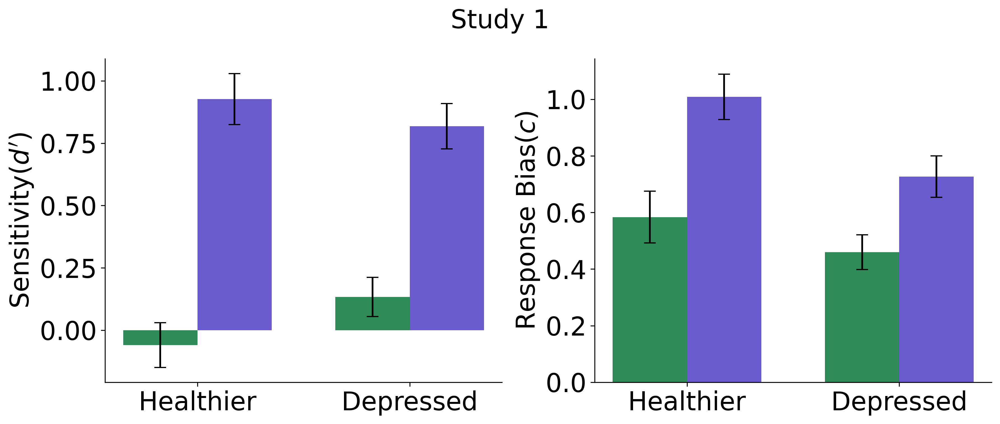

In [334]:
# Study 1

empirical_sens2 = (
    combo_df_valence_study1
    .groupby(["group", "valence"])
    .agg(
        mean_d_prime=("d_prime", "mean"),
        se_d_prime=("d_prime", lambda x: x.std(ddof=1) / np.sqrt(len(x)))
    )
    .reset_index()
)

empirical_bias2 = (
    combo_df_valence_study1
    .groupby(["group", "valence"])
    .agg(
        mean_bias_c=("bias_c", "mean"),
        se_bias_c=("bias_c", lambda x: x.std(ddof=1) / np.sqrt(len(x)))
    )
    .reset_index()
)


# -----------------------------
# Colors
# -----------------------------
pos_color = "#2E8B57"   # green
neg_color = "#6A5ACD"   # light red

groups = ["hc", "depressed"]
x = np.arange(len(groups))
width = 0.35

# -----------------------------
# Prepare d′ data
# -----------------------------
sens_pos = empirical_sens2.query("valence == 'positive'").set_index("group").loc[groups]
sens_neg = empirical_sens2.query("valence == 'negative'").set_index("group").loc[groups]

# -----------------------------
# Prepare bias (c) data
# -----------------------------
bias_pos = empirical_bias2.query("valence == 'positive'").set_index("group").loc[groups]
bias_neg = empirical_bias2.query("valence == 'negative'").set_index("group").loc[groups]

# -----------------------------
# Figure
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

# ==================================================
# Panel 1 — Sensitivity (d′)
# ==================================================
ax = axes[0]

ax.bar(
    x - width/2, sens_pos["mean_d_prime"],
    yerr=sens_pos["se_d_prime"],
    width=width, capsize=5,
    color=pos_color, label="Positive"
)

ax.bar(
    x + width/2, sens_neg["mean_d_prime"],
    yerr=sens_neg["se_d_prime"],
    width=width, capsize=5,
    color=neg_color, label="Negative"
)

ax.set_xticks(x)
ax.set_xticklabels(["Healthier", "Depressed"], fontsize=22)
ax.set_ylabel(r"Sensitivity($d^\prime$)", fontsize=22)
ax.set_title("", fontsize=20)

ax.tick_params(axis="y", labelsize=22)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# ==================================================
# Panel 2 — Bias (c)
# ==================================================
ax = axes[1]

ax.bar(
    x - width/2, bias_pos["mean_bias_c"],
    yerr=bias_pos["se_bias_c"],
    width=width, capsize=5,
    color=pos_color
)

ax.bar(
    x + width/2, bias_neg["mean_bias_c"],
    yerr=bias_neg["se_bias_c"],
    width=width, capsize=5,
    color=neg_color
)

ax.set_xticks(x)
ax.set_xticklabels(["Healthier", "Depressed"], fontsize=22)
ax.set_ylabel(r"Response Bias($c$)", fontsize=22)
ax.set_title("", fontsize=20)

ax.tick_params(axis="y", labelsize=22)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# -----------------------------
# Legend
# -----------------------------
#fig.legend(
#    ["Positive", "Negative"],
#    loc="upper center",
#    ncol=2,
#    frameon=False,
#    fontsize=22,
#    bbox_to_anchor=(0.5, 1.0)
#)

fig.suptitle("Study 1", fontsize=22, y=1.0)


plt.tight_layout()
fig.savefig("../plots/study1_sensi_bias.png",
            bbox_inches='tight', dpi = 300)
plt.show()


In [335]:
# Sensitivity empirical means
empirical_sens = (
    combo_df_valence_study2
    .groupby(["phq_score", "valence"], as_index=False)["d_prime"]
    .mean()
)

# Bias empirical means
empirical_bias = (
    combo_df_valence_study2
    .groupby(["phq_score", "valence"], as_index=False)["bias_c"]
    .mean()
)


levels = ['negative', 'positive']

phq_range = np.linspace(combo_df_valence_study2["phq_z"].min(),
                        combo_df_valence_study2["phq_z"].max(),
                        100)

n_rows = len(phq_range) * len(levels)

pred_df = pd.DataFrame({
    "phq_z": np.tile(phq_range, len(levels)),
    "valence":   np.repeat(levels, len(phq_range)),
    "subject":   np.repeat(combo_df_valence_study2["subject"].iloc[0], n_rows)
})

# Predictions for d'
pred_df["pred_sens"] = model_d_prime_study2.predict(
    pred_df, use_rfx=False, skip_data_checks=True, verify_predictions=False
)

# Predictions for bias
pred_df["pred_bias"] = model_bias_study2.predict(
    pred_df, use_rfx=False, skip_data_checks=True, verify_predictions=False
)

# Back-transform to raw PHQ
mean_phq = combo_df_valence_study2["phq_score"].mean()
sd_phq   = combo_df_valence_study2["phq_score"].std(ddof = 1)

pred_df["phq_score"] = pred_df["phq_z"] * sd_phq + mean_phq

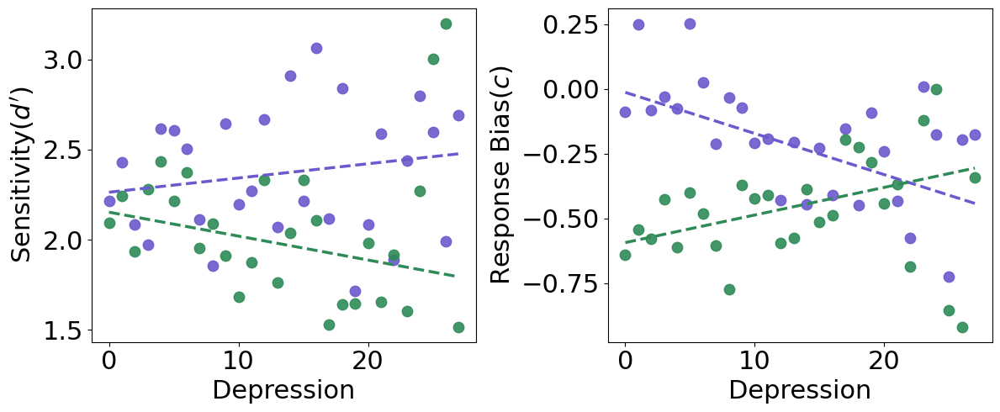

In [336]:




import matplotlib.pyplot as plt

# >>> ADD SUPTITLE <<<

color_map = {"positive": "#2E8B57", "negative": "#6A5ACD"}

label_map = {"positive": "Positive", "negative": "Negative"}

fig, axes = plt.subplots(1,2, figsize=(12, 5), sharex=True)

# -----------------------
# PLOT 1: Sensitivity (d′)
# -----------------------
ax = axes[0]

# empirical dots
for val in levels:
    sub_emp = empirical_sens[empirical_sens["valence"] == val]
    ax.scatter(sub_emp["phq_score"], sub_emp["d_prime"],
               color=color_map[val], s=80, alpha=0.9, label=label_map[val])

# predicted lines
for val in levels:
    sub_pred = pred_df[pred_df["valence"] == val]
    ax.plot(sub_pred["phq_score"], sub_pred["pred_sens"],
            linestyle="--", linewidth=2.5, color=color_map[val])

ax.set_title("", fontsize=22)
ax.set_ylabel(r"Sensitivity($d^\prime$)", fontsize=22)
#ax.legend(fontsize=22)
ax.set_xlabel("Depression", fontsize=22)
ax.tick_params(axis='both', labelsize=22)

# -----------------------
# PLOT 2: Bias (c)
# -----------------------
ax = axes[1]

# empirical dots
for val in levels:
    sub_emp = empirical_bias[empirical_bias["valence"] == val]
    ax.scatter(sub_emp["phq_score"], sub_emp["bias_c"],
               color=color_map[val], s=80, alpha=0.9, label=label_map[val])

# predicted lines
for val in levels:
    sub_pred = pred_df[pred_df["valence"] == val]
    ax.plot(sub_pred["phq_score"], sub_pred["pred_bias"],
            linestyle="--", linewidth=2.5, color=color_map[val])

#ax.set_title("", fontsize=22)
ax.set_ylabel(r"Response Bias($c$)", fontsize=22)
ax.set_xlabel("Depression", fontsize=22)
ax.tick_params(axis='both', labelsize=22)
#fig.suptitle("Study 2",
#             fontsize=22, y=0.98)
plt.tight_layout()
fig.savefig("../plots/study2_sensi_bias.png",
            bbox_inches='tight', dpi = 300)
plt.show()


In [337]:
# SP 7 (Questionnaires vs Task Measures) 

post_quest_study1 = pd.read_csv('../task_data/study_1/post_task_questionnaires.csv')
post_quest_study2 = pd.read_csv('../task_data/study_2/post_task_questionnaires.csv')



In [338]:
# Study 1
post_quest_study1['rrs_z_b_r'] = (post_quest_study1['b_plus_r'] - post_quest_study1['b_plus_r'].mean()) / post_quest_study1['b_plus_r'].std(ddof=1)
post_quest_study1['pswq_z'] = (post_quest_study1['pswq_total'] - post_quest_study1['pswq_total'].mean()) / post_quest_study1['pswq_total'].std(ddof=1)
post_quest_study1['ptq_z'] = (post_quest_study1['ptq_total'] - post_quest_study1['ptq_total'].mean()) / post_quest_study1['ptq_total'].std(ddof=1)
post_quest_study1['rrs_brood'] = (post_quest_study1['brooding'] - post_quest_study1['brooding'].mean()) / post_quest_study1['brooding'].std(ddof=1)

# Study 2
post_quest_study2['rrs_z_b_r'] = (post_quest_study2['b_plus_r'] - post_quest_study2['b_plus_r'].mean()) / post_quest_study2['b_plus_r'].std(ddof=1)
post_quest_study2['pswq_z'] = (post_quest_study2['pswq_total'] - post_quest_study2['pswq_total'].mean()) / post_quest_study2['pswq_total'].std(ddof=1)
post_quest_study2['ptq_z'] = (post_quest_study2['ptq_total'] - post_quest_study2['ptq_total'].mean()) / post_quest_study2['ptq_total'].std(ddof=1)
post_quest_study2['rse_z'] = (post_quest_study2['rse_total'] - post_quest_study2['rse_total'].mean()) / post_quest_study2['rse_total'].std(ddof=1)
post_quest_study2['rrs_brood'] = (post_quest_study2['brooding'] - post_quest_study2['brooding'].mean()) / post_quest_study2['brooding'].std(ddof=1)

In [339]:
subj_study1 = ratings_study1.groupby(["subject", "valence"], as_index=False, observed = True)["response"].mean()
subj_study1 = subj_study1.pivot(index=["subject"], columns="valence", values="response").reset_index()

subj_study2 = ratings_study2.groupby(["subject", "valence"], as_index=False, observed = True)["response"].mean()
subj_study2 = subj_study2.pivot(index=["subject"], columns="valence", values="response").reset_index()

combined_info_study1 = pd.merge(post_quest_study1,subj_study1, on = 'subject', how = 'inner')
combined_info_study2 = pd.merge(post_quest_study2,subj_study2, on = 'subject', how = 'inner')


In [340]:
sub_effects_study1 = calc_sub_effects(drift_full_model_study1,'study_1')
sub_effects_study2 = calc_sub_effects(drift_full_model_study2,'study_2')

delta_v_study1 = sub_effects_study1[['subject','v_delta_valence']].copy()
delta_v_study2 = sub_effects_study2[['subject','v_delta_valence']].copy()

combined_info_study1 = pd.merge(combined_info_study1,delta_v_study1, on = 'subject', how = 'inner')
combined_info_study2 = pd.merge(combined_info_study2,delta_v_study2, on = 'subject', how = 'inner')

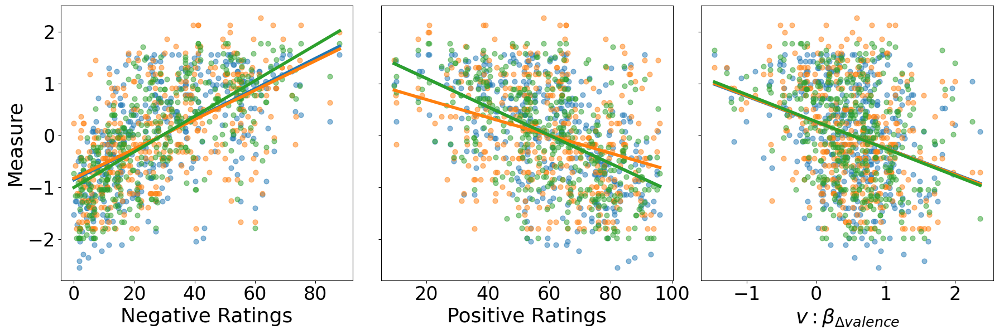

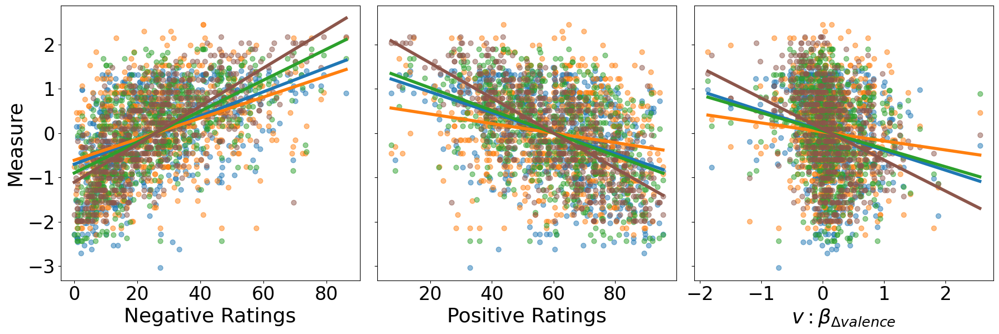

In [341]:
def plot_quest_task(combined_info,study):

    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

    x_vars = [
        ("negative", "Negative Ratings"),
        ("positive", "Positive Ratings"),
        ("v_delta_valence", r"$v: \beta_{\Delta valence}$")
    ]

    if study == 'study_2':
        colors = {
            "PSWQ": "tab:blue",
            "RRS": "tab:orange",
            "PTQ": "tab:green",
            "RSE": "tab:brown"
        }

        y_vars = {
            "PSWQ": combined_info["pswq_z"],
            "RRS": combined_info["rrs_z_b_r"],
            "PTQ": combined_info["ptq_z"],
            "RSE": combined_info["rse_z"],
        }

    elif study == 'study_1':
        colors = {
            "PSWQ": "tab:blue",
            "RRS": "tab:orange",
            "PTQ": "tab:green",
        }

        y_vars = {
            "PSWQ": combined_info["pswq_z"],
            "RRS": combined_info["rrs_z_b_r"],
            "PTQ": combined_info["ptq_z"]
        }


    for ax, (x_col, x_label) in zip(axes, x_vars):

        x = combined_info[x_col]

        for label, y in y_vars.items():
            # Scatter
            ax.scatter(
                x, y,
                color=colors[label],
                alpha=0.5,
                s=40,
                label=label
            )

            # Regression line (NaN-safe)
            mask = ~np.isnan(x) & ~np.isnan(y)
            m, b = np.polyfit(x[mask], y[mask], 1)

            x_grid = np.linspace(x[mask].min(), x[mask].max(), 200)
            ax.plot(
                x_grid,
                m * x_grid + b,
                color=colors[label],
                linewidth=4
            )

        ax.set_xlabel(x_label, fontsize=26)
        ax.tick_params(axis="x", labelsize=24)
        ax.tick_params(axis="y", labelsize=24)


    axes[0].set_ylabel("Measure", fontsize=26)


    handles, labels = axes[0].get_legend_handles_labels()

    plt.tight_layout()
    plt.subplots_adjust(top=0.99)
    plt.savefig(f"../plots/quest_task_plots{study}", bbox_inches='tight',dpi = 300)
    plt.show()

plot_quest_task(combined_info_study1,'study_1')
plot_quest_task(combined_info_study2,'study_2')


In [342]:
def calc_cor(combined_info,study):

    if study == 'study_1':
        v1 = ["rrs_z_b_r", "pswq_z", "ptq_z"]
    elif study == 'study_2':
        v1 = ["rrs_z_b_r", "pswq_z", "ptq_z","rse_z"]

    
    v2 = ["negative", "positive", "v_delta_valence"]

    results = []

    for var1 in v1:
        for var2 in v2:
        
            df_temp = combined_info[[var1, var2]].dropna()
        
            r, p = pearsonr(df_temp[var1], df_temp[var2])
        
            results.append({
                "v1": var1,
                "v2": var2,
                "r": r,
                "p_value": p
            })

    corr_results = pd.DataFrame(results)
    return corr_results

corr_results_study1 = calc_cor(combined_info_study1,'study_1')
corr_results_study2 = calc_cor(combined_info_study2,'study_2')

print(corr_results_study1)
print(corr_results_study2)

          v1               v2         r       p_value
0  rrs_z_b_r         negative  0.560246  3.991830e-32
1  rrs_z_b_r         positive -0.325043  1.333114e-10
2  rrs_z_b_r  v_delta_valence -0.298120  4.505783e-09
3     pswq_z         negative  0.578527  1.293900e-34
4     pswq_z         positive -0.516161  1.021230e-26
5     pswq_z  v_delta_valence -0.294093  7.403097e-09
6      ptq_z         negative  0.678425  1.733036e-51
7      ptq_z         positive -0.515852  1.107447e-26
8      ptq_z  v_delta_valence -0.307220  1.426273e-09
           v1               v2         r        p_value
0   rrs_z_b_r         negative  0.403391   5.805837e-25
1   rrs_z_b_r         positive -0.191800   2.134571e-06
2   rrs_z_b_r  v_delta_valence -0.095200   1.947782e-02
3      pswq_z         negative  0.462575   2.990379e-33
4      pswq_z         positive -0.413954   2.525679e-26
5      pswq_z  v_delta_valence -0.209374   2.171416e-07
6       ptq_z         negative  0.593180   1.731400e-58
7       ptq_

In [343]:
# Supplementary Table 15 (Clinical Characteristics)

# Please contact researchers for access to the demographics information needed to run this analysis.

study1_table = pd.read_csv('../../demo_data/study_1/demographic_info_study1.csv')
study2_table = pd.read_csv('../../demo_data/study_2/demographic_info_study2.csv')

study1_table['study'] = 'study1'
study2_table['study'] = 'study2'

mapping_study1 = pd.read_csv("../../subject_mapping_study1.csv")
mapping_study2 = pd.read_csv("../../subject_mapping_study2.csv")

id_map_study1 = dict(zip(mapping_study1["original_subject"], mapping_study1["anonymized_subject"]))
id_map_study2 = dict(zip(mapping_study2["original_subject"], mapping_study2["anonymized_subject"]))

study1_table["subject"] = study1_table["subject"].map(id_map_study1)
study2_table["subject"] = study2_table["subject"].map(id_map_study2)

study_combo = pd.concat([study1_table,study2_table],axis=0, ignore_index=True)


In [344]:
quest_study1 = pd.merge(post_quest_study1,phq_study1,on = 'subject',how = 'inner')
quest_study2 = pd.merge(post_quest_study2,phq_study2,on = 'subject',how = 'inner')

quest_combo = pd.concat([quest_study1,quest_study2],axis=0, ignore_index=True)

df_combo = pd.merge(study_combo,quest_combo,on = 'subject',how = 'inner')


In [345]:
def demographic_summary(df):
    n = len(df)

    # ---- Sex ----
    n_female = (df["Sex"] == "Female").sum()
    pct_female = 100 * n_female / n if n > 0 else np.nan

    # ---- Age ----
    age = pd.to_numeric(df["Age"], errors="coerce")
    mean_age = age.mean()
    sd_age   = age.std(ddof=1)

    # ---- Questionnaires (coerce to numeric safely) ----
    phq  = pd.to_numeric(df["phq_score"], errors="coerce")
    pswq = pd.to_numeric(df["pswq_total"], errors="coerce")
    rrs_sf  = pd.to_numeric(df["b_plus_r"], errors="coerce")
    ptq  = pd.to_numeric(df["ptq_total"], errors="coerce")
    rse  = pd.to_numeric(df["rse_total"], errors="coerce")

    # ---- Ethnicity ----
    n_white = (df["Ethnicity simplified"] == "White").sum()
    pct_white = 100 * n_white / n if n > 0 else np.nan

    return pd.Series({
        "N": n,
        "N Female": n_female,
        "% Female": pct_female,
        "Mean Age": mean_age,
        "SD Age": sd_age,
        "Mean PHQ": phq.mean(),
        "SD PHQ": phq.std(ddof=1),
        "Median PHQ": phq.median(),
        "Mean PSWQ": pswq.mean(),
        "SD PSWQ": pswq.std(ddof=1),
        "Mean PTQ": ptq.mean(),
        "SD PTQ": ptq.std(ddof=1),
        "Mean RRS-SF": rrs_sf.mean(),
        "SD RRS-SF": rrs_sf.std(ddof=1),
        "Mean RSE": rse.mean(),
        "SD RSE": rse.std(ddof=1),
        "N White": n_white,
        "% White": pct_white
    })

# ---- By study ----
by_study = (
    df_combo
    .groupby("study", dropna=False)
    .apply(demographic_summary)
    .reset_index()
)

# ---- Overall ----
overall = demographic_summary(df_combo).to_frame().T
overall.insert(0, "study", "overall")

print(by_study.head())
print(overall.head())

    study      N  N Female   % Female   Mean Age     SD Age   Mean PHQ  \
0  study1  372.0     210.0  56.451613  37.768817  12.577964  11.478495   
1  study2  602.0     328.0  54.485050  39.293132  10.946614  11.297342   

     SD PHQ  Median PHQ  Mean PSWQ    SD PSWQ   Mean PTQ     SD PTQ  \
0  8.113552        15.0  55.784946  15.569754  31.690860  16.001638   
1  7.291161        11.5  56.277409  11.943898  33.722591  13.860769   

   Mean RRS-SF  SD RRS-SF  Mean RSE    SD RSE  N White    % White  
0    23.290323   7.378603       NaN       NaN    256.0  68.817204  
1    23.996678   6.544865  24.27907  7.236338    395.0  65.614618  
     study      N  N Female  % Female   Mean Age     SD Age  Mean PHQ  \
0  overall  974.0     538.0  55.23614  38.707946  11.617365  11.36653   

     SD PHQ  Median PHQ  Mean PSWQ    SD PSWQ   Mean PTQ     SD PTQ  \
0  7.612139        12.0  56.089322  13.438958  32.946612  14.740274   

   Mean RRS-SF  SD RRS-SF  Mean RSE    SD RSE  N White    % White  
0

/var/folders/yw/fxfmykwn21b0gt7m32cv_ymw0000gq/T/ipykernel_41199/3485739738.py:49: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(demographic_summary)


In [346]:
# Supplementary Table 16 (Correlational Matrix - Study 1)

post_quest_study1 = post_quest_study1[['subject','b_plus_r','pswq_total','ptq_total']]
phq_study1 = phq_study1[['subject','phq_score']].copy()

########### Choose Positive  Proportion
pos_neg_temp_study1 = pos_neg_study1[['subject','valence','valence_chosen_int']].copy()
pos_neg_temp2_study1 = pos_neg_temp_study1.groupby('subject', as_index=False)['valence_chosen_int'].mean()

########### RT valence regressor
# FE
summary1 = az.summary(rt_study1_valence, hdi_prob=0.95)
mean_pos_neg_lin = summary1.loc["pos_neg_lin", "mean"]

# RE
rt_val_study1 = extract_random_slope(rt_study1_valence, "pos_neg_lin|subject")
rt_val_study1 = rt_val_study1.rename(columns = {'subject__factor_dim':'subject','pos_neg_lin|subject':'rt_val'})

# Subject effects = fixed effects + Random Effects
rt_val_study1['rt_val'] = rt_val_study1['rt_val'] + mean_pos_neg_lin
rt_val_study1.head()

rt_val_study1["subject"] = rt_val_study1["subject"].map(id_map_study1) # Optional -> Comment if your model was fit on github data

############ Combine everything

overall_df_study1 = pd.merge(post_quest_study1, phq_study1, on = 'subject', how = 'inner')
overall_df_study1 = pd.merge(overall_df_study1, pos_neg_temp2_study1, on = 'subject', how = 'inner')
overall_df_study1 = pd.merge(overall_df_study1, rt_val_study1, on = 'subject', how = 'inner')
overall_df_study1 = pd.merge(overall_df_study1, delta_v_study1, on = 'subject', how = 'inner')
overall_df_study1 = pd.merge(overall_df_study1, subj_study1, on = 'subject', how = 'inner')

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Rename columns
overall_df2 = overall_df_study1.rename(columns={
    'b_plus_r':'RRS-SF',
    'pswq_total':'PSWQ',
    'ptq_total':'PTQ',
    'phq_score':'PHQ',
    'valence_chosen_int':'Proportion<br>Positive',
    'rt_val': r'$RT:\beta_{\text{valence}}$',
    'v_delta_valence': r'$v:\beta_{\Delta \text{valence}}$',
    'negative':'Negative<br>Rating',
    'positive':'Positive<br>Rating',
})

# Drop non-numeric
numeric_df = overall_df2.drop(columns=["subject"])

# Initialize correlation and p-value matrices
cols = numeric_df.columns
n = len(cols)

corr = pd.DataFrame(np.zeros((n,n)), columns=cols, index=cols)
pvals = corr.copy()

# Compute correlations + p-values
for i in range(n):
    for j in range(n):
        r, p = stats.pearsonr(numeric_df.iloc[:, i], numeric_df.iloc[:, j])
        corr.iloc[i, j] = r
        pvals.iloc[i, j] = p

# Function to add stars
def star_format(r, p):
    if p < .001:
        return f"{r:.3f}***"
    elif p < .01:
        return f"{r:.3f}**"
    elif p < .05:
        return f"{r:.3f}*"
    else:
        return f"{r:.3f}"

# Create formatted table
formatted = corr.copy()

for i in range(n):
    for j in range(n):
        formatted.iloc[i, j] = star_format(corr.iloc[i, j], pvals.iloc[i, j])

# Keep lower triangle only
mask = np.triu(np.ones_like(formatted, dtype=bool), k=1)
formatted = formatted.mask(mask)
formatted = formatted.fillna("")

# Style table
styled_table = (
    formatted.style
    .set_table_styles([
        {'selector': 'th',
         'props': [('font-weight', 'normal'),
                   ('text-align', 'center'),
                   ('border', 'none')]},
        {'selector': 'td',
         'props': [('text-align', 'center'),
                   ('border', 'none')]},
        {'selector': 'th:first-child, td:first-child',
         'props': [('border-left', '1.5px solid black')]},
        {'selector': 'th:last-child, td:last-child',
         'props': [('border-right', '1.5px solid black')]},
        {'selector': 'thead th',
         'props': [('border-top', '1.5px solid black'),
                   ('border-bottom', '1.5px solid black')]},
        {'selector': 'tbody tr',
         'props': [('border-bottom', '1.5px solid black')]},
        {'selector': 'tbody tr:nth-child(odd)',
         'props': [('background-color', 'white')]},
        {'selector': 'tbody tr:nth-child(even)',
         'props': [('background-color', 'white')]},
    ])
)

styled_table


,RRS-SF,PSWQ,PTQ,PHQ,ProportionPositive,$RT:\beta_{\text{valence}}$,$v:\beta_{\Delta \text{valence}}$,NegativeRating,PositiveRating
RRS-SF,1.000***,,,,,,,,
PSWQ,0.638***,1.000***,,,,,,,
PTQ,0.774***,0.765***,1.000***,,,,,,
PHQ,0.690***,0.645***,0.784***,1.000***,,,,,
ProportionPositive,-0.397***,-0.464***,-0.487***,-0.534***,1.000***,,,,
$RT:\beta_{\text{valence}}$,0.175***,0.108*,0.156**,0.192***,-0.290***,1.000***,,,
$v:\beta_{\Delta \text{valence}}$,-0.298***,-0.294***,-0.307***,-0.326***,0.732***,-0.170***,1.000***,,
NegativeRating,0.560***,0.579***,0.678***,0.693***,-0.718***,0.270***,-0.402***,1.000***,
PositiveRating,-0.325***,-0.516***,-0.516***,-0.539***,0.714***,-0.154**,0.402***,-0.715***,1.000***


In [347]:
# Supplementary Table 17 (Correlational Matrix -  Study 2)

post_quest_study2 = post_quest_study2[['subject','b_plus_r','pswq_total','ptq_total','rse_total']]
phq_study2 = phq_study2[['subject','phq_score']].copy()

########### Choose Positive  Proportion
pos_neg_temp_study2 = pos_neg_study2[['subject','valence','valence_chosen_int']].copy()
pos_neg_temp2_study2 = pos_neg_temp_study2.groupby('subject', as_index=False)['valence_chosen_int'].mean()

########### RT valence regressor
# FE
summary1 = az.summary(rt_study2_valence, hdi_prob=0.95)
mean_pos_neg_lin = summary1.loc["pos_neg_lin", "mean"]

# RE
rt_val_study2 = extract_random_slope(rt_study2_valence, "pos_neg_lin|subject")
rt_val_study2 = rt_val_study2.rename(columns = {'subject__factor_dim':'subject','pos_neg_lin|subject':'rt_val'})

# Subject effects = fixed effects + Random Effects
rt_val_study2['rt_val'] = rt_val_study2['rt_val'] + mean_pos_neg_lin
rt_val_study2.head()

rt_val_study2["subject"] = rt_val_study2["subject"].map(id_map_study2) # Optional -> Comment if your model was fit on github data

############ Combine everything

overall_df_study2 = pd.merge(post_quest_study2, phq_study2, on = 'subject', how = 'inner')
overall_df_study2 = pd.merge(overall_df_study2, pos_neg_temp2_study2, on = 'subject', how = 'inner')
overall_df_study2 = pd.merge(overall_df_study2, rt_val_study2, on = 'subject', how = 'inner')
overall_df_study2 = pd.merge(overall_df_study2, delta_v_study2, on = 'subject', how = 'inner')
overall_df_study2 = pd.merge(overall_df_study2, subj_study2, on = 'subject', how = 'inner')

warnings.simplefilter(action='ignore', category=FutureWarning)

# Rename columns
overall_df2 = overall_df_study2.rename(columns={
    'b_plus_r':'RRS-SF',
    'pswq_total':'PSWQ',
    'ptq_total':'PTQ',
    'rse_total':'RSE',
    'phq_score':'PHQ',
    'valence_chosen_int':'Proportion<br>Positive',
    'rt_val': r'$RT:\beta_{\text{valence}}$',
    'v_delta_valence': r'$v:\beta_{\Delta \text{valence}}$',
    'negative':'Negative<br>Rating',
    'positive':'Positive<br>Rating',
})

# Drop non-numeric
numeric_df = overall_df2.drop(columns=["subject"])

# Initialize correlation and p-value matrices
cols = numeric_df.columns
n = len(cols)

corr = pd.DataFrame(np.zeros((n,n)), columns=cols, index=cols)
pvals = corr.copy()

# Compute correlations + p-values
for i in range(n):
    for j in range(n):
        r, p = stats.pearsonr(numeric_df.iloc[:, i], numeric_df.iloc[:, j])
        corr.iloc[i, j] = r
        pvals.iloc[i, j] = p

# Function to add stars
def star_format(r, p):
    if p < .001:
        return f"{r:.3f}***"
    elif p < .01:
        return f"{r:.3f}**"
    elif p < .05:
        return f"{r:.3f}*"
    else:
        return f"{r:.3f}"

# Create formatted table
formatted = corr.copy()

for i in range(n):
    for j in range(n):
        formatted.iloc[i, j] = star_format(corr.iloc[i, j], pvals.iloc[i, j])

# Keep lower triangle only
mask = np.triu(np.ones_like(formatted, dtype=bool), k=1)
formatted = formatted.mask(mask)
formatted = formatted.fillna("")

# Style table
styled_table = (
    formatted.style
    .set_table_styles([
        {'selector': 'th',
         'props': [('font-weight', 'normal'),
                   ('text-align', 'center'),
                   ('border', 'none')]},
        {'selector': 'td',
         'props': [('text-align', 'center'),
                   ('border', 'none')]},
        {'selector': 'th:first-child, td:first-child',
         'props': [('border-left', '1.5px solid black')]},
        {'selector': 'th:last-child, td:last-child',
         'props': [('border-right', '1.5px solid black')]},
        {'selector': 'thead th',
         'props': [('border-top', '1.5px solid black'),
                   ('border-bottom', '1.5px solid black')]},
        {'selector': 'tbody tr',
         'props': [('border-bottom', '1.5px solid black')]},
        {'selector': 'tbody tr:nth-child(odd)',
         'props': [('background-color', 'white')]},
        {'selector': 'tbody tr:nth-child(even)',
         'props': [('background-color', 'white')]},
    ])
)

styled_table


,RRS-SF,PSWQ,PTQ,RSE,PHQ,ProportionPositive,$RT:\beta_{\text{valence}}$,$v:\beta_{\Delta \text{valence}}$,NegativeRating,PositiveRating
RRS-SF,1.000***,,,,,,,,,
PSWQ,0.596***,1.000***,,,,,,,,
PTQ,0.715***,0.741***,1.000***,,,,,,,
RSE,0.460***,0.600***,0.635***,1.000***,,,,,,
PHQ,0.644***,0.554***,0.697***,0.630***,1.000***,,,,,
ProportionPositive,-0.314***,-0.474***,-0.519***,-0.667***,-0.480***,1.000***,,,,
$RT:\beta_{\text{valence}}$,0.227***,0.304***,0.371***,0.441***,0.347***,-0.523***,1.000***,,,
$v:\beta_{\Delta \text{valence}}$,-0.095*,-0.209***,-0.190***,-0.327***,-0.183***,0.715***,-0.351***,1.000***,,
NegativeRating,0.403***,0.463***,0.593***,0.729***,0.613***,-0.681***,0.449***,-0.329***,1.000***,
PositiveRating,-0.192***,-0.414***,-0.456***,-0.706***,-0.426***,0.736***,-0.444***,0.427***,-0.732***,1.000***


In [348]:
# Extra Analysis - Effect of Gender and Age
# Variation in Gender and Age across Depression

# Please contact researchers for access to the demographics information needed to run this analysis.

check_df_study1 = pd.merge(study1_table,phq_study1)
check_df_study2 = pd.merge(study2_table,phq_study2)


In [349]:
check_df_study1['group'] = np.where(check_df_study1['phq_score']>14,'depressed','hc')


       group   mean_age    se_age  prop_female    n  se_prop_female
0  depressed  35.542105  0.827493     0.568421  190        0.035933
1         hc  40.093407  0.988358     0.560440  182        0.036791
Age difference (Welch t-test): t = 3.531, p = 0.0005
Gender proportion difference (z-test): z = -0.155, p = 0.8767


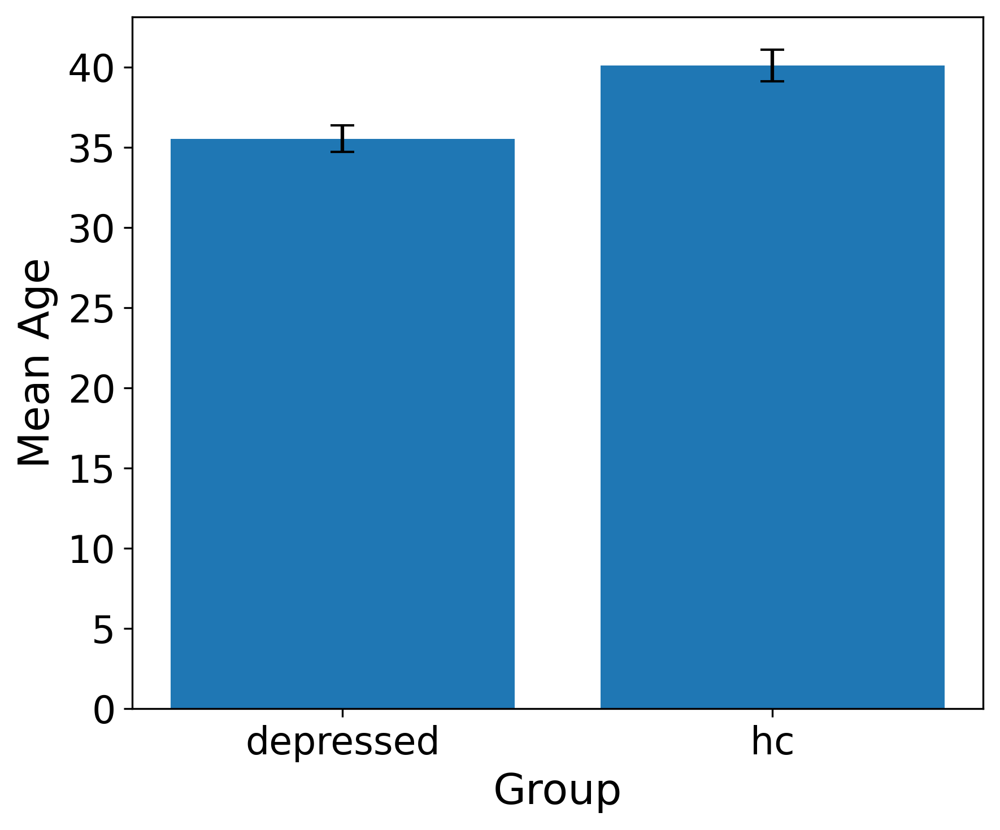

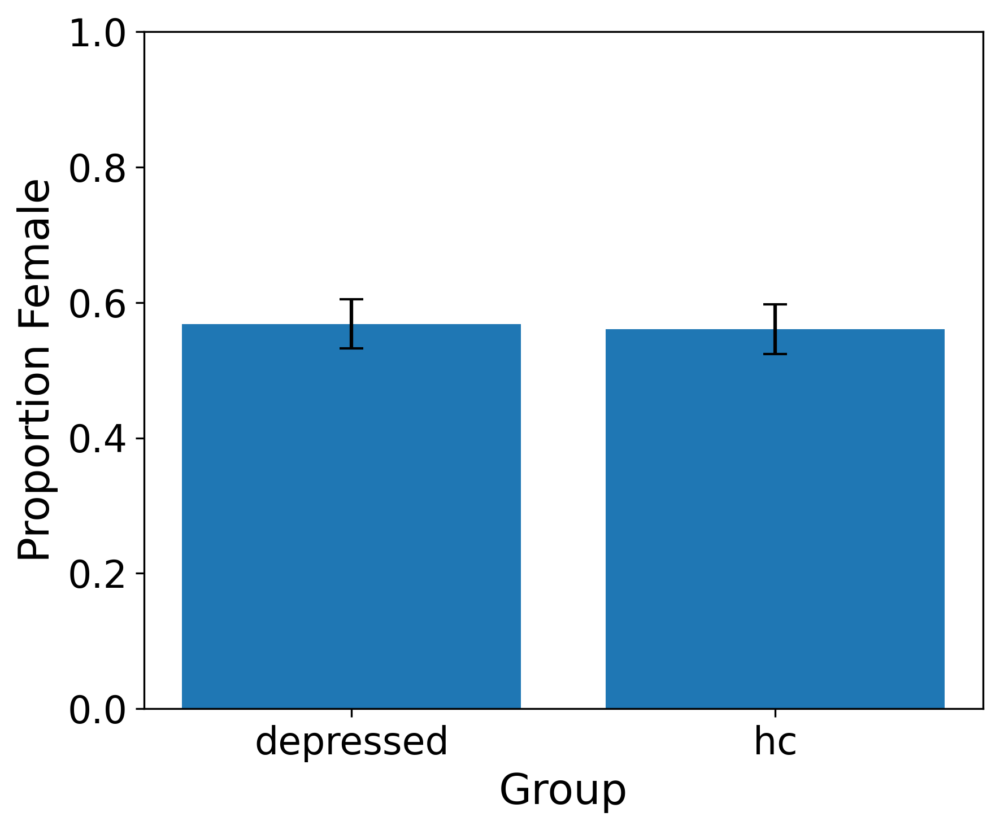

In [350]:
# Study 1

summary = (
    check_df_study1
    .groupby("group")
    .agg(
        mean_age=("Age", "mean"),
        se_age=("Age", lambda x: x.std(ddof=1) / np.sqrt(len(x))),
        prop_female=("Sex", lambda x: (x == "Female").mean()),
        n=("Sex", "count")
    )
    .reset_index()
)

# Standard error for proportion:
summary["se_prop_female"] = np.sqrt(
    summary["prop_female"] * (1 - summary["prop_female"]) / summary["n"]
)

print(summary)

from scipy import stats
from statsmodels.stats.proportion import proportions_ztest

# Split groups
hc = check_df_study1[check_df_study1["group"] == "hc"]
dep = check_df_study1[check_df_study1["group"] == "depressed"]

# =========================================================
# Age — Independent samples t-test
# =========================================================
t_stat, p_age = stats.ttest_ind(
    hc["Age"],
    dep["Age"],
    equal_var=False  # Welch's t-test (safer)
)

print(f"Age difference (Welch t-test): t = {t_stat:.3f}, p = {p_age:.4f}")

# =========================================================
#  Gender — Proportion test
# =========================================================

# Count females
female_counts = np.array([
    (hc["Sex"] == "Female").sum(),
    (dep["Sex"] == "Female").sum()
])

# Total per group
n_obs = np.array([len(hc), len(dep)])

z_stat, p_gender = proportions_ztest(female_counts, n_obs)

print(f"Gender proportion difference (z-test): z = {z_stat:.3f}, p = {p_gender:.4f}")


# Variation in Age across Depression
fig, ax = plt.subplots(figsize=(6,5), dpi=300)

ax.bar(
    summary["group"],
    summary["mean_age"],
    yerr=summary["se_age"],
    capsize=5
)

ax.set_ylabel("Mean Age", fontsize=18)
ax.set_xlabel("Group", fontsize=18)
ax.tick_params(axis='both', labelsize=16)

plt.tight_layout()
plt.savefig("../plots/age_v_depression_study1.png", bbox_inches='tight',dpi = 300)
plt.show()

# Variation in Gender Proportion across Depression
fig, ax = plt.subplots(figsize=(6,5), dpi=300)

ax.bar(
    summary["group"],
    summary["prop_female"],
    yerr=summary["se_prop_female"],
    capsize=5
)

ax.set_ylabel("Proportion Female", fontsize=18)
ax.set_xlabel("Group", fontsize=18)
ax.set_ylim(0, 1)
ax.tick_params(axis='both', labelsize=16)

plt.tight_layout()
plt.savefig("../plots/proportion_female_study1.png", bbox_inches='tight',dpi = 300)
plt.show()

In [351]:
check_df_study2["Age"] = pd.to_numeric(check_df_study2["Age"], errors="coerce")

In [352]:
# Study 2

summary = (
    check_df_study2
    .groupby("phq_score")
    .agg(
        mean_age=("Age", "mean"),
        se_age=("Age", lambda x: x.std(ddof=1) / np.sqrt(len(x))),
        prop_female=("Sex", lambda x: (x == "Female").mean()),
        n=("Sex", "count")
    )
    .reset_index()
)

# Standard error for proportion:
summary["se_prop_female"] = np.sqrt(
    summary["prop_female"] * (1 - summary["prop_female"]) / summary["n"]
)

                            OLS Regression Results                            
Dep. Variable:                    Age   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                  0.025
Method:                 Least Squares   F-statistic:                     16.28
Date:                Tue, 18 Aug 2026   Prob (F-statistic):           6.19e-05
Time:                        13:32:18   Log-Likelihood:                -2267.2
No. Observations:                 597   AIC:                             4538.
Df Residuals:                     595   BIC:                             4547.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     42.0633      0.817     51.497      0.0

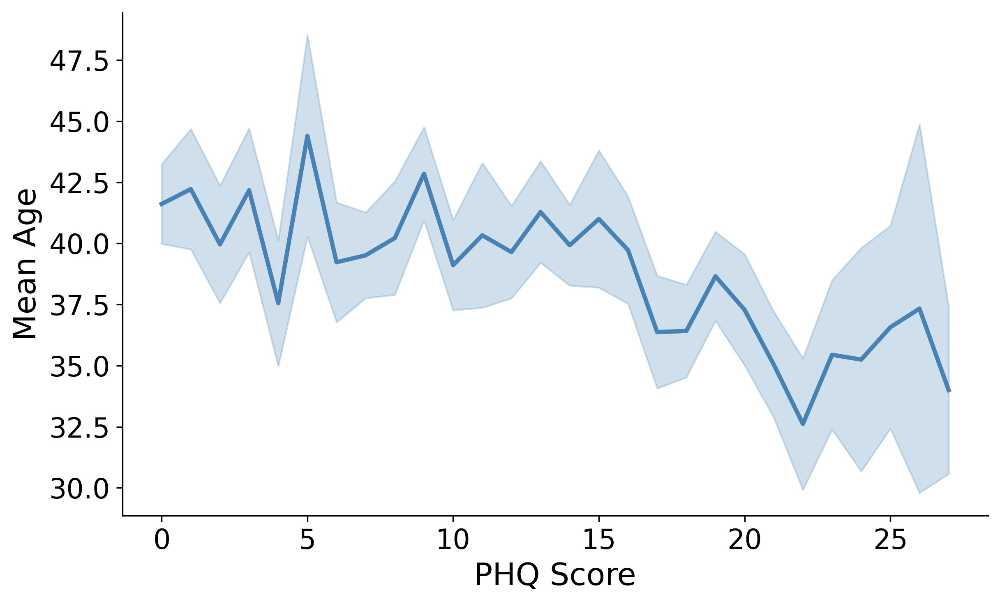

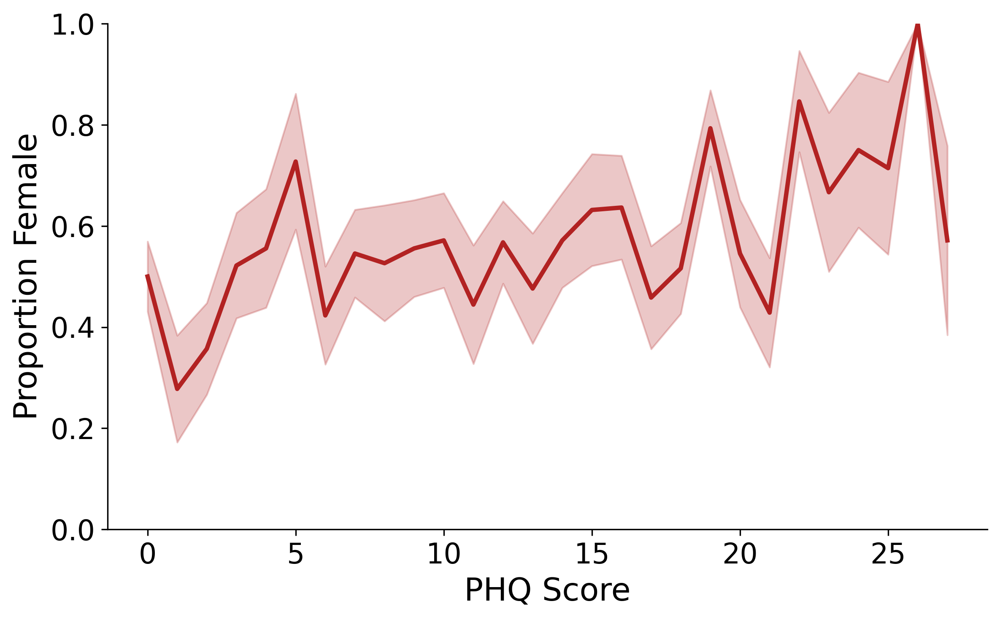

In [353]:
model_age = smf.ols(
    "Age ~ phq_score",
    data=check_df_study2
).fit()

print(model_age.summary())

check_df_study2["female_binary"] = (check_df_study2["Sex"] == "Female").astype(int)

model_gender = smf.logit(
    "female_binary ~ phq_score",
    data=check_df_study2
).fit()

print(model_gender.summary())


fig, ax = plt.subplots(figsize=(8,5), dpi=300)

ax.plot(
    summary["phq_score"],
    summary["mean_age"],
    color="steelblue",
    linewidth=2.5
)

# Shaded SE band
ax.fill_between(
    summary["phq_score"],
    summary["mean_age"] - summary["se_age"],
    summary["mean_age"] + summary["se_age"],
    color="steelblue",
    alpha=0.25
)

ax.set_xlabel("PHQ Score", fontsize=18)
ax.set_ylabel("Mean Age", fontsize=18)
ax.tick_params(axis='both', labelsize=16)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig("../plots/age_v_depression_study2.png", bbox_inches='tight',dpi = 300)
plt.show()

fig, ax = plt.subplots(figsize=(8,5), dpi=300)

ax.plot(
    summary["phq_score"],
    summary["prop_female"],
    color="firebrick",
    linewidth=2.5
)

# Shaded SE band
ax.fill_between(
    summary["phq_score"],
    summary["prop_female"] - summary["se_prop_female"],
    summary["prop_female"] + summary["se_prop_female"],
    color="firebrick",
    alpha=0.25
)

ax.set_xlabel("PHQ Score", fontsize=18)
ax.set_ylabel("Proportion Female", fontsize=18)
ax.set_ylim(0,1)
ax.tick_params(axis='both', labelsize=16)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig("../plots/proportion_female_study2.png", bbox_inches='tight',dpi = 300)
plt.show()

In [354]:
# Please contact researchers for access to the demographics information needed to run this analysis.

demo_study1 = study1_table[['subject','Age','Sex']].copy()
demo_study2 = study2_table[['subject','Age','Sex']].copy()


In [355]:
demo_study2["Age"] = pd.to_numeric(demo_study2["Age"], errors="coerce")

In [356]:
demo_study1["female_binary"] = (demo_study1["Sex"] == "Female").astype(int)
demo_study2["female_binary"] = (demo_study2["Sex"] == "Female").astype(int)


In [357]:
demo_study1["age_z"] = (
    demo_study1["Age"] - demo_study1["Age"].mean()
) / demo_study1["Age"].std(ddof=1)

demo_study2["age_z"] = (
    demo_study2["Age"] - demo_study2["Age"].mean()
) / demo_study2["Age"].std(ddof=1)

In [358]:
#Matched
combo_depr_study1 = pd.merge(combo_depr_study1,demo_study1)
combo_depr_study2 = pd.merge(combo_depr_study2,demo_study2)

#Unmatched
pos_neg_study1 = pd.merge(pos_neg_study1,demo_study1)
pos_neg_study2 = pd.merge(pos_neg_study2,demo_study2)

In [359]:
pair_demo_study1 = pd.merge(pair_df_study1,demo_study1, on = 'subject', how = 'inner')
pair_demo_study2 = pd.merge(pair_df_study2,demo_study2, on = 'subject', how = 'inner')


In [360]:
# Robustness Check


def seq_sampling_stats_robust(pos_neg_df1, study):
    
    pos_neg_df1["pos_neg_z"] = pos_neg_df1.groupby("subject")["delta_pos_rat"].transform(
        lambda x: (x - x.mean()) / x.std(ddof=1))  
    pos_neg_df1["rt_z"] = pos_neg_df1.groupby("subject")["rt"].transform(
        lambda x: (x - x.mean()) / x.std(ddof=1))  

    model_vars = [
    "rt_z",
    "pos_neg_z",
    "group",    
    "subject"
    ]

    pos_neg_df1_model = pos_neg_df1.dropna(subset=model_vars).copy()
    
    # Ensure centered / scaled predictor 
    x = pos_neg_df1_model["pos_neg_z"].to_numpy()

    Q, _ = np.linalg.qr(polyvander(x, 2))
    pos_neg_lin  = Q[:, 1]
    pos_neg_quad = Q[:, 2]

    pos_neg_df1_model["pos_neg_lin"] = pos_neg_lin
    pos_neg_df1_model["pos_neg_quad"] = pos_neg_quad

    r, p = pearsonr(pos_neg_df1_model["pos_neg_lin"], pos_neg_df1_model["pos_neg_quad"])
    print(f"r = {r:.3f}, p = {p:.3f}")

    if study == 'study_2':

        ################## CHOICE #################
        model_choice = smf.logit(
            "valence_chosen_int ~ pos_neg_z + phq_z*age_z*female_binary",
            data=pos_neg_df1_model
        ).fit()

        print(model_choice.summary())

        # -------------------------------------------------
        # Extract p-values formatted
        # -------------------------------------------------
        print(model_choice.pvalues.apply(lambda x: f"{x:.16f}"))

        
        ################# RT ######################
        model_rt = smf.ols(
            "rt_z ~ pos_neg_lin + pos_neg_quad + pos_neg_lin*phq_z*age_z*female_binary",
            data=pos_neg_df1_model
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    
    elif study == 'study_1':

        ############# CHOICE #######################
        model_choice = smf.logit(
            "valence_chosen_int ~ pos_neg_z + group*age_z*female_binary",
            data=pos_neg_df1_model
        ).fit()

        print(model_choice.summary())


        ################# RT ######################
        model_rt = smf.ols(
            "rt_z ~ pos_neg_lin + pos_neg_quad + pos_neg_lin*group*age_z*female_binary",
            data=pos_neg_df1_model
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    

seq_sampling_stats_robust(combo_depr_study1,'study_1')
seq_sampling_stats_robust(combo_depr_study2,'study_2')

seq_sampling_stats_robust(pos_neg_study1,'study_1')
seq_sampling_stats_robust(pos_neg_study2,'study_2')

r = 0.000, p = 1.000
Optimization terminated successfully.
         Current function value: 0.449097
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:     valence_chosen_int   No. Observations:                 3003
Model:                          Logit   Df Residuals:                     2994
Method:                           MLE   Df Model:                            8
Date:                Tue, 18 Aug 2026   Pseudo R-squ.:                 0.06648
Time:                        13:32:19   Log-Likelihood:                -1348.6
converged:                       True   LL-Null:                       -1444.7
Covariance Type:            nonrobust   LLR p-value:                 2.971e-37
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept                           1.1053   

In [361]:
#-----------------------------------------------
# ROBUSTNESS CHECKS (SUPPLEMENTARY TABLES 18 - 30)
#-----------------------------------------------

In [362]:
# Supplementary Table 18

# Choice Regressor Summary with delta self-belief not rescaled at subject level

choice_study1_rc = az.InferenceData.from_netcdf('../../model_output/study_1/choice_regressor_model_rob_check.nc')
choice_study2_rc = az.InferenceData.from_netcdf('../../model_output/study_2/choice_regressor_model_rob_check.nc')

print(az.summary(choice_study1_rc,hdi_prob=0.95).head())

print(az.summary(choice_study2_rc,hdi_prob=0.95).head())

                              mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
Intercept                   -0.124  0.024    -0.170     -0.078      0.000   
delta_valence                1.063  0.093     0.879      1.246      0.001   
d_sb_raw_mod                 5.984  0.221     5.555      6.423      0.002   
1|subject_sigma              0.223  0.036     0.152      0.293      0.000   
delta_valence|subject_sigma  1.305  0.095     1.121      1.490      0.001   

                             mcse_sd  ess_bulk  ess_tail  r_hat  
Intercept                      0.000   28658.0   16571.0    1.0  
delta_valence                  0.001   10413.0   13719.0    1.0  
d_sb_raw_mod                   0.001   13842.0   14306.0    1.0  
1|subject_sigma                0.000    5961.0    7238.0    1.0  
delta_valence|subject_sigma    0.001    7741.0   12724.0    1.0  
                              mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
Intercept                   -0.089  0.017    -0.121     -0.056  

In [363]:
# Supplementary Table 19

# RT Regression Robustness Check with RT not z-scored at subject level and delta-self-belief vals used to construct mod delta self-belief not rescaled

rt_study1_rc = az.InferenceData.from_netcdf('../../model_output/study_1/rt_regressor_model_rob_check.nc')
rt_study2_rc = az.InferenceData.from_netcdf('../../model_output/study_2/rt_regressor_model_rob_check.nc')

print(az.summary(rt_study1_rc,hdi_prob=0.95).head())

print(az.summary(rt_study2_rc,hdi_prob=0.95).head())

# Val Left values were initially coded as Negative (+1) and Positive (-1)
# Val Left values reported in supplementary table are values multiplied with -1 to correspond to Postive (+1) and Negative (-1) 

                   mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
sigma             0.754  0.005     0.745      0.764      0.000    0.000   
Intercept         0.169  0.035     0.100      0.237      0.001    0.001   
val_left          0.055  0.008     0.039      0.072      0.000    0.000   
val_right        -0.057  0.009    -0.074     -0.040      0.000    0.000   
d_sb_raw_mod_abs -1.005  0.059    -1.126     -0.893      0.001    0.000   

                  ess_bulk  ess_tail  r_hat  
sigma              18370.0   14367.0    1.0  
Intercept           1014.0    2029.0    1.0  
val_left           13522.0   15869.0    1.0  
val_right          11665.0   14533.0    1.0  
d_sb_raw_mod_abs   11263.0   13678.0    1.0  
                   mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
sigma             0.793  0.003     0.788      0.799      0.000      0.0   
Intercept         0.233  0.027     0.180      0.286      0.001      0.0   
val_left          0.007  0.005    -0.003      0.

In [382]:
# Supplementary Table 20

# RT Valence Regressor Summary with RT and Pos-Neg not z-scored at subject level

rt_study1_valence_rc = az.InferenceData.from_netcdf('../../model_output/study_1/rt_valence_regressor_model_rob_check_with_ortho.nc')
rt_study2_valence_rc = az.InferenceData.from_netcdf('../../model_output/study_2/rt_valence_regressor_model_rob_check_with_ortho.nc')

print(az.summary(rt_study1_valence_rc,hdi_prob=0.95).head())

print(az.summary(rt_study2_valence_rc,hdi_prob=0.95).head())

                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
sigma            0.676  0.008     0.661      0.690      0.000    0.000   
Intercept       -0.182  0.030    -0.243     -0.123      0.001    0.000   
pos_neg_lin     -5.281  1.119    -7.461     -3.102      0.010    0.007   
pos_neg_quad    -5.123  0.961    -6.981     -3.240      0.007    0.006   
1|subject_sigma  0.549  0.023     0.506      0.596      0.000    0.000   

                 ess_bulk  ess_tail  r_hat  
sigma             12837.0   13901.0    1.0  
Intercept          2791.0    4897.0    1.0  
pos_neg_lin       12892.0   15212.0    1.0  
pos_neg_quad      17368.0   15676.0    1.0  
1|subject_sigma    4264.0    8366.0    1.0  
                   mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
sigma             0.782  0.005     0.773      0.792      0.000    0.000   
Intercept        -0.040  0.025    -0.088      0.009      0.001    0.000   
pos_neg_lin      -3.847  1.082    -6.019     -1.749      0.0

In [365]:
# Supplementary Table 21

# RT Valence Regressor Summary with RT and Pos-Neg not z-scored at subject level
# RT regressors not orthogonalized

rt_study1_valence_rc = az.InferenceData.from_netcdf('../../model_output/study_1/rt_valence_regressor_model_rob_check.nc')
rt_study2_valence_rc = az.InferenceData.from_netcdf('../../model_output/study_2/rt_valence_regressor_model_rob_check.nc')

print(az.summary(rt_study1_valence_rc,hdi_prob=0.95).head())

print(az.summary(rt_study2_valence_rc,hdi_prob=0.95).head())

                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
sigma            0.678  0.007     0.663      0.692      0.000      0.0   
Intercept       -0.116  0.032    -0.181     -0.053      0.001      0.0   
pos_neg_lin     -0.114  0.017    -0.149     -0.081      0.000      0.0   
pos_neg_quad    -0.066  0.012    -0.089     -0.044      0.000      0.0   
1|subject_sigma  0.550  0.023     0.507      0.598      0.000      0.0   

                 ess_bulk  ess_tail  r_hat  
sigma             14455.0   13924.0    1.0  
Intercept          2184.0    5121.0    1.0  
pos_neg_lin        9515.0   13348.0    1.0  
pos_neg_quad      11366.0   13543.0    1.0  
1|subject_sigma    3675.0    7772.0    1.0  
                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
sigma            0.788  0.005     0.778      0.797      0.000      0.0   
Intercept        0.085  0.027     0.034      0.139      0.001      0.0   
pos_neg_lin     -0.073  0.009    -0.092     -0.056      0.000  

In [366]:
# Supplementary Tables 22,26

# Robustness Checks for beta delta valence results
# RT and Delta Pos-Neg without subject-level z-scoring

def seq_sampling_stats_rob_check(pos_neg_df1, study):

    pos_neg_df1['v_delta_valence_z'] = (pos_neg_df1['v_delta_valence'] - pos_neg_df1['v_delta_valence'].mean()) / pos_neg_df1['v_delta_valence'].std(ddof=1)

    pos_neg_df1["pos_neg_z2"] = (
    pos_neg_df1["delta_pos_rat"] - pos_neg_df1["delta_pos_rat"].mean()
    ) / pos_neg_df1["delta_pos_rat"].std(ddof=1) 
    
    pos_neg_df1["rt_z2"] = (
    pos_neg_df1["rt"] - pos_neg_df1["rt"].mean()
    ) / pos_neg_df1["rt"].std(ddof=1) 

    model_vars = [
    "rt_z2",
    "pos_neg_z2",
    "v_delta_valence",
    "subject"
    ]

    pos_neg_df1_model = pos_neg_df1.dropna(subset=model_vars).copy()
    
    # Ensure centered / scaled predictor 
    x = pos_neg_df1_model["pos_neg_z2"].to_numpy()

    Q, _ = np.linalg.qr(polyvander(x, 2))
    pos_neg_lin  = Q[:, 1]
    pos_neg_quad = Q[:, 2]

    pos_neg_df1_model["pos_neg_lin"] = pos_neg_lin
    pos_neg_df1_model["pos_neg_quad"] = pos_neg_quad
    
    r, p = pearsonr(pos_neg_df1_model["pos_neg_lin"], pos_neg_df1_model["pos_neg_quad"])
    print(f"r = {r:.3f}, p = {p:.3f}")
    
    if study == 'study_2':

               ############# CHOICE #######################
        model_choice = smf.glm(
            "valence_chosen_int ~ pos_neg_z2 + v_delta_valence_z",
            data=pos_neg_df1_model,
            family=sm.families.Binomial()
        ).fit()
        print(model_choice.summary())

        # Get design matrix used in OLS
        X = model_choice.model.exog
        feature_names = model_choice.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_choice = pd.DataFrame()
        vif_choice["variable"] = X_no_intercept.columns
        vif_choice["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_choice)

        ################# RT ######################
        model_rt = smf.ols(
            "rt_z2 ~ pos_neg_lin + pos_neg_quad + pos_neg_lin*v_delta_valence_z",
            data=pos_neg_df1_model
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    
    elif study == 'study_1':

        ############# CHOICE #######################
        model_choice = smf.glm(
            "valence_chosen_int ~ pos_neg_z2 + v_delta_valence_z",
            data=pos_neg_df1_model,
            family=sm.families.Binomial()
        ).fit()
        print(model_choice.summary())

        # Get design matrix used in OLS
        X = model_choice.model.exog
        feature_names = model_choice.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_choice = pd.DataFrame()
        vif_choice["variable"] = X_no_intercept.columns
        vif_choice["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_choice)

        ################# RT ######################
        model_rt = smf.ols(
            "rt_z2 ~ pos_neg_lin + pos_neg_quad + pos_neg_lin*v_delta_valence_z",
            data=pos_neg_df1_model
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    

seq_sampling_stats_rob_check(pos_neg_df1_study1,'study_1')
seq_sampling_stats_rob_check(pos_neg_df1_study2,'study_2')
  

r = -0.000, p = 1.000
                 Generalized Linear Model Regression Results                  
Dep. Variable:     valence_chosen_int   No. Observations:                 1614
Model:                            GLM   Df Residuals:                     1611
Model Family:                Binomial   Df Model:                            2
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -733.35
Date:                Tue, 18 Aug 2026   Deviance:                       1466.7
Time:                        13:34:03   Pearson chi2:                 2.39e+03
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3797
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept       

In [367]:
# Supplementary Tables 23, 27

# Robustness check for depression results
# RT and Delta Pos-Neg without subject-level z-scoring


def seq_sampling_stats_depr_rob_check(pos_neg_df1, study):
    
    pos_neg_df1["pos_neg_z2"] = (
    pos_neg_df1["delta_pos_rat"] - pos_neg_df1["delta_pos_rat"].mean()
    ) / pos_neg_df1["delta_pos_rat"].std(ddof=1) 
    
    pos_neg_df1["rt_z2"] = (
    pos_neg_df1["rt"] - pos_neg_df1["rt"].mean()
    ) / pos_neg_df1["rt"].std(ddof=1) 

    
    model_vars = [
    "rt_z2",
    "pos_neg_z2",
    "group",    
    "subject"
    ]

    pos_neg_df1_model = pos_neg_df1.dropna(subset=model_vars).copy()
    
    # Ensure centered / scaled predictor 
    x = pos_neg_df1_model["pos_neg_z2"].to_numpy()

    Q, _ = np.linalg.qr(polyvander(x, 2))
    pos_neg_lin  = Q[:, 1]
    pos_neg_quad = Q[:, 2]

    pos_neg_df1_model["pos_neg_lin"] = pos_neg_lin
    pos_neg_df1_model["pos_neg_quad"] = pos_neg_quad
    
    r, p = pearsonr(pos_neg_df1_model["pos_neg_lin"], pos_neg_df1_model["pos_neg_quad"])
    print(f"Orthogonal r = {r:.3f}, p = {p:.3f}")

    if study == 'study_2':

        ################## CHOICE #################
        model_choice = Lmer("valence_chosen_int ~ pos_neg_z2+ phq_score + (1 + pos_neg_z2|subject)", data=pos_neg_df1_model, family = 'binomial')
        results_choice = model_choice.fit()
        print(results_choice)
        print(results_choice["P-val"].apply(lambda x: f"{x:.16f}"))

        X = model_choice.design_matrix

        # Get column names
        feature_names = X.columns

        vif_choice = pd.DataFrame()
        vif_choice["variable"] = feature_names
        vif_choice["VIF"] = [
            variance_inflation_factor(X.values, i)
            for i in range(X.shape[1])
        ]
        print(vif_choice)  
        
        ################# RT ######################
        model_rt = smf.ols(
            "rt_z2 ~ pos_neg_lin + pos_neg_quad + pos_neg_lin*phq_score",
            data=pos_neg_df1_model
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    
    elif study == 'study_1':
        
        ############# CHOICE #######################
        model_choice = Lmer("valence_chosen_int ~ pos_neg_z2 + group + (1 +pos_neg_z2|subject)", data=pos_neg_df1_model, family = 'binomial')
        results_choice = model_choice.fit()
        print(results_choice)
        print(results_choice["P-val"].apply(lambda x: f"{x:.16f}"))

        # Get fixed-effects design matrix from pymer4
        X = model_choice.design_matrix

        # Get column names
        feature_names = X.columns

        vif_choice = pd.DataFrame()
        vif_choice["variable"] = feature_names
        vif_choice["VIF"] = [
            variance_inflation_factor(X.values, i)
            for i in range(X.shape[1])
        ]
        print(vif_choice)
        
        ################# RT ######################
        model_rt = smf.ols(
            "rt_z2 ~ pos_neg_lin + pos_neg_quad + pos_neg_lin*group",
            data=pos_neg_df1_model
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    
seq_sampling_stats_depr_rob_check(combo_depr_study1,'study_1')
seq_sampling_stats_depr_rob_check(combo_depr_study2,'study_2')


Orthogonal r = -0.000, p = 1.000


/Users/spand31/hssm_env_v3_10/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "bin". Fall back to string conversion. The error is: Converting pandas "Category" series to R factor is only possible when categories are strings.
  warnings.warn('Error while trying to convert '


Linear mixed model fit by maximum likelihood  ['lmerMod']
Formula: valence_chosen_int~pos_neg_z2+group+(1+pos_neg_z2|subject)

Family: binomial	 Inference: parametric

Number of observations: 3020	 Groups: {'subject': 372.0}

Log-likelihood: -1110.076 	 AIC: 2232.152

Random effects:

                Name    Var    Std
subject  (Intercept)  1.753  1.324
subject   pos_neg_z2  0.607  0.779

                 IV1         IV2   Corr
subject  (Intercept)  pos_neg_z2  0.563

Fixed effects:

             Estimate  2.5_ci  97.5_ci     SE     OR  OR_2.5_ci  OR_97.5_ci  \
(Intercept)     1.985   1.693    2.277  0.149  7.277      5.435       9.744   
pos_neg_z2      1.521   1.297    1.745  0.114  4.576      3.658       5.725   
groupHC         0.883   0.518    1.248  0.186  2.418      1.679       3.482   

              Prob  Prob_2.5_ci  Prob_97.5_ci  Z-stat  P-val  Sig  
(Intercept)  0.879        0.845         0.907  13.330    0.0  ***  
pos_neg_z2   0.821        0.785         0.851  13.309    0

/Users/spand31/hssm_env_v3_10/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "bin". Fall back to string conversion. The error is: Converting pandas "Category" series to R factor is only possible when categories are strings.
  warnings.warn('Error while trying to convert '


Linear mixed model fit by maximum likelihood  ['lmerMod']
Formula: valence_chosen_int~pos_neg_z2+phq_score+(1+pos_neg_z2|subject)

Family: binomial	 Inference: parametric

Number of observations: 10863	 Groups: {'subject': 602.0}

Log-likelihood: -4749.065 	 AIC: 9510.130

Random effects:

                Name    Var    Std
subject  (Intercept)  0.799  0.894
subject   pos_neg_z2  1.061  1.030

                 IV1         IV2   Corr
subject  (Intercept)  pos_neg_z2  0.072

Fixed effects:

             Estimate  2.5_ci  97.5_ci     SE     OR  OR_2.5_ci  OR_97.5_ci  \
(Intercept)     1.637   1.453    1.821  0.094  5.141      4.278       6.178   
pos_neg_z2      1.963   1.834    2.093  0.066  7.124      6.261       8.106   
phq_score      -0.046  -0.060   -0.033  0.007  0.955      0.942       0.967   

              Prob  Prob_2.5_ci  Prob_97.5_ci  Z-stat  P-val  Sig  
(Intercept)  0.837        0.811         0.861  17.458    0.0  ***  
pos_neg_z2   0.877        0.862         0.890  29.796

In [368]:
#  Supplementary Table 24

# No orthogonalization
# Robustness check for beta delta valence results results
# RT and Delta Pos-Neg without subject-level z-scoring


def seq_sampling_stats_rob_orthog_check(pos_neg_df1, study):

    pos_neg_df1['v_delta_valence_z'] = (pos_neg_df1['v_delta_valence'] - pos_neg_df1['v_delta_valence'].mean()) / pos_neg_df1['v_delta_valence'].std(ddof=1)

    pos_neg_df1["pos_neg_z2"] = (
    pos_neg_df1["delta_pos_rat"] - pos_neg_df1["delta_pos_rat"].mean()
    ) / pos_neg_df1["delta_pos_rat"].std(ddof=1) 

    pos_neg_df1["pos_neg_z2_squared"] = pos_neg_df1["pos_neg_z2"] ** 2

    pos_neg_df1["rt_z2"] = (
    pos_neg_df1["rt"] - pos_neg_df1["rt"].mean()
    ) / pos_neg_df1["rt"].std(ddof=1) 
    

    if study == 'study_2':

        ################# RT ######################
        model_rt = smf.ols(
            "rt_z2 ~ pos_neg_z2 + pos_neg_z2_squared + pos_neg_z2*v_delta_valence_z",
            data=pos_neg_df1
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    
    elif study == 'study_1':


        ################# RT ######################
        model_rt = smf.ols(
            "rt_z2 ~ pos_neg_z2 + pos_neg_z2_squared + pos_neg_z2*v_delta_valence_z",
            data=pos_neg_df1
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    

seq_sampling_stats_rob_orthog_check(pos_neg_df1_study1,'study_1')
seq_sampling_stats_rob_orthog_check(pos_neg_df1_study2,'study_2')
  


                            OLS Regression Results                            
Dep. Variable:                  rt_z2   R-squared:                       0.038
Model:                            OLS   Adj. R-squared:                  0.035
Method:                 Least Squares   F-statistic:                     15.79
Date:                Tue, 18 Aug 2026   Prob (F-statistic):           1.10e-12
Time:                        13:34:08   Log-Likelihood:                -2258.6
No. Observations:                1614   AIC:                             4527.
Df Residuals:                    1609   BIC:                             4554.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

In [369]:
# Supplementary Table 25

# No orthogonalization
# Robustness check for depression results
# RT and Delta Pos-Neg without subject-level z-scoring


def seq_sampling_stats_depr_orthog_check(pos_neg_df1, study):
    
    pos_neg_df1["pos_neg_z2"] = (
    pos_neg_df1["delta_pos_rat"] - pos_neg_df1["delta_pos_rat"].mean()
    ) / pos_neg_df1["delta_pos_rat"].std(ddof=1) 

    pos_neg_df1["pos_neg_z2_squared"] = pos_neg_df1["pos_neg_z2"] ** 2
    
    pos_neg_df1["rt_z2"] = (
    pos_neg_df1["rt"] - pos_neg_df1["rt"].mean()
    ) / pos_neg_df1["rt"].std(ddof=1) 

    r, p = pearsonr(pos_neg_df1["pos_neg_z2"], pos_neg_df1["pos_neg_z2_squared"])
    print(f"Unorthogonal r = {r:.3f}, p = {p:.3f}")
        
    if study == 'study_2':
        
        ################# RT ######################
        model_rt = smf.ols(
            "rt_z2 ~ pos_neg_z2 + pos_neg_z2_squared + pos_neg_z2*phq_score",
            data=pos_neg_df1
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    
    elif study == 'study_1':
             
        ################# RT ######################
        model_rt = smf.ols(
            "rt_z2 ~ pos_neg_z2 + pos_neg_z2_squared + pos_neg_z2*group",
            data=pos_neg_df1
        ).fit()
        print(model_rt.summary())

        # Get design matrix used in OLS
        X = model_rt.model.exog
        feature_names = model_rt.model.exog_names

        # Convert to DataFrame
        X_df = pd.DataFrame(X, columns=feature_names)

        # Drop intercept (not interpreted)
        X_no_intercept = X_df.drop(columns="Intercept")

        # Compute VIF
        vif_rt = pd.DataFrame()
        vif_rt["variable"] = X_no_intercept.columns
        vif_rt["VIF"] = [
            variance_inflation_factor(X_no_intercept.values, i)
            for i in range(X_no_intercept.shape[1])
        ]

        print(vif_rt)
    
seq_sampling_stats_depr_orthog_check(combo_depr_study1,'study_1')
seq_sampling_stats_depr_orthog_check(combo_depr_study2,'study_2')


Unorthogonal r = -0.309, p = 0.000
                            OLS Regression Results                            
Dep. Variable:                  rt_z2   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     11.01
Date:                Tue, 18 Aug 2026   Prob (F-statistic):           7.26e-09
Time:                        13:34:08   Log-Likelihood:                -4262.8
No. Observations:                3020   AIC:                             8536.
Df Residuals:                    3015   BIC:                             8566.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

In [370]:
# Supplementary Figure 7
# Generating Choice, RT vs Delta Self-Belief Plots without norming at the subject level

In [371]:
def calc_delta_sb_norm(combo_pairings):

    combo_pairings['delta_sb'] = (
        (combo_pairings['r_diff'] - combo_pairings['r_diff'].min())
        / (combo_pairings['r_diff'].max() - combo_pairings['r_diff'].min())
    ) # No subject level norming

    combo_pairings['delta_sb'] = combo_pairings['delta_sb'] - 0.5
    combo_pairings['delta_sb'] = round(combo_pairings['delta_sb'], 1)

    return combo_pairings

pair_df_study1 = calc_delta_sb_norm(pair_df_study1)
pair_df_study2 = calc_delta_sb_norm(pair_df_study2)



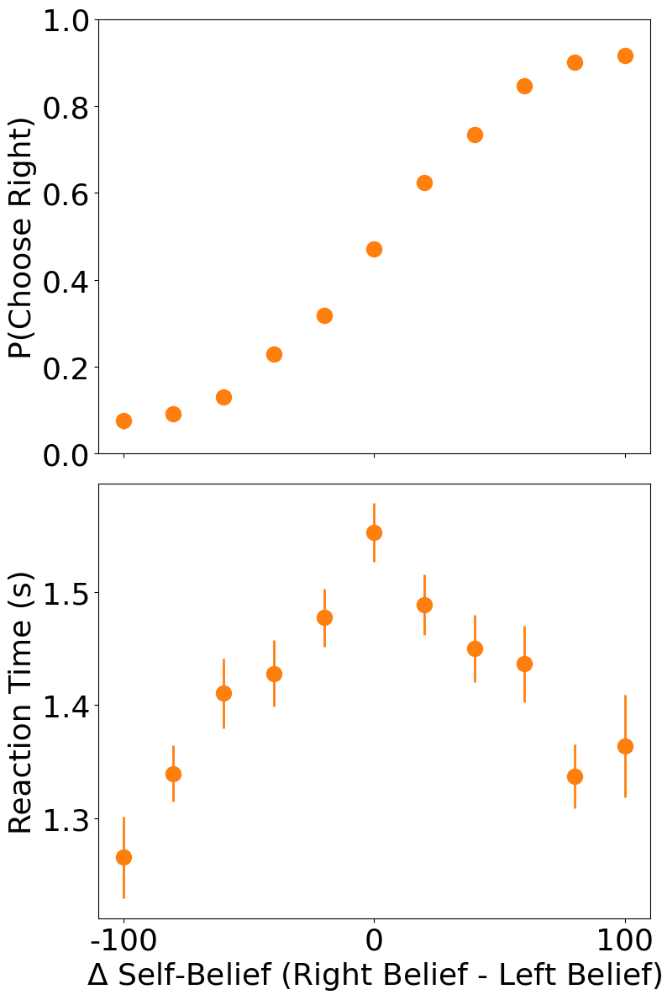

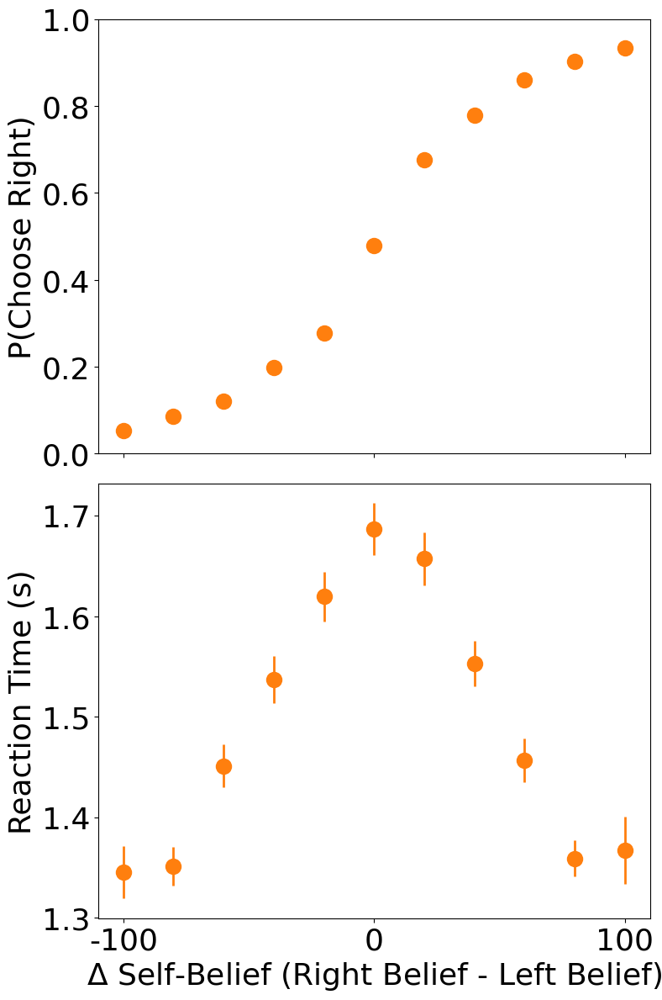

In [372]:
def gen_seq_sampling_curves_robust(pair_data,study): 
    
# Choice Difficult not normed at the subject level

    
    ############# Calculated observed and predicted RT and choice as a function of delta self-belief #########
    
    ########## Observed ###########
    # RT
    pair_data['delta_sb'] = pair_data['delta_sb'].round(1)
    rt_mod1a = pair_data.groupby(['subject','delta_sb'],as_index=False,observed=True)['rt'].median()
    rt_mod2a = rt_mod1a.groupby('delta_sb',observed=True)['rt'].agg(
        mean='mean',
        se=lambda x: x.std(ddof=1) / np.sqrt(x.count())
    ).reset_index()

    # Choice
    pair_mod1a = pair_data.groupby(['subject','delta_sb'],as_index=False,observed=True)['choice'].mean()
    pair_mod2a = pair_mod1a.groupby('delta_sb',observed=True)['choice'].agg(
        mean='mean',
        se=lambda x: x.std(ddof=1) / np.sqrt(x.count())
    ).reset_index()


    ############################################# Plotting ########################################

    fig, axes = plt.subplots(2, 1, figsize=(8, 12), sharex=True)
    s_val = 1.0  # smoothing parameter

    # =========================
    # Top panel (merged_df3) - Choice proportions
    # =========================
    df3 = pair_mod2a.copy()
    df3["delta_sb"] = pd.to_numeric(df3["delta_sb"], errors="coerce")

    df3 = (df3.groupby("delta_sb", as_index=False)
              .agg(mean=("mean", "mean"),
                   se=("se", "mean"))
              .dropna(subset=["delta_sb"]))

    df3_sorted = df3.sort_values("delta_sb")
    x3 = df3_sorted["delta_sb"].to_numpy()

    axes[0].errorbar(
        x3, df3_sorted["mean"], yerr=df3_sorted["se"],
        fmt='o', capsize=5, color='#FF7F0E', ecolor='#FF7F0E', markersize=14,
        elinewidth=2, markeredgewidth=0, label='Observed'
    )

    axes[0].set_ylabel('P(Choose Right)', fontsize=26)
    axes[0].tick_params(axis='x', labelsize=26)
    axes[0].tick_params(axis='y', labelsize=26)
    axes[0].set_xticks([-0.5, 0, 0.5])
    #axes[0].set_title('Study 2',fontsize = 26)
    axes[0].set_xticklabels(['-0.5', '0', '0.5'])
    axes[0].set_ylim(0,1)


    # =========================
    # Bottom panel (merged_df2) - Reaction time in seconds
    # =========================
    df2 = rt_mod2a.copy()
    df2["delta_sb"] = pd.to_numeric(df2["delta_sb"], errors="coerce")

    df2 = (df2.groupby("delta_sb", as_index=False)
              .agg(mean=("mean", "mean"),
                   se=("se", "mean"))
              .dropna(subset=["delta_sb"]))

    df2_sorted = df2.sort_values("delta_sb")
    x2 = df2_sorted["delta_sb"].to_numpy()
    # convert ms → seconds
    mean2 = df2_sorted["mean"]
    se2 = df2_sorted["se"]

    axes[1].errorbar(
        x2, mean2, yerr=se2,
        fmt='o', capsize=5, color='#FF7F0E', ecolor='#FF7F0E', markersize=14,
        elinewidth=2, markeredgewidth=0, label='Observed'
    )

    axes[1].set_xlabel(r'$\Delta$ Self-Belief (Right Belief - Left Belief)', fontsize=26)
    axes[1].set_ylabel('Reaction Time (s)', fontsize=26)  # seconds now
    axes[1].tick_params(axis='x', labelsize=26)
    axes[1].tick_params(axis='y', labelsize=26)
    axes[1].set_xticks([-0.5, 0, 0.5])
    axes[1].set_xticklabels(['-100', '0', '100'])


    plt.tight_layout()
    fig.savefig(
        f"../plots/seq_sampling_self_beliefs_robust_{study}",
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()

    return 

gen_seq_sampling_curves_robust(pair_df_study1,'study_1')
gen_seq_sampling_curves_robust(pair_df_study2,'study_2')


In [373]:
# Semantic Similarity Analysis

path = "../task_data/glove.6B.300d.txt"
model = KeyedVectors.load_word2vec_format(path, binary=False, no_header=True)

In [374]:
def add_sem_sim(pair_df):
    pair_df = pair_df.copy()
    def safe_sim(row):
        w1, w2 = row["left_word"], row["right_word"]
        if w1 in model and w2 in model:
            return model.similarity(w1, w2)
        return np.nan   # one or both words not in GloVe vocabulary

    pair_df["sem_sim"] = pair_df.apply(safe_sim, axis=1)

    # diagnostics
    n_missing = pair_df["sem_sim"].isna().sum()
    print(f"{n_missing} of {len(pair_df)} rows had a word not in GloVe")

    if n_missing > 0:
        missing = pair_df.loc[
            pair_df["sem_sim"].isna(), ["left_word", "right_word"]
        ]
        print(missing)

    return pair_df

pair_df_study1 = add_sem_sim(pair_df_study1)
pair_df_study2 = add_sem_sim(pair_df_study2)


302 of 14388 rows had a word not in GloVe
          left_word   right_word
29     unforgivable   goodwilled
52       goodwilled    satisfied
116             sad   goodwilled
137      goodwilled       gloomy
180      goodwilled     humorous
...             ...          ...
14198       learner   goodwilled
14248     incapable   goodwilled
14295        burden   goodwilled
14349      tolerant   goodwilled
14379    goodwilled  spectacular

[302 rows x 2 columns]
502 of 43146 rows had a word not in GloVe
         left_word  right_word
28      inadequate  goodwilled
52        alluring  goodwilled
108     goodwilled    alluring
129       decisive  goodwilled
163     goodwilled   defective
...            ...         ...
42835  cooperative  goodwilled
42848   goodwilled     learner
42942      playful  goodwilled
43032     flawless  goodwilled
43064     esteemed  goodwilled

[502 rows x 2 columns]


In [375]:
def get_missing_words(*dfs):
    missing = set()
    for df in dfs:
        for col in ["left_word", "right_word"]:
            for w in df[col].unique():
                if w not in model:
                    missing.add(w)
    return sorted(missing)

missing_words = get_missing_words(pair_df_study1, pair_df_study2)
print(f"{len(missing_words)} unique words not in GloVe:")
print(missing_words)

pair_df_study1 = pair_df_study1.dropna(subset=["sem_sim"])
pair_df_study2 = pair_df_study2.dropna(subset=["sem_sim"])


1 unique words not in GloVe:
['goodwilled']


In [376]:
# Supplementary Table 5

def test_sen_sim_covariate_rt(pair_df):

    pair_df = pair_df.copy()
    
    pair_df["rt_z"] = pair_df.groupby("subject")["rt"].transform(
            lambda x: (x - x.mean()) / x.std(ddof=1))  
    
    # Ensure centered / scaled predictor 
    x = pair_df["r_diff_norm"].to_numpy()

    Q, _ = np.linalg.qr(polyvander(x, 2))
    delta_lin  = Q[:, 1]
    delta_quad = Q[:, 2]

    pair_df["delta_lin"] = delta_lin
    pair_df["delta_quad"] = delta_quad

    r, p = pearsonr(pair_df["delta_lin"], pair_df["delta_quad"])
    print(f"r = {r:.3f}, p = {p:.3f}")

    # Obtained singular fits with mixed effects models. Hence using non-hierarchical model.
    
    model_rt = smf.ols(
        "rt_z ~ delta_quad + delta_lin + sem_sim",
        data=pair_df
    )

    results_rt = model_rt.fit()
    print(results_rt.summary())
    
test_sen_sim_covariate_rt(pair_df_study1)
test_sen_sim_covariate_rt(pair_df_study2)
    

r = -0.000, p = 1.000
                            OLS Regression Results                            
Dep. Variable:                   rt_z   R-squared:                       0.034
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     163.5
Date:                Tue, 18 Aug 2026   Prob (F-statistic):          3.48e-104
Time:                        13:34:33   Log-Likelihood:                -19558.
No. Observations:               14086   AIC:                         3.912e+04
Df Residuals:                   14082   BIC:                         3.915e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0432      0.0

In [377]:
# DDM Robustness Checks

model50a_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/ddm_model50a.nc') # Fully Hierarchical
model50b_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/ddm_model50b.nc') # No random intercepts on ndt
model51a_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/ddm_model51a.nc') # Fully Hierarchical interacted with Depression
model51b_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/ddm_model51b.nc') # No random intercepts on ndt interacted with Depression
model40b_study1 = az.InferenceData.from_netcdf('../../model_output/study_1/ddm_model40b.nc') # Original Model with Depression regressor on ndt

model50a_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/ddm_model50a_study2.nc')
model50b_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/ddm_model50b_study2.nc')
model51a_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/ddm_model51a_study2.nc')
model51b_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/ddm_model51b_study2.nc')
model40b_study2 = az.InferenceData.from_netcdf('../../model_output/study_2/ddm_model40b_study2.nc')


In [378]:
div = model50a_study1.sample_stats["diverging"]
print("Percentage divergent:", float(div.mean() * 100))

div = model50b_study1.sample_stats["diverging"]
print("Percentage divergent:", float(div.mean() * 100))

div = model50a_study2.sample_stats["diverging"]
print("Percentage divergent:", float(div.mean() * 100))

div = model50b_study2.sample_stats["diverging"]
print("Percentage divergent:", float(div.mean() * 100))

Percentage divergent: 86.235
Percentage divergent: 0.0
Percentage divergent: 3.46
Percentage divergent: 0.0


In [379]:
# Supplementary Table 28 # No random intercepts on ndt
print(az.summary(model50b_study1,  var_names = ['v_Intercept','v_r_diff_norm','v_delta_valence',
                                        'a_Intercept','z_Intercept','t'], hdi_prob=0.95).head(8))

print(az.summary(model50b_study2,  var_names = ['v_Intercept','v_r_diff_norm','v_delta_valence',
                                        'a_Intercept','z_Intercept','t'], hdi_prob=0.95).head(8))


                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
v_Intercept     -0.023  0.015    -0.052      0.006        0.0      0.0   
v_r_diff_norm    2.171  0.066     2.039      2.298        0.0      0.0   
v_delta_valence  0.487  0.037     0.414      0.559        0.0      0.0   
a_Intercept      1.091  0.016     1.060      1.123        0.0      0.0   
z_Intercept      0.488  0.004     0.481      0.495        0.0      0.0   
t                0.605  0.001     0.602      0.607        0.0      0.0   

                 ess_bulk  ess_tail  r_hat  
v_Intercept       22952.0   27639.0    1.0  
v_r_diff_norm     18685.0   27449.0    1.0  
v_delta_valence   10755.0   18451.0    1.0  
a_Intercept        2443.0    5822.0    1.0  
z_Intercept       33162.0   29462.0    1.0  
t                  5423.0    1816.0    1.0  
                  mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
v_Intercept     -0.019  0.008    -0.035     -0.003        0.0      0.0   
v_r_diff_norm    3

In [380]:
# Supplementary Table 29 # No random intercepts on ndt interacted with Depression

print(az.summary(model51b_study1,  var_names = ['v_Intercept','v_r_diff_norm','v_delta_valence',
                                         'v_group_int',
                                        'v_delta_valence:group_int',
                                        'a_Intercept','z_Intercept','t'], hdi_prob=0.95).head(8))

print(az.summary(model51b_study2,  var_names = ['v_Intercept','v_r_diff_norm','v_delta_valence',
                                         'v_phq_scale',
                                        'v_delta_valence:phq_scale',
                                        'a_Intercept','z_Intercept','t'], hdi_prob=0.95).head(8))


                            mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
v_Intercept               -0.023  0.015    -0.053      0.006        0.0   
v_r_diff_norm              2.128  0.065     2.000      2.255        0.0   
v_delta_valence            0.504  0.036     0.434      0.574        0.0   
v_group_int                0.009  0.013    -0.015      0.034        0.0   
v_delta_valence:group_int  0.210  0.035     0.142      0.281        0.0   
a_Intercept                1.091  0.016     1.059      1.122        0.0   
z_Intercept                0.488  0.004     0.481      0.495        0.0   
t                          0.605  0.001     0.602      0.607        0.0   

                           mcse_sd  ess_bulk  ess_tail  r_hat  
v_Intercept                    0.0   23464.0   27990.0    1.0  
v_r_diff_norm                  0.0   20009.0   26543.0    1.0  
v_delta_valence                0.0   12089.0   21177.0    1.0  
v_group_int                    0.0   23940.0   29361.0    1.0  
v_de

In [381]:
# Supplementary Table 30 # Original Model with Depression regressor on ndt

print(az.summary(model40b_study1,  var_names = ['v_Intercept','v_r_diff_norm','v_delta_valence',
                                         'v_group_int',
                                        'v_delta_valence:group_int',
                                        'a','z','t_Intercept',
                                        't_group_int'], hdi_prob=0.95).head(9))

print(az.summary(model40b_study2,  var_names = ['v_Intercept','v_r_diff_norm','v_delta_valence',
                                         'v_phq_scale',
                                        'v_delta_valence:phq_scale',
                                        'a','z','t_Intercept',
                                        't_phq_scale'], hdi_prob=0.95).head(9))


                            mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
v_Intercept               -0.025  0.015    -0.053      0.005        0.0   
v_r_diff_norm              1.962  0.070     1.825      2.101        0.0   
v_delta_valence            0.507  0.040     0.430      0.587        0.0   
v_group_int                0.011  0.012    -0.013      0.036        0.0   
v_delta_valence:group_int  0.202  0.039     0.127      0.281        0.0   
a                          1.104  0.005     1.093      1.114        0.0   
z                          0.485  0.003     0.479      0.492        0.0   
t_Intercept                0.538  0.004     0.531      0.545        0.0   
t_group_int               -0.016  0.003    -0.022     -0.011        0.0   

                           mcse_sd  ess_bulk  ess_tail  r_hat  
v_Intercept                    0.0   25992.0   29909.0    1.0  
v_r_diff_norm                  0.0   20238.0   28542.0    1.0  
v_delta_valence                0.0   12131.0   20219.0   